# orthoMCL_resultParser_forPUB


This notebook was developed to parse the output of an orthoMCL pipeline that was used to identify orthologs in the *Lipomyces* genus. The OrthoMCL software requires three-four unique letter codes during processing of files. A mapping was generated for the species and is represented by the dictionary depicted two cells below.


import needed libraries. 

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

import os
import re
import gzip
import csv


from sklearn.metrics import jaccard_score, pairwise_distances
from scipy.spatial.distance import cosine
from scipy.cluster.hierarchy import linkage, dendrogram

from openpyxl import load_workbook
from openpyxl.styles import PatternFill

the following three letter codes were used as shorthand code to represent each species in the orthoMCL pipeline.

note. 'aah' and 'aau' represent duplicate datafiles for the Ldo8726_1 proteins. 

In [2]:
# Create a dictionary from the provided mapping
code_to_phrase = {
    'aaa': 'Lst7851_1_FilteredModels1_proteins_2023-09-10.fasta',
    'aab': 'Lipotetr1_FilteredModels1_proteins_2023-09-10.fasta',
    'aac': 'Lipchi1_FilteredModels1_proteins_2023-09-10.fasta',
    'aad': 'Liptetr1_GeneModels_FilteredModels1_aa.fasta',
    'aae': 'Liptetra1_GeneModels_FilteredModels1_aa.fasta',
    'aaf': 'Liparx1_FilteredModels1_proteins_2023-09-10.fasta',
    'aag': 'Lst7536_1_FilteredModels1_proteins_2023-09-10.fasta',
    'aah': '17655849-Ldo8726_1_FilteredModels1_proteins_2023-09-09.fasta',
    'aai': 'Lipokono1_FilteredModels1_proteins_2023-09-10.fasta',
    'aaj': 'Lst8064_1_FilteredModels1_proteins_2023-09-10.fasta',
    'aak': 'Lipoli1_FilteredModels1_proteins_2023-09-09.fasta',
    'aal': 'Diptot1_FilteredModels1_proteins_2023-09-09.fasta',
    'aam': 'Lipstar1_1_GeneModels_FilteredModels1_aa.fasta',
    'aan': 'Lipodoor1_FilteredModels1_proteins_2023-09-10.fasta',
    'aao': 'Lipstark1_1_GeneModels_FilteredModels1_aa.fasta',
    'aap': 'Liptet1_GeneModels_FilteredModels1_aa.fasta',
    'aaq': 'Lipsmi1_GeneModels_FilteredModels1_aa.fasta',
    'aar': 'Lipjap1_FilteredModels1_proteins_2023-09-07.fasta',
    'aas': 'Lipsuo1_GeneModels_FilteredModels1_aa.fasta',
    'aat': 'Lipdoo1_GeneModels_FilteredModels1_aa.fasta',
    'aau': '17622865-Ldo8726_1_FilteredModels1_proteins_2023-09-09.fasta',
    'aav': 'Babin1_GeneCatalog_proteins_20120306.aa.fasta',
    'aaw': 'Lipori1_1_GeneModels_FilteredModels1_aa.fasta',
    'aax': 'Dipuni1_GeneModels_FilteredModels1_aa.fasta',
    'aay': 'Yarlip1_GeneCatalog_proteins_20160930.aa.fasta',
    'aaz': 'Lipst1_1_GeneCatalog_proteins_20110609.aa.fasta',
    'aba': 'Lipsta1_1_GeneModels_FilteredModels1_aa.fasta',
    'abb': 'Lipmes1_FilteredModels1_proteins_2023-09-10.fasta',
    'abc': 'Myxme1_GeneCatalog_proteins_20180510.aa.fasta',
    'abd': 'Lipkon1_GeneModels_FilteredModels1_aa.fasta'
}

# Modify the phrases by splitting at either "Gene" or "Filtered"
modified_phrases = {}
for code, phrase in code_to_phrase.items():
    split_points = [phrase.find('_Gene'), phrase.find('_Filtered')]
    split_point = min([sp for sp in split_points if sp != -1])
    modified_phrase = phrase[:split_point]
    modified_phrases[code] = modified_phrase


In [3]:
# cell to read in orthoMCL group output file.
# cell determines how many species have AT LEAST one ortholog in a group that 
# also includes L. starkeyi NRRL Y-11557 (code 'aaz').


# orthoMCL group output file. 
file_path = 'pairs/groups.txt'

# Read the file.
with open(file_path, 'r') as f:
    lines = f.readlines()

# Split the data into groups. 
group_data = {}
for line in lines:
    group, *entries = line.strip().split()
    group_data[group] = entries

# Identify groups containing L. starkeyi 'aaz'.  
groups_with_aaz = {group: entries for group, entries in group_data.items() if any('aaz' in entry for entry in entries)}
groups_without_aaz = {group: entries for group, entries in group_data.items() if not any('aaz' in entry for entry in entries)}

# Save groups with L. starkeyi 'aaz' to a DataFrame.
# df_aaz = pd.DataFrame.from_dict(groups_with_aaz, orient='index').transpose()

# Analyze the groups.
percentage_with_aaz = len(groups_with_aaz) / (len(groups_with_aaz) + len(groups_without_aaz))
print(f"Percentage of groups with 'aaz': {percentage_with_aaz * 100:.2f}%")

# Count instances in each group.
counts_with_aaz = defaultdict(int)
counts_without_aaz = defaultdict(int)

for entries in groups_with_aaz.values():
    for entry in entries:
        code = entry.split('|')[0]
        counts_with_aaz[code] += 1

for entries in groups_without_aaz.values():
    for entry in entries:
        code = entry.split('|')[0]
        counts_without_aaz[code] += 1

print("Counts in groups with 'aaz':", dict(counts_with_aaz))
print("Counts in groups without 'aaz':", dict(counts_without_aaz))


Percentage of groups with 'aaz': 59.71%
Counts in groups with 'aaz': {'aaa': 6491, 'aab': 6320, 'aac': 5954, 'aad': 6419, 'aae': 6354, 'aaf': 5201, 'aag': 6628, 'aah': 6481, 'aai': 6309, 'aaj': 6327, 'aak': 5094, 'aal': 4794, 'aam': 6998, 'aan': 6330, 'aao': 7108, 'aap': 6450, 'aaq': 5223, 'aar': 5086, 'aas': 5241, 'aat': 6395, 'aau': 6481, 'aaw': 6334, 'aax': 5263, 'aaz': 7654, 'aba': 6544, 'abb': 5960, 'abc': 5218, 'abd': 6073, 'aay': 4240, 'aav': 4074}
Counts in groups without 'aaz': {'aaa': 588, 'aab': 1393, 'aac': 361, 'aad': 1148, 'aae': 1407, 'aag': 937, 'aah': 1309, 'aai': 870, 'aaj': 504, 'aam': 457, 'aan': 641, 'aao': 485, 'aap': 1367, 'aat': 908, 'aau': 1309, 'aaw': 837, 'aba': 922, 'abd': 669, 'abb': 405, 'aak': 377, 'aas': 631, 'aav': 620, 'aax': 382, 'aay': 899, 'abc': 717, 'aaf': 298, 'aaq': 433, 'aar': 414, 'aal': 288}


Visualize metadata. 

In [4]:
# cell to read the protein fasta files to count the number of protein sequences.  
directory = 'compliantFasta/'


protein_count_dict = {}

# Iterate over files in the directory.
for filename in os.listdir(directory):
    
    # Check if file is a .fasta file.
    if filename.endswith('.fasta'):

        with open(os.path.join(directory, filename), 'r') as file:
            
            # Count the number of sequences (lines starting with '>').
            protein_count = sum(1 for line in file if line.startswith('>'))
            
            # Store the count in the dictionary with filename as the key.
            protein_count_dict[filename] = protein_count

print(protein_count_dict)


{'aag.fasta': 7864, 'aae.fasta': 7903, 'aaz.fasta': 8192, 'aaa.fasta': 7581, 'aax.fasta': 6018, 'aac.fasta': 6545, 'aad.fasta': 8129, 'aaf.fasta': 5729, 'aab.fasta': 7831, 'aay.fasta': 6858, 'aal.fasta': 5632, 'aaw.fasta': 7764, 'aba.fasta': 7746, 'abc.fasta': 6299, 'aan.fasta': 7320, 'aau.fasta': 7790, 'aaq.fasta': 6067, 'aaj.fasta': 7211, 'aas.fasta': 6130, 'aah.fasta': 7790, 'aat.fasta': 7558, 'aao.fasta': 7747, 'abb.fasta': 6759, 'aav.fasta': 6403, 'aam.fasta': 7603, 'abd.fasta': 7139, 'aai.fasta': 7799, 'aar.fasta': 5843, 'aak.fasta': 5781, 'aap.fasta': 8004}


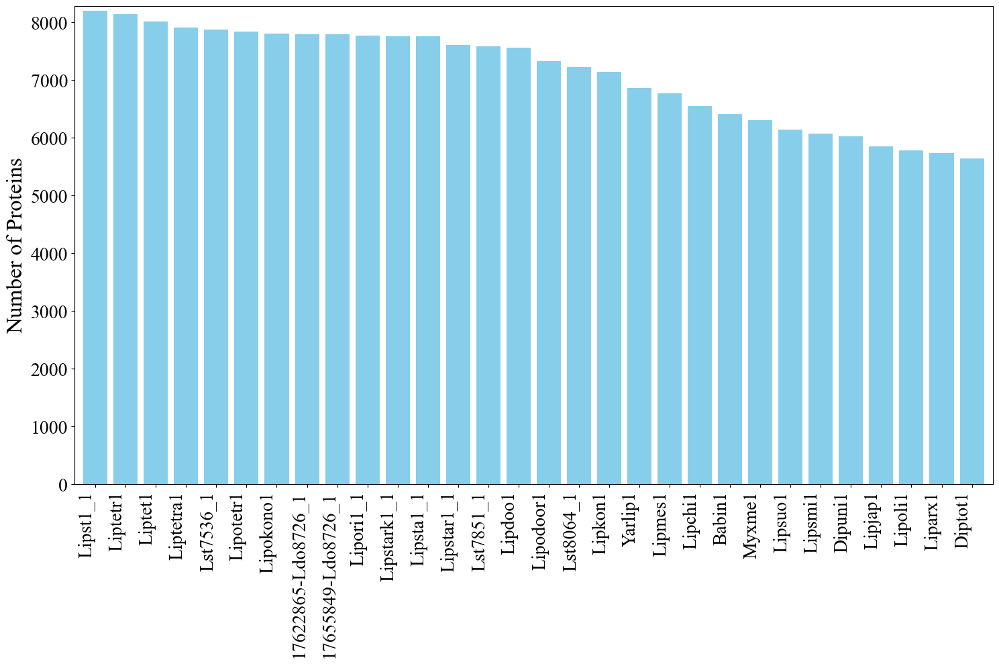

In [5]:
# Extracting filenames and their protein counts.
filenames = list(protein_count_dict.keys())
counts = list(protein_count_dict.values())

filenames = [filename.split('.')[0] for filename in filenames]
filenames = [modified_phrases.get(filename, filename) for filename in filenames]


# Getting indices that would sort counts.
sorted_indices = np.argsort(counts)[::-1]  # [::-1] is for descending order

# Sorting filenames and counts.
sorted_filenames = [filenames[i] for i in sorted_indices]
sorted_counts = [counts[i] for i in sorted_indices]


# Create a bar chart.
plt.figure(figsize=(15, 10))

plt.rcParams["font.family"] = "Times New Roman"

plt.bar(sorted_filenames, sorted_counts, color='skyblue')

plt.margins(0.01,0.01)

# Adding title and labels
# plt.title('Number of Proteins')
# plt.xlabel('Filename')
plt.ylabel('Number of Proteins',fontsize=24)
plt.xticks(rotation=90, ha='right',fontsize=20)  # Rotate x-axis labels for better visibility
plt.yticks(fontsize=20)
plt.tight_layout()
plt.savefig('protein_counts.png')
plt.show()

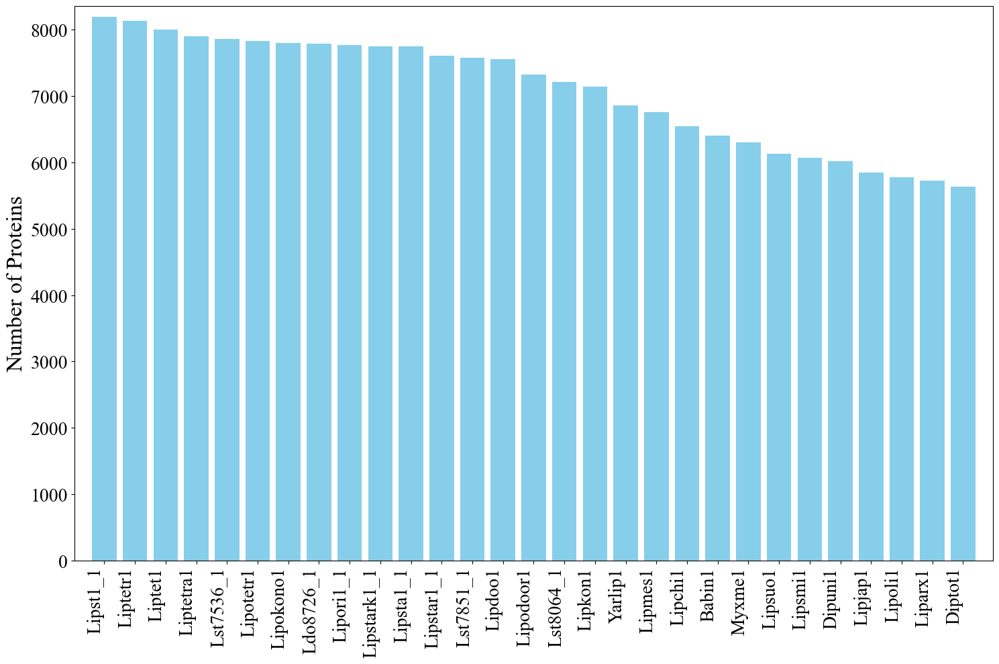

In [6]:
# Create a bar chart and remove the duplicate file names. 

# Filter out the duplicate label.
label_to_exclude = '17622865-Ldo8726_1'

# Replace the label name.
label_to_replace = '17655849-Ldo8726_1'
replaced_label = 'Ldo8726_1' 


# Create a bar chart.
plt.figure(figsize=(15, 10))  
plt.rcParams["font.family"] = "Times New Roman"

# Filter out the label to exclude.
filtered_filenames = [label for label in sorted_filenames if label != label_to_exclude]


# Create a list of counts corresponding to the filtered labels.
filtered_counts = [count for label, count in zip(sorted_filenames, sorted_counts) if label != label_to_exclude]

# Also replace the label in the counts list.
for i in range(len(filtered_filenames)):
    if filtered_filenames[i] == label_to_replace:
        filtered_filenames[i] = replaced_label

# Create the bar chart with the filtered and replaced labels and counts.
plt.bar(filtered_filenames, filtered_counts, color='skyblue')

# Adjust the x-axis limits to control margins.
plt.margins(0.02,0.02)

# Adding title and labels
# plt.title('Number of Proteins')
# plt.xlabel('Filename')
plt.ylabel('Number of Proteins', fontsize=24)
plt.xticks(rotation=90, ha='right', fontsize=20)  # Rotate x-axis labels for better visibility
plt.yticks(fontsize=20)
plt.tight_layout()
plt.savefig('protein_counts.png')
plt.show()


In [7]:
sorted_protein_counts = dict(zip(sorted_filenames, sorted_counts))
sorted_protein_counts

{'Lipst1_1': 8192,
 'Liptetr1': 8129,
 'Liptet1': 8004,
 'Liptetra1': 7903,
 'Lst7536_1': 7864,
 'Lipotetr1': 7831,
 'Lipokono1': 7799,
 '17622865-Ldo8726_1': 7790,
 '17655849-Ldo8726_1': 7790,
 'Lipori1_1': 7764,
 'Lipstark1_1': 7747,
 'Lipsta1_1': 7746,
 'Lipstar1_1': 7603,
 'Lst7851_1': 7581,
 'Lipdoo1': 7558,
 'Lipodoor1': 7320,
 'Lst8064_1': 7211,
 'Lipkon1': 7139,
 'Yarlip1': 6858,
 'Lipmes1': 6759,
 'Lipchi1': 6545,
 'Babin1': 6403,
 'Myxme1': 6299,
 'Lipsuo1': 6130,
 'Lipsmi1': 6067,
 'Dipuni1': 6018,
 'Lipjap1': 5843,
 'Lipoli1': 5781,
 'Liparx1': 5729,
 'Diptot1': 5632}

read in the annotated KEGG files downloaded from the JGI portal for each species. 

In [8]:
### annotated kegg proteins. 
# Directory with .gz files.
directory = 'kegg/'

annotated_kegg_counts = {}

# Load the data from each .gz file in the folder.
for filename in os.listdir(directory):
    if filename.endswith('.gz'):
        
        # Parse the code from the filename.
        code = re.split('_Gene|_Filtered', filename)[0]
        protein_id_count = 0

        # If the filename corresponds to the 'aaz' species (L. starkeyi NRRL-11557).
        with gzip.open(os.path.join(directory, filename), 'rt') as file:
            data = pd.read_csv(file, sep='\t')

            # Check if column '#proteinId' or 'proteinId' exists.
            if '#proteinId' in data.columns:
                protein_id_count = len(data['#proteinId'])
                
            elif 'proteinId' in data.columns:
                protein_id_count = len(data['proteinId'])

            # Storing the count in the dictionary.
            annotated_kegg_counts[code] = protein_id_count


In [9]:
annotated_kegg_counts

{'Lipjap1': 2237,
 'Liptetr1': 3022,
 'Lipoli1': 2257,
 'Lipotetr1': 3951,
 'Lipchi1': 2401,
 'Dipuni1': 2451,
 'Lipsuo1': 2622,
 'Babin1': 2964,
 'Lipstar1_1': 2832,
 'Liparx1': 2270,
 'Diptot1': 2180,
 'Lipmes1': 3763,
 'Ldo8726_1': 3952,
 'Lipokono1': 2750,
 'Lst7851_1': 2690,
 'Yarlip1': 2422,
 'Lipstark1_1': 2916,
 'Liptetra1': 2949,
 'Lst8064_1': 2641,
 'Lipodoor1': 2717,
 'Lipst1_1': 3741,
 'Lst7536_1': 2900,
 'Lipori1_1': 2958,
 'Lipsmi1': 2469,
 'Lipkon1': 2781,
 'Liptet1': 2973,
 'Lipdoo1': 2876,
 'Lipsta1_1': 2899,
 'Myxme1': 2591}

determine the annotated 'kog' counts using downloaded JGI KOG annotation files for each species. 

In [10]:
### annotated kegg proteins. 
# Directory with .gz files.
directory = 'kog/'

annotated_kog_counts = {}

# Load the data from each .gz file in the folder.
for filename in os.listdir(directory):
    if (filename.endswith('.tab')) and ('_eggnogec' not in filename):
        
        # Parse the code from the filename.
        code = re.split('_Gene|_Filtered',filename)[0]
        code = code.replace('_koginfo','')
                
        protein_id_count = 0

        with open(os.path.join(directory, filename), 'rt') as file:
            data = pd.read_csv(file, sep='\t')

            
            if '#proteinId' in data.columns:
                protein_id_count = len(data['#proteinId'])
            elif 'proteinId' in data.columns:
                protein_id_count = len(data['proteinId'])

            # Storing the count in the dictionary.
            annotated_kog_counts[code] = protein_id_count
          


plot a pie chart and analyze the group breakdown. 

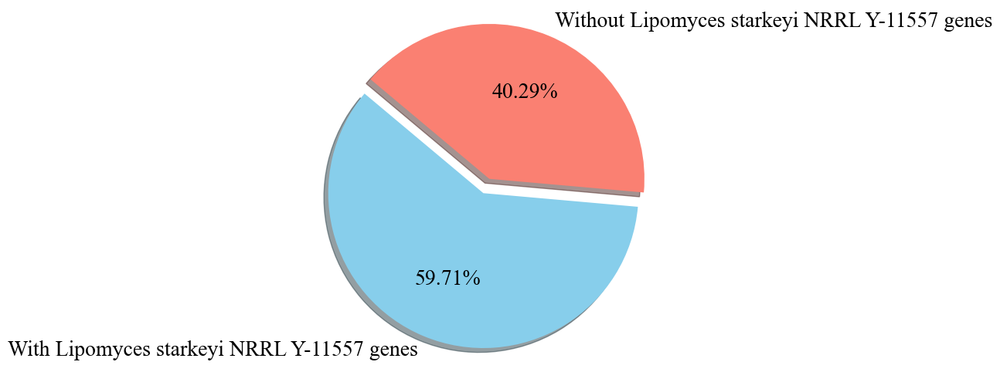

In [11]:

# Calculate percentage without 'aaz' (L. starkeyi NRRL Y-11557). 
percentage_without_aaz = 1 - percentage_with_aaz

# Data to plot
labels = ['With Lipomyces starkeyi NRRL Y-11557 genes', 'Without Lipomyces starkeyi NRRL Y-11557 genes']
sizes = [percentage_with_aaz, percentage_without_aaz]
colors = ['skyblue', 'salmon']
explode = (0.1, 0)  # explode 1st slice for emphasis

# Plotting the pie chart
plt.figure(figsize=(8, 6))
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 20})  


plt.pie(sizes, explode=explode, labels=labels, colors=colors,
autopct='%1.2f%%', shadow=True, startangle=140)

# plt.title("Percentage of groups with and without 'Lipst1_1 genes'")
plt.axis('equal')  
plt.savefig('piechart2.png')
plt.show()


create a co-occurance matrix of each species in the returned groups. 

In [12]:
ignored_codes = 'aau'


# Initialize co-occurrence matrix.
codes = sorted(list({entry.split('|')[0] for group in group_data.values() for entry in group}))
co_occurrence = pd.DataFrame(0, index=codes, columns=codes)

# Populate the co-occurrence matrix.
for group, entries in group_data.items():
    
    unique_codes_in_group = set(entry.split('|')[0] for entry in entries)

    # Quantify co-occurances. 
    for code1 in unique_codes_in_group:
        for code2 in unique_codes_in_group:
            co_occurrence.at[code1, code2] += 1

codes_to_drop = ["aau", "aau"]  # Replace with the actual codes you want to drop.

# Drop the specified codes from both rows and columns of the co_occurrence matrix
co_occurrence.drop(index=codes_to_drop, columns=codes_to_drop, inplace=True)
            

# Replace columns and index of the co_occurrence matrix with the species names. 
co_occurrence.columns = [modified_phrases[code] for code in co_occurrence.columns]
co_occurrence.index = [modified_phrases[code] for code in co_occurrence.index]
    

# Modify the name of a specific code
old_name = modified_phrases["aah"]
new_name = "Ldo8726_1"
co_occurrence.rename(index={old_name: new_name}, columns={old_name: new_name}, inplace=True)


In [13]:
co_occurrence.columns

Index(['Lst7851_1', 'Lipotetr1', 'Lipchi1', 'Liptetr1', 'Liptetra1', 'Liparx1',
       'Lst7536_1', 'Ldo8726_1', 'Lipokono1', 'Lst8064_1', 'Lipoli1',
       'Diptot1', 'Lipstar1_1', 'Lipodoor1', 'Lipstark1_1', 'Liptet1',
       'Lipsmi1', 'Lipjap1', 'Lipsuo1', 'Lipdoo1', 'Babin1', 'Lipori1_1',
       'Dipuni1', 'Yarlip1', 'Lipst1_1', 'Lipsta1_1', 'Lipmes1', 'Myxme1',
       'Lipkon1'],
      dtype='object')

In [14]:
co_occurrence

,Lst7851_1,Lipotetr1,Lipchi1,Liptetr1,Liptetra1,Liparx1,Lst7536_1,Ldo8726_1,Lipokono1,Lst8064_1,...,Lipdoo1,Babin1,Lipori1_1,Dipuni1,Yarlip1,Lipst1_1,Lipsta1_1,Lipmes1,Myxme1,Lipkon1
Lst7851_1,6581,5980,5818,6025,6002,5147,6218,6100,5918,6048,...,6072,3769,5993,5150,3998,6035,6190,5818,5057,5793
Lipotetr1,5980,7240,5724,6629,7067,5176,6047,6047,5990,5883,...,6018,3780,6211,5153,4006,5901,6029,5759,5082,5857
Lipchi1,5818,5724,6027,5740,5723,5097,5838,5798,5655,5797,...,5784,3745,5706,5052,3964,5696,5832,5668,4989,5600
Liptetr1,6025,6629,5740,7018,6649,5178,6102,6088,6002,5901,...,6061,3789,6264,5162,4012,5933,6082,5777,5091,5858
Liptetra1,6002,7067,5723,6649,7265,5175,6068,6054,5994,5891,...,6030,3778,6231,5160,4006,5911,6043,5756,5083,5856
Liparx1,5147,5176,5097,5178,5175,5322,5165,5157,5095,5143,...,5144,3714,5176,4962,3915,5048,5163,5112,4987,5063
Lst7536_1,6218,6047,5838,6102,6068,5165,7007,6163,5955,6103,...,6136,3785,6052,5166,4002,6120,6786,5844,5087,5837
Ldo8726_1,6100,6047,5798,6088,6054,5157,6163,7270,6044,5965,...,6650,3774,6084,5161,4004,6005,6131,5872,5078,5920
Lipokono1,5918,5990,5655,6002,5994,5095,5955,6044,6631,5788,...,6003,3766,5964,5112,3994,5862,5939,5708,5015,6098
Lst8064_1,6048,5883,5797,5901,5891,5143,6103,5965,5788,6407,...,5938,3754,5867,5105,3981,5936,6086,5779,5050,5703


create a cosine similarity matrix. 

In [388]:
# Cosine Similarity.
cosine_similarity = 1 - pairwise_distances(co_occurrence, metric="cosine")
# print("\nCosine Similarity Matrix:")
# print(cosine_similarity)

df_cosine_similarity = pd.DataFrame(cosine_similarity)


Cosine Similarity Matrix:
[[1.         0.9977439  0.99958732 0.99867551 0.99771027 0.99746525
  0.99947619 0.99898465 0.9992968  0.99975771 0.99669134 0.9961217
  0.99916769 0.99959143 0.99914472 0.99785818 0.99699278 0.9971202
  0.99639045 0.99933707 0.992344   0.99935506 0.99737084 0.99306772
  0.99911475 0.99947175 0.99956007 0.99615212 0.99930053]
 [0.9977439  1.         0.99756421 0.99957275 0.99996298 0.99552827
  0.9972266  0.99706468 0.99797085 0.99762333 0.99464882 0.99395246
  0.9967578  0.99779212 0.99673468 0.99990747 0.99495759 0.99512332
  0.994332   0.99747114 0.99009542 0.99879317 0.99537065 0.99083787
  0.99677843 0.99723342 0.99761061 0.99409051 0.99784764]
 [0.99958732 0.99756421 1.         0.99848441 0.99749829 0.99856876
  0.99904239 0.99874043 0.9992695  0.9997289  0.9979448  0.99745267
  0.99875084 0.99951492 0.99867031 0.99765258 0.99817303 0.99830011
  0.99765289 0.99915118 0.99400383 0.99928135 0.99843211 0.99465238
  0.99867449 0.99907418 0.99981666 0.997455

genome sizes as reported by JGI. 

In [363]:
genome_sizes_Mbp = {
    'Lipst1_1': 21.27,
    'Liptetr1': 20.46,
    'Liptet1': 20.78,
    'Liptetra1': 20.09,
    'Lst7536_1': 20.36,
    'Lipotetr1': 19.92,
    'Lipokono1': 19.38,
    'Ldo8726_1': 20.12,
    'Lipori1_1': 19.86,
    'Lipstark1_1': 20.06,
    'Lipsta1_1': 19.97,
    'Lipstar1_1': 19.59,
    'Lst7851_1': 19.72,
    'Lipdoo1': 19.4,
    'Lipodoor1': 18.88,
    'Lst8064_1': 18.44,
    'Lipkon1': 16.95,
    'Yarlip1': 20.08,
    'Lipmes1': 16.87,
    'Lipchi1': 16.37,
    'Babin1': 15.22,
    'Myxme1': 15.33,
    'Lipsuo1': 14,
    'Lipsmi1': 14.15,
    'Dipuni1': 16.24,
    'Lipjap1': 13.37,
    'Lipoli1': 13.58,
    'Liparx1': 11.92,
    'Diptot1': 13.13
}


create a phylogenetic graph using cosine similiarity matrix. 

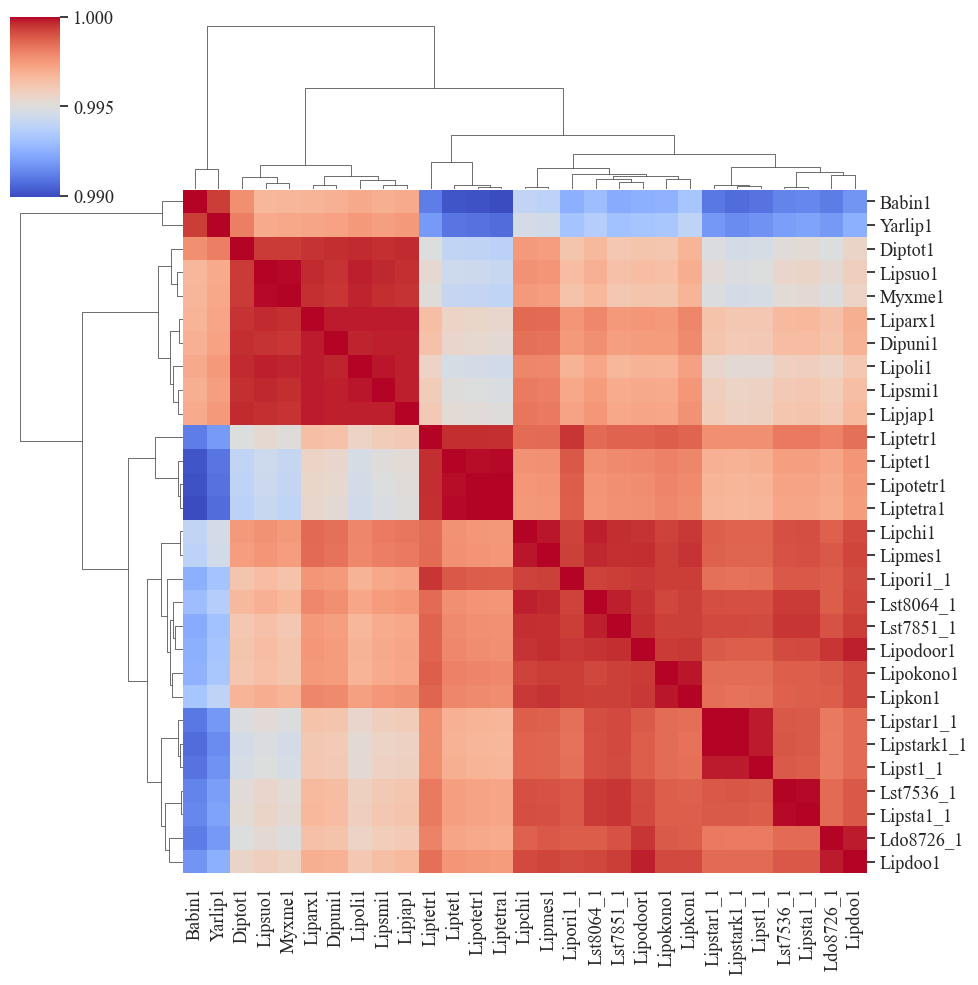

In [267]:
labels = co_occurrence.index.tolist()

# Convert cosine_similarity to a DataFrame (if it's a numpy array)
if isinstance(cosine_similarity, np.ndarray):
    cosine_similarity_df = pd.DataFrame(cosine_similarity, index=labels, columns=labels)
else:
    cosine_similarity_df = cosine_similarity 

sns.clustermap(cosine_similarity_df, cmap='coolwarm')
# plt.rcParams.update({'font.size': 12}) 

sns.set(font="Times New Roman", font_scale=1.2)  
# legend = plt.legend(title="My Legend", fontsize=10)  # Adjust the font size for the legend

# legend.get_title().set_fontsize(12)
# plt.rcParams["font.family"] = "Times New Roman"

plt.savefig('dendogram_testsimilarity.png')
plt.show()

In [386]:
strains_dict = {
    'Lipst1_1': 'Lipomyces starkeyi NRRL Y-11557',
    'Liptetr1': 'Lipomyces tetrasporus NRRL Y-11562',
    'Liptet1': 'Lipomyces tetrasporus NRRL Y-64009',
    'Liptetra1': 'Lipomyces tetrasporus NRRL Y-8875',
    'Lst7536_1': 'Lipomyces starkeyi CBS 7536',
    'Lipotetr1': 'Lipomyces tetrasporus Phaff 51-55',
    'Lipokono1': 'Lipomyces kononenkoae CBS 7786',
    'Ldo8726_1': 'Lipomyces doorenjongii CBS 8726',
    'Lipori1_1': 'Lipomyces orientalis CBS 10300',
    'Lipstark1_1': 'Lipomyces starkeyi Phaff 55-103',
    'Lipsta1_1': 'Lipomyces starkeyi Phaff 78-25',
    'Lipstar1_1': 'Lipomyces starkeyi Phaff 78-24',
    'Lst7851_1': 'Lipomyces starkeyi CBS 7851',
    'Lipdoo1': 'Lipomyces doorenjongii Phaff 78-26',
    'Lipodoor1': 'Lipomyces doorenjongii NRRL Y-27504',
    'Lst8064_1': 'Lipomyces starkeyi CBS 8064',
    'Lipkon1': 'Lipomyces kononenkoae NRRL Y-11553',
    'Yarlip1': 'Yarrowia lipolytica FKP355',
    'Lipmes1': 'Lipomyces mesembrius CBS 7600',
    'Lipchi1': 'Lipomyces chichibuensis CBS 12929',
    'Babin1': 'Babjeviella inositovora NRRL Y-12698',
    'Myxme1': 'Myxozyma melibiosi Phaff 52-87',
    'Lipsuo1': 'Lipomyces suomiensis NRRL Y-17356',
    'Lipsmi1': 'Lipomyces smithiae NRRL Y-17922',
    'Dipuni1': 'Dipodascopsis uninucleata Phaff 50-6',
    'Lipjap1': 'Lipomyces japonicus CBS 7319',
    'Lipoli1': 'Lipomyces oligophaga CBS 7107',
    'Liparx1': 'Lipomyces arxii Phaff 12-163',
    'Diptot1': 'Dipodascopsis tothii CBS 759.85',
}


create a second phylogenetic graph with the cosine similarity metrics and also include genome size on the graph. 

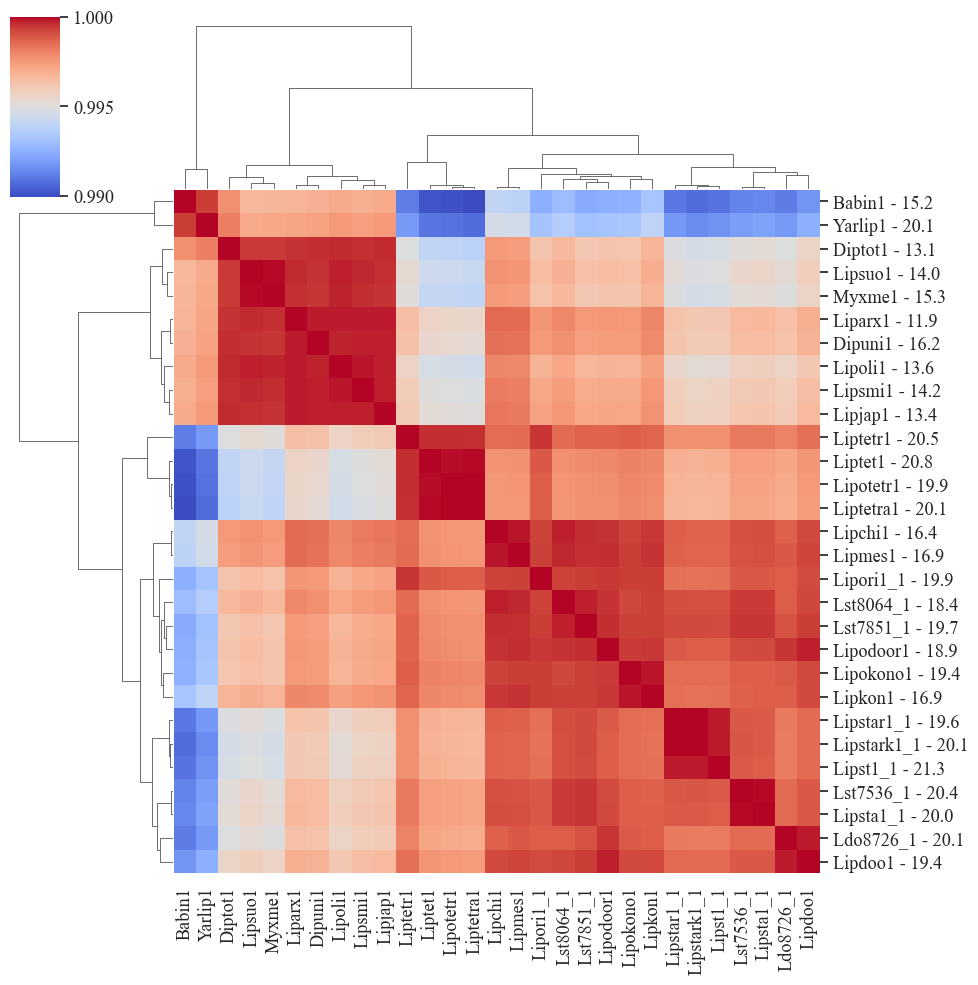

In [393]:

labels = co_occurrence.index.tolist()

# Modify the labels to include keys and values from the data dictionary
y_labels = [f'{label} - {genome_sizes_Mbp.get(label, "N/A"):.1f}' for label in labels]
x_labels = labels

# Convert cosine_similarity to a DataFrame (if it's a numpy array)
if isinstance(cosine_similarity, np.ndarray):
    cosine_similarity_df = pd.DataFrame(cosine_similarity, index=labels, columns=labels)
else:
    cosine_similarity_df = cosine_similarity

sns.clustermap(cosine_similarity_df, cmap='coolwarm',xticklabels=x_labels, yticklabels=y_labels)

sns.set(font="Times New Roman", font_scale=1.2)
plt.savefig('dendrogram_testsimilarity_genome.png')
plt.show()


third option with long names. 

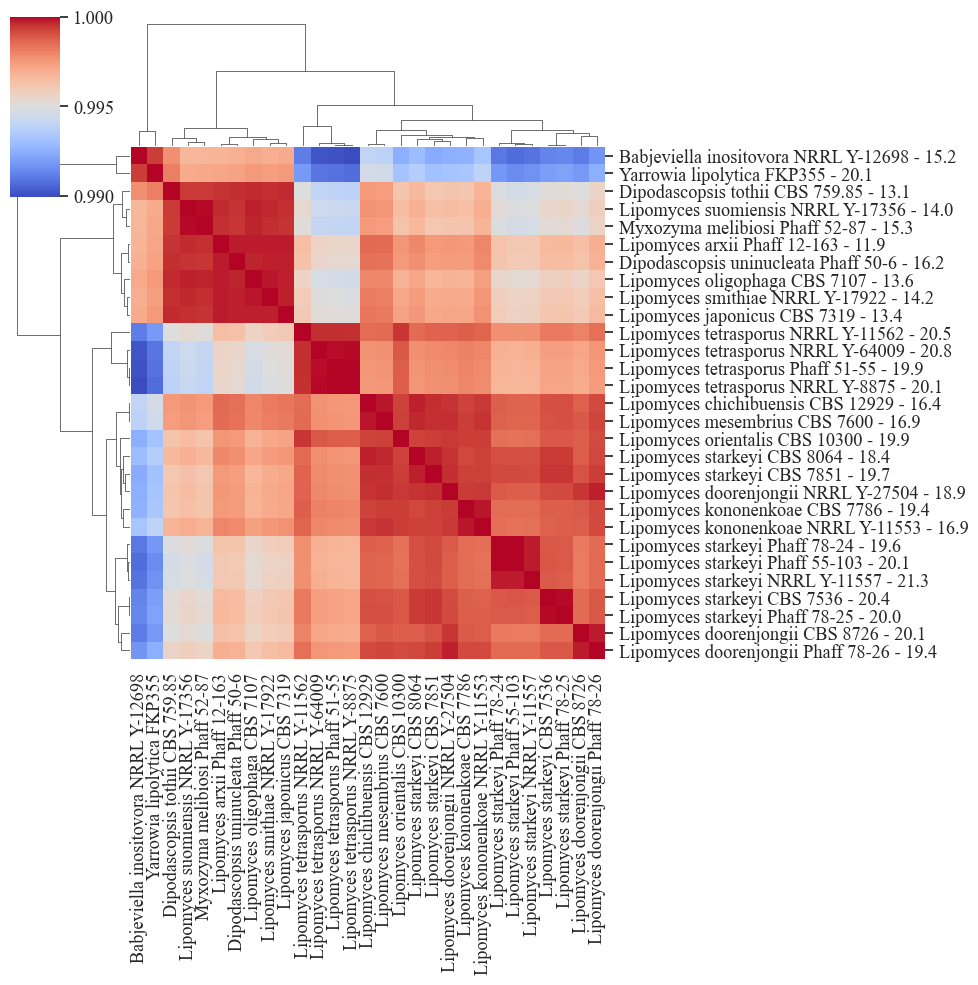

In [394]:
# labels = co_occurrence.index.tolist()



labels = co_occurrence.index.tolist()

# Modify the labels to include keys and values from the data dictionary.
y_labels = [f'{strains_dict.get(label, label)} - {genome_sizes_Mbp.get(label, "N/A"):.1f}' for label in co_occurrence.index]
x_labels = [strains_dict.get(label, label) for label in co_occurrence.columns]


# Convert cosine_similarity to a DataFrame (if it's a numpy array).
if isinstance(cosine_similarity, np.ndarray):
    cosine_similarity_df = pd.DataFrame(cosine_similarity, index=labels, columns=labels)
else:
    cosine_similarity_df = cosine_similarity



# Plot the clustermap
sns.clustermap(cosine_similarity_df, cmap='coolwarm', xticklabels=x_labels, yticklabels=y_labels)

sns.set(font="Times New Roman", font_scale=1.2)
plt.savefig('dendrogram_testsimilarity_genome2.png')
plt.show()

In [208]:
cosine_similarity_df.to_csv('cosine_similarity_df.csv')

In [70]:
# calculate the percent of times that a species is in a group with L. starkeyi ('aaz') and the 
# percent that the species in out of group with L. starkeyi ('aaz'). 
# for each individual species. 


aaz_codes = defaultdict(int)
non_aaz_codes = defaultdict(int)

# iterate through the data. 
for group, entries in group_data.items():
    unique_codes_in_group = set(entry.split('|')[0] for entry in entries)
    
    # find the L. starkeyi containing groups and count the species with L. starkeyi in the group.
    if any('aaz' in entry for entry in entries):
        for code in unique_codes_in_group:
            aaz_codes[code] += 1
    else:
        for code in unique_codes_in_group:
            non_aaz_codes[code] += 1

# Convert counts to percentages.
total_aaz_groups = sum(1 for entries in group_data.values() if any('aaz' in entry for entry in entries))
total_non_aaz_groups = len(group_data) - total_aaz_groups

aaz_percentages = {code: (count / total_aaz_groups) * 100 for code, count in aaz_codes.items()}
non_aaz_percentages = {code: (count / total_non_aaz_groups) * 100 for code, count in non_aaz_codes.items()}

# print out the results. 
print("Percentages of codes in 'Lipst1_1' groups:")
sorted_aaz_percentages = sorted(aaz_percentages.items(), key=lambda x: x[1], reverse=True)

sorted_aaz_percentages_with_phrases = {modified_phrases[code]: percentage for code, percentage in sorted_aaz_percentages}

for code, percentage in sorted_aaz_percentages_with_phrases.items():
    print(f"{code}: {percentage:.2f}%")

print("\nPercentages of codes in non-'Lipst1_1' groups:")
sorted_non_aaz_percentages = sorted(non_aaz_percentages.items(), key=lambda x: x[1], reverse=True)

sorted_non_aaz_percentages_with_phrases = {modified_phrases[code]: percentage for code, percentage in sorted_non_aaz_percentages}

for code, percentage in sorted_non_aaz_percentages_with_phrases.items():
    print(f"{code}: {percentage:.2f}%")



Percentages of codes in 'Lipst1_1' groups:
Lipst1_1: 100.00%
Lipstark1_1: 95.27%
Lipstar1_1: 94.27%
Lst7536_1: 88.29%
Lipsta1_1: 87.78%
Lst7851_1: 87.06%
17655849-Ldo8726_1: 86.63%
17622865-Ldo8726_1: 86.63%
Lipdoo1: 86.22%
Liptet1: 85.75%
Lst8064_1: 85.63%
Liptetr1: 85.59%
Lipodoor1: 85.56%
Liptetra1: 85.27%
Lipotetr1: 85.13%
Lipori1_1: 84.77%
Lipokono1: 84.56%
Lipkon1: 82.54%
Lipmes1: 82.39%
Lipchi1: 82.17%
Dipuni1: 72.85%
Liparx1: 72.82%
Lipsuo1: 72.55%
Lipsmi1: 72.10%
Myxme1: 71.71%
Lipjap1: 71.05%
Lipoli1: 70.69%
Diptot1: 66.98%
Yarlip1: 56.79%
Babin1: 53.64%

Percentages of codes in non-'Lipst1_1' groups:
Liptetra1: 28.94%
Lipotetr1: 28.62%
Liptet1: 27.30%
17622865-Ldo8726_1: 27.04%
17655849-Ldo8726_1: 27.04%
Liptetr1: 23.19%
Lst7536_1: 18.96%
Lipsta1_1: 18.85%
Lipdoo1: 18.45%
Lipokono1: 16.44%
Lipori1_1: 16.33%
Lipkon1: 13.21%
Lipodoor1: 13.10%
Lipsuo1: 12.29%
Myxme1: 12.25%
Lst7851_1: 11.67%
Lipstark1_1: 10.24%
Lst8064_1: 10.07%
Yarlip1: 9.98%
Lipstar1_1: 9.71%
Babin1: 8.53%
Li

graph the species co-occurence in groups with and without NRRL-11557. 

/var/folders/kn/zzns_smn1q79xdnf1tgqk__r0000gn/T/ipykernel_60970/184193751.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_yticklabels([f"{int(val):d}%" for val in ax1.get_yticks()], fontsize=20)  # Adjust the y-axis tick label font size and format
/var/folders/kn/zzns_smn1q79xdnf1tgqk__r0000gn/T/ipykernel_60970/184193751.py:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels([f"{int(val):d}%" for val in ax2.get_yticks()], fontsize=20)  # Adjust the y-axis tick label font size and format


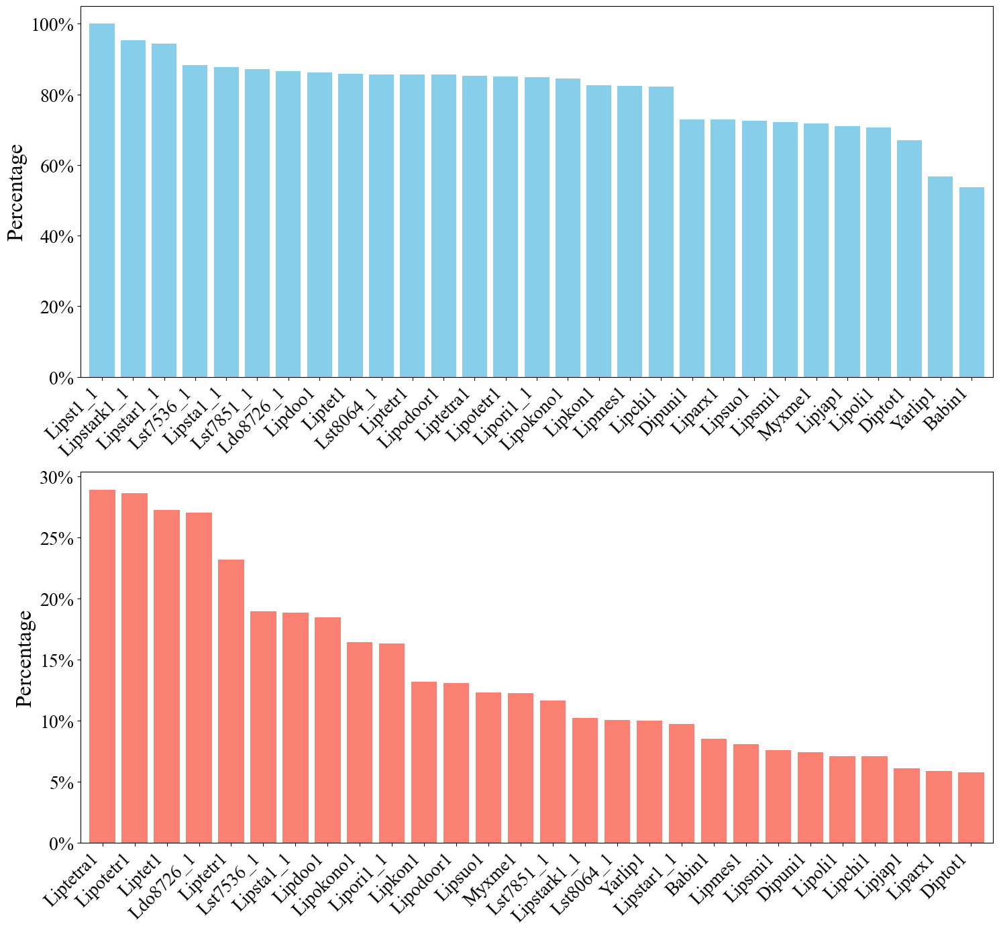

In [304]:


# Define the figure and the subplots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(15, 14))


plt.style.use('default')
plt.rcParams["font.family"] = "Times New Roman"

# For the 'Lipst1_1' groups
labels, values = zip(*sorted_aaz_percentages_with_phrases.items())
labels_values_updated = [(label if label != modified_phrases['aau'] else 'Ldo8726_1', value) for label, value in zip(labels, values) if label != modified_phrases['aah']]

labels, values = zip(*labels_values_updated)

ax1.bar(labels, values, color='skyblue')
ax1.set_xticks(labels)
ax1.set_xticklabels(labels, rotation=45, ha='right', fontsize=20)
ax1.set_yticklabels([f"{int(val):d}%" for val in ax1.get_yticks()], fontsize=20)  # Adjust the y-axis tick label font size and format
ax1.set_ylabel("Percentage", fontsize=24)
ax1.margins(x=0.01)

# For non-'Lipst1_1' groups
labels, values = zip(*sorted_non_aaz_percentages_with_phrases.items())
labels_values_updated = [(label if label != modified_phrases['aau'] else 'Ldo8726_1', value) for label, value in zip(labels, values) if label != modified_phrases['aah']]
labels, values = zip(*labels_values_updated)

ax2.bar(labels, values, color='salmon')
ax2.set_xticks(labels)
ax2.set_xticklabels(labels, rotation=45, ha='right', fontsize=20)
ax2.set_yticklabels([f"{int(val):d}%" for val in ax2.get_yticks()], fontsize=20)  # Adjust the y-axis tick label font size and format
ax2.set_ylabel("Percentage", fontsize=24)
ax2.margins(x=0.01)

plt.tight_layout()
plt.savefig('percents_combined.png')
plt.show()


plot species distances from NRRL Y-11557 using euclidean distance and then cosine similarity. 

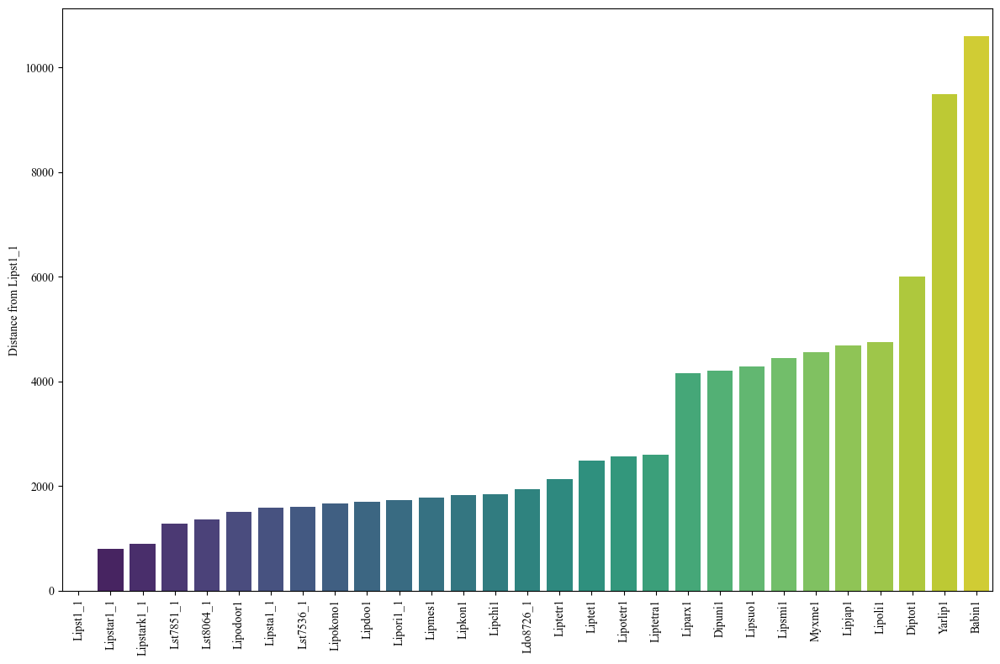

In [307]:
# Calculate distance from 'aaz' using Euclidean distance.
aaz_vector = co_occurrence.loc['Lipst1_1']
distances = np.sqrt(((co_occurrence - aaz_vector) ** 2).sum(axis=1))
distances = distances.sort_values()

# Visualize the distances using a bar chart.
plt.figure(figsize=(12, 8))
plt.style.use('default')
plt.rcParams["font.family"] = "Times New Roman"


sns.barplot(x=distances.index, y=distances.values, palette="viridis")
plt.xticks(rotation=90)
plt.ylabel('Distance from Lipst1_1')
# plt.title('Distance of Each Species from Lipst1_1 based on Co-occurrence')
plt.tight_layout()
plt.savefig('distance.png')
plt.show()

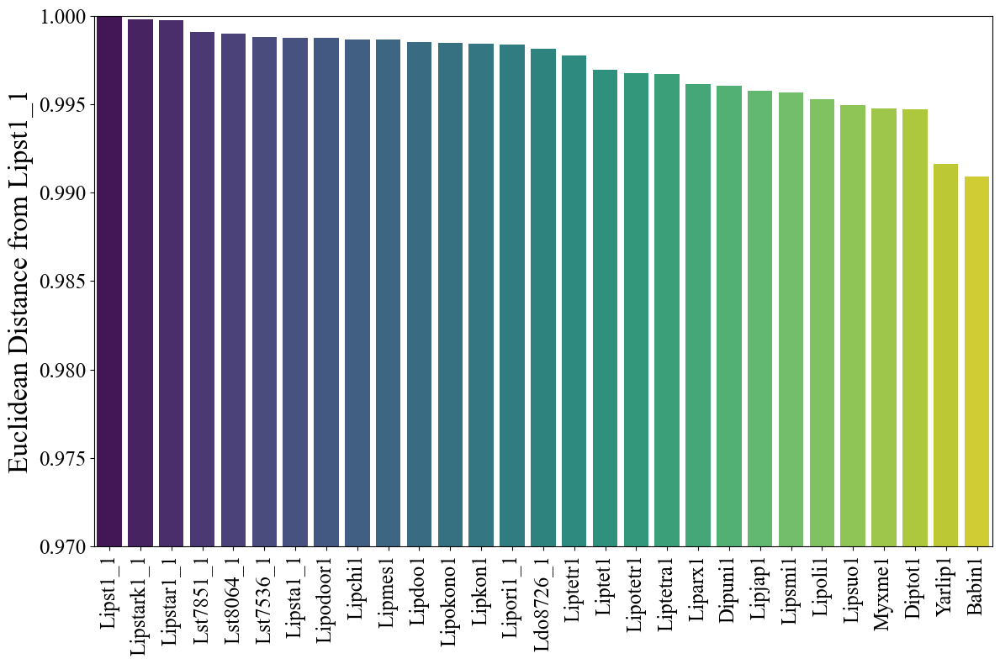

In [311]:
# Calculate distance from 'aaz' using Euclidean distance.
aaz_vector = cosine_similarity_df.loc['Lipst1_1']
# distances = np.sqrt(((cosine_similarity_df - aaz_vector) ** 2).sum(axis=1))
aaz_vector = aaz_vector.sort_values(ascending=False)

# Visualize the distances using a bar chart.
plt.figure(figsize=(12, 8))
# plt.style.use('default')
plt.rcParams["font.family"] = "Times New Roman"

sns.barplot(x=aaz_vector.index, y=aaz_vector.values, palette="viridis")
plt.xticks(rotation=90,fontsize=18)
plt.yticks(fontsize=18)

plt.ylabel('Similarity to Lipst1_1',fontsize=24)
plt.ylim(0.97, 1)  # Set the y-axis range here
# plt.title('Distance of Each Species from Lipst1_1 based on Co-occurrence')
plt.tight_layout()
plt.savefig('similarity.png')
plt.show()

Plot all individual species as euclidean distances. 

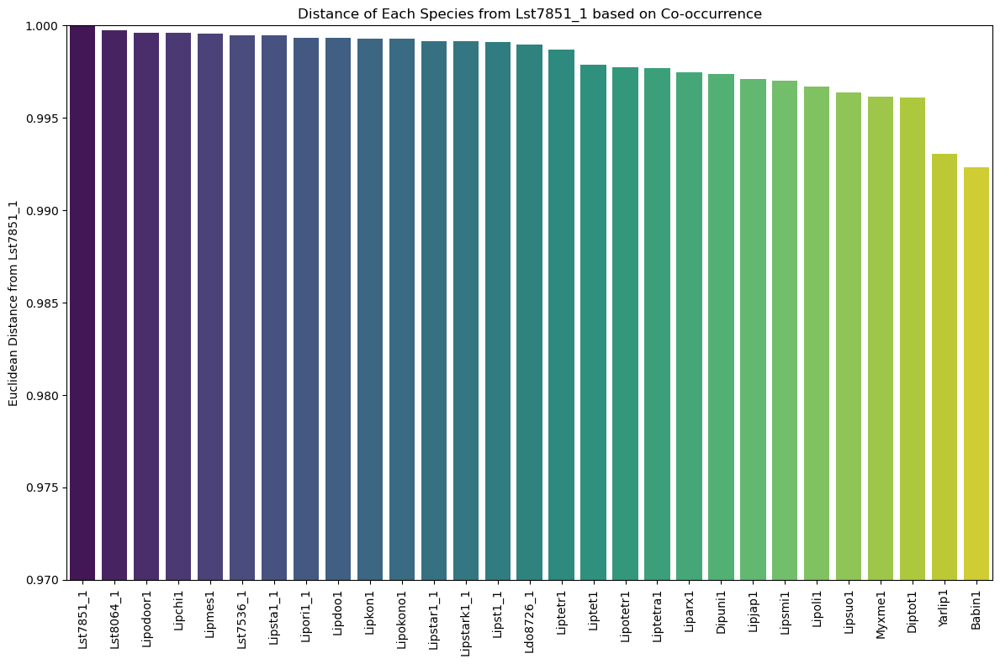

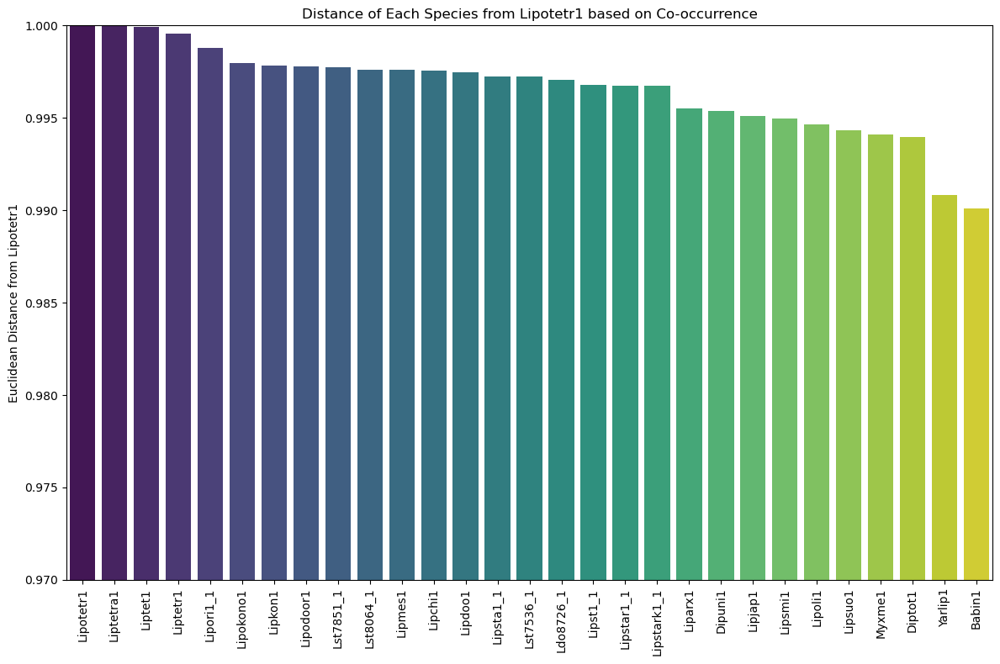

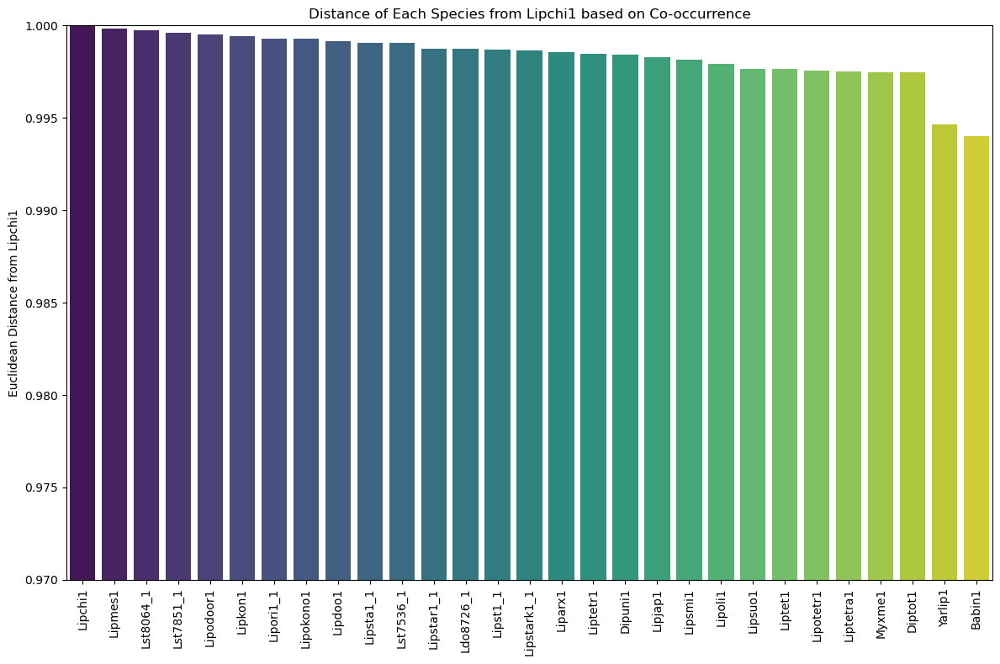

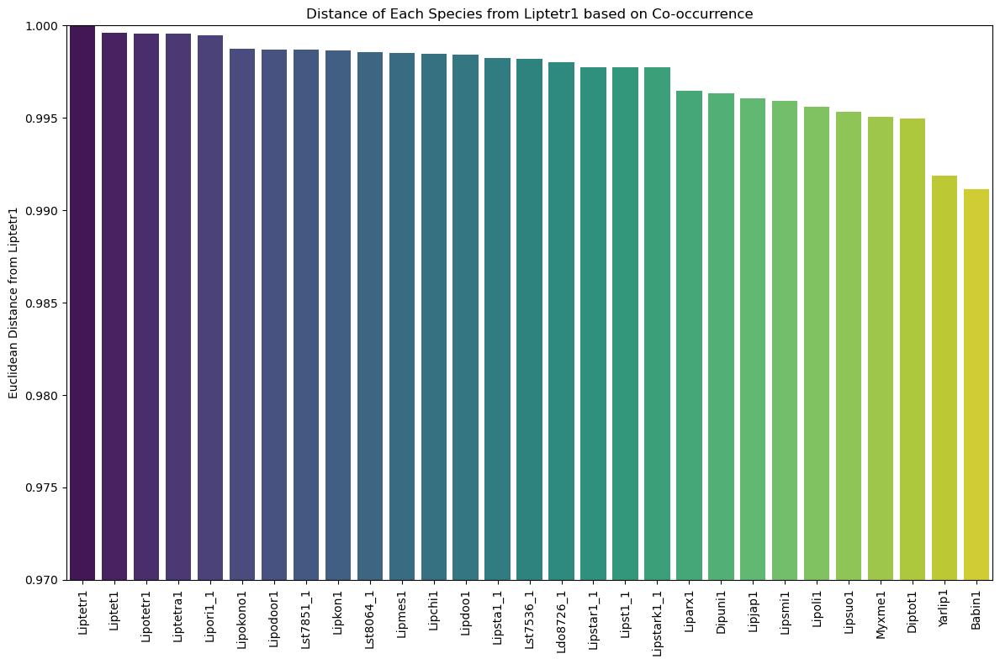

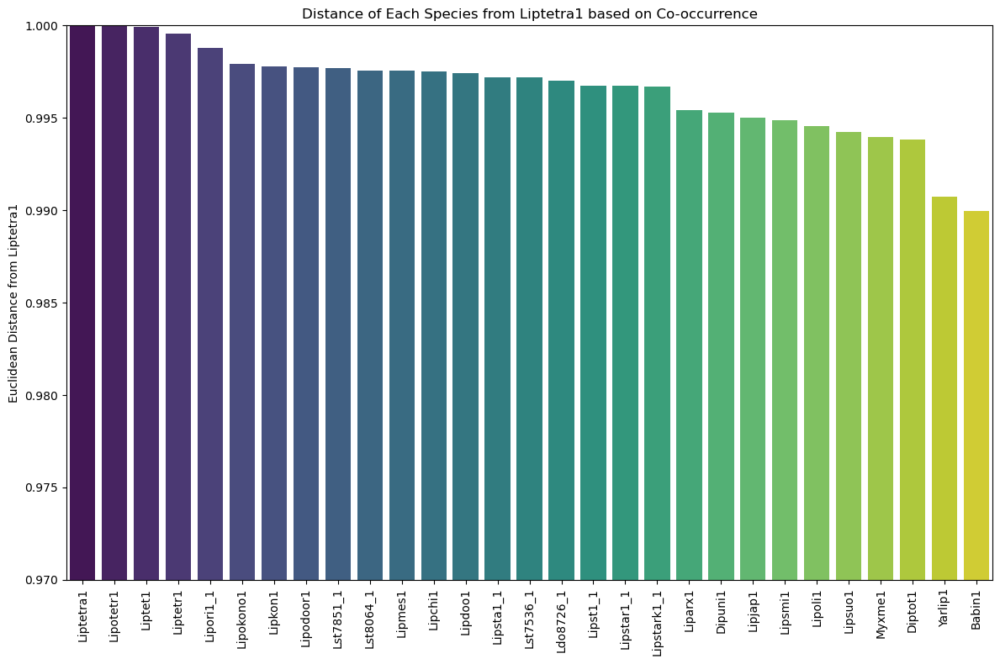

...

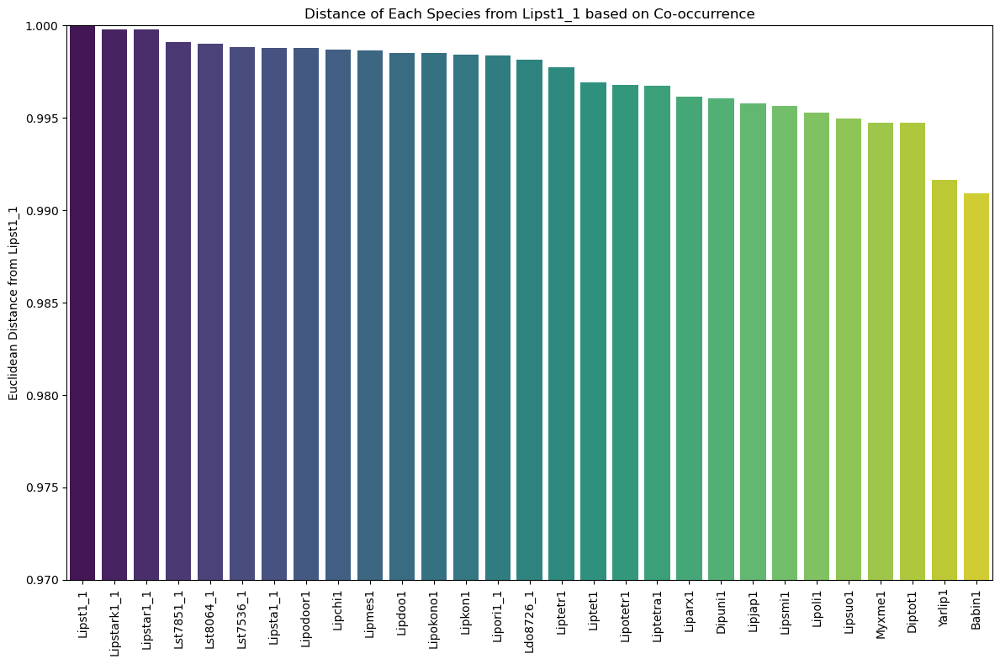

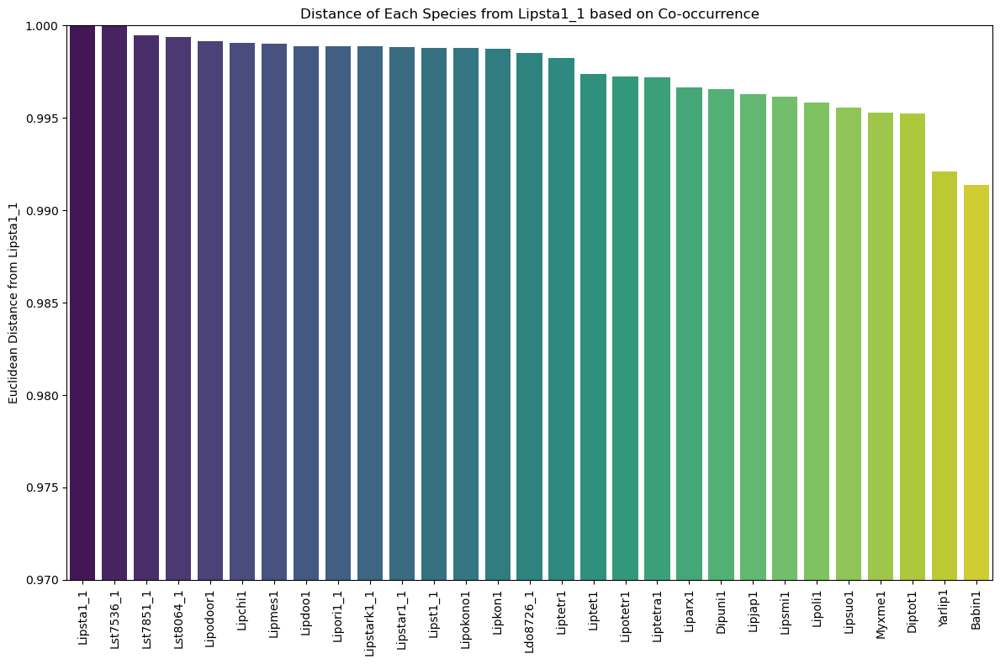

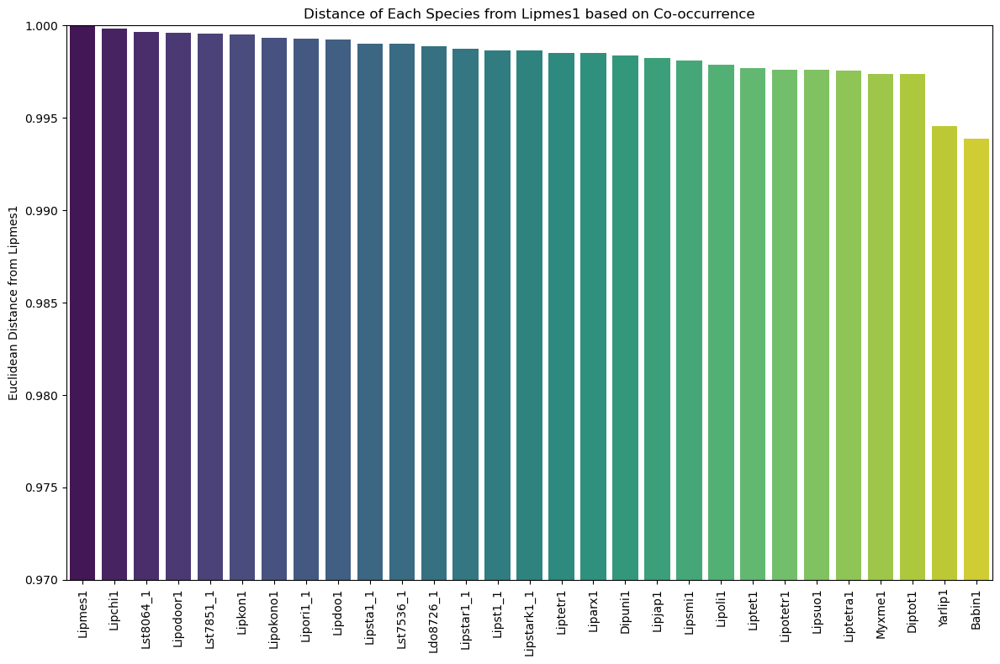

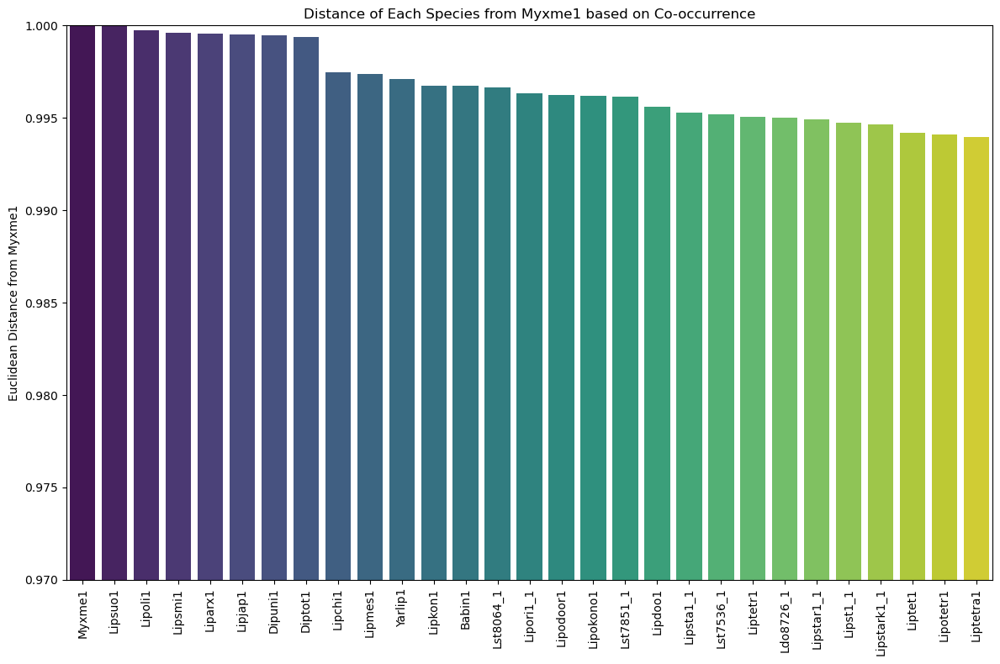

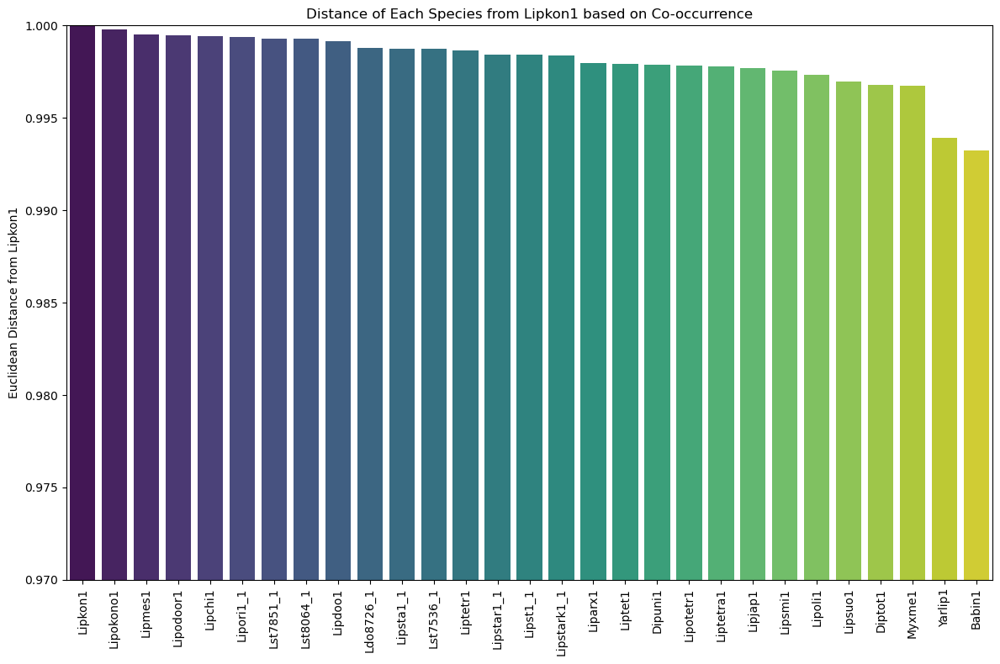

In [214]:
all_vectors = pd.DataFrame()

for k in cosine_similarity_df.columns:
    # Calculate distance from 'aaz' using Euclidean distance.
    _vector = cosine_similarity_df.loc[k]
    # distances = np.sqrt(((cosine_similarity_df - aaz_vector) ** 2).sum(axis=1))
    _vector = _vector.sort_values(ascending=False)
    all_vectors[k] = _vector    # Visualize the distances using a bar chart.
    plt.figure(figsize=(12, 8))
    sns.barplot(x=_vector.index, y=_vector.values, palette="viridis")
    plt.xticks(rotation=90)
    plt.ylabel(f'Euclidean Distance from {k}')
    plt.ylim(0.97, 1)  # Set the y-axis range here
    plt.title(f'Distance of Each Species from {k} based on Co-occurrence')
    plt.tight_layout()
    plt.savefig(f'similarity_{k}.png')
    plt.show()

all_vectors.to_csv('all_vectors.csv', index=False)


determine distribution of group sizes. 

In [339]:
# count sizes. 
aaz_group_sizes = defaultdict(int)
non_aaz_group_sizes = defaultdict(int)

# Iterate through the data.
for group, entries in group_data.items():
    unique_codes_in_group = set(entry.split('|')[0] for entry in entries)

    # Determine if it's an 'aaz' group or non-'aaz' group.
    is_aaz_group = any('aaz' in entry for entry in entries)

    # Count the species in each group.
    group_size = len(unique_codes_in_group)

    # Update the appropriate dictionary based on the group type.
    if is_aaz_group:
        aaz_group_sizes[group_size] += 1
    else:
        non_aaz_group_sizes[group_size] += 1

# Print out the results for 'aaz' groups.
print("Size distribution of 'aaz' groups:")
for size, count in aaz_group_sizes.items():
    print(f"Group Size {size}: {count} groups")

# Print out the results for non-'aaz' groups.
print("\nSize distribution of non-'aaz' groups:")
for size, count in non_aaz_group_sizes.items():
    print(f"Group Size {size}: {count} groups")


Size distribution of 'aaz' groups:
Group Size 28: 529 groups
Group Size 29: 649 groups
Group Size 30: 3185 groups
Group Size 23: 92 groups
Group Size 20: 173 groups
Group Size 26: 120 groups
Group Size 24: 98 groups
Group Size 22: 85 groups
Group Size 27: 283 groups
Group Size 21: 108 groups
Group Size 25: 107 groups
Group Size 18: 88 groups
Group Size 19: 91 groups
Group Size 14: 63 groups
Group Size 16: 51 groups
Group Size 17: 73 groups
Group Size 13: 57 groups
Group Size 15: 63 groups
Group Size 1: 40 groups
Group Size 9: 53 groups
Group Size 11: 60 groups
Group Size 12: 43 groups
Group Size 10: 52 groups
Group Size 3: 257 groups
Group Size 5: 82 groups
Group Size 7: 61 groups
Group Size 8: 49 groups
Group Size 6: 66 groups
Group Size 2: 154 groups
Group Size 4: 100 groups

Size distribution of non-'aaz' groups:
Group Size 18: 6 groups
Group Size 14: 26 groups
Group Size 23: 11 groups
Group Size 1: 426 groups
Group Size 13: 26 groups
Group Size 26: 11 groups
Group Size 29: 41 group

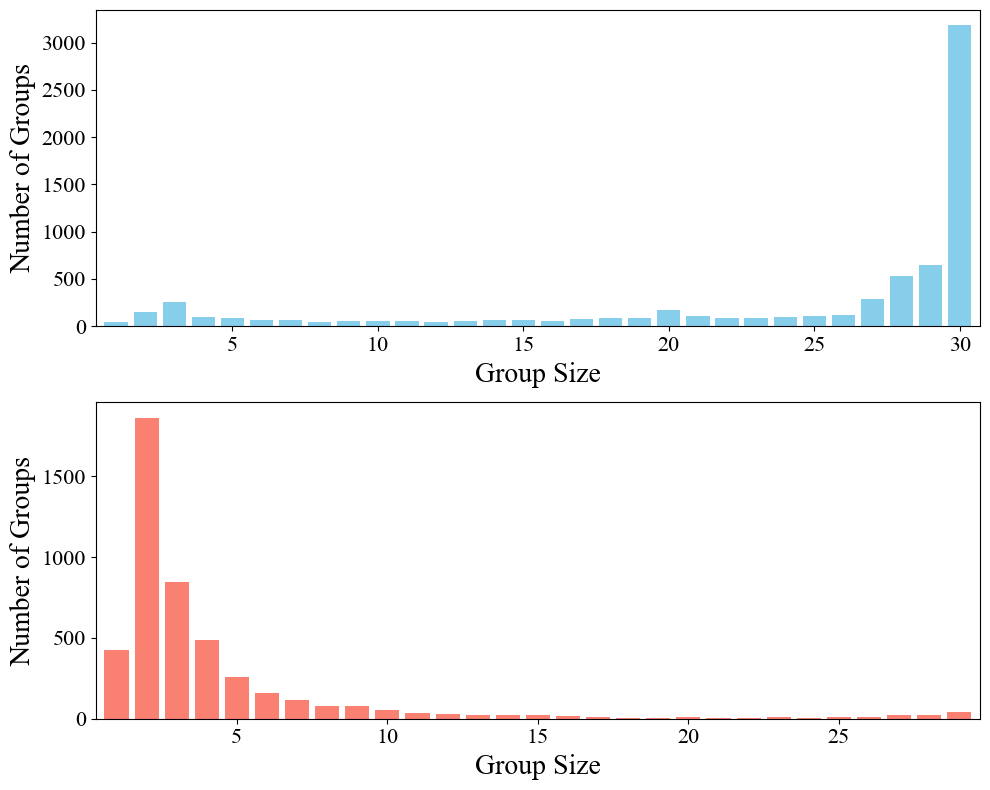

In [346]:
# plot the distribution. 

# Set the font family to Times New Roman
plt.rcParams["font.family"] = "Times New Roman"

# Extract the sizes and counts for 'aaz' and non-'aaz' groups.
aaz_sizes = list(aaz_group_sizes.keys())
aaz_counts = list(aaz_group_sizes.values())

non_aaz_sizes = list(non_aaz_group_sizes.keys())
non_aaz_counts = list(non_aaz_group_sizes.values())

# Create a figure and subplots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

# Plot 'aaz' group size distribution
ax1.bar(aaz_sizes, aaz_counts, color='skyblue', width=0.8)
# ax1.set_title("Lipst1_1 Group Size Distribution")
ax1.set_xlabel("Group Size",fontsize=20)
ax1.set_ylabel("Number of Groups",fontsize=20)
ax1.tick_params(axis='both',labelsize=16)
ax1.margins(x=0.01)


# Plot non-'aaz' group size distribution
ax2.bar(non_aaz_sizes, non_aaz_counts, color='salmon', width=0.8)
# ax2.set_title("Non-Lipst1_1 Group Size Distribution")
ax2.set_xlabel("Group Size",fontsize=20)
ax2.set_ylabel("Number of Groups",fontsize=20)
ax2.tick_params(axis='both',labelsize=16)
ax2.margins(x=0.01)

plt.tight_layout()
plt.savefig('GroupSizeDistribution.png')
plt.show()


# Part two. 
## Task 2a. 
### Associating groups with KEGG annotated & ECC numbers. 

In [78]:
# invert the dictionary to obtain a new dictionary with species as keys and codes as values. 
inverted_phrases = {v: k for k, v in modified_phrases.items()}


In [79]:
# this cell annotates the groups ONLY using the JGI KEGG annotations. 

# Directory with .gz files.
directory = 'kegg/'

# Dictionary to hold L. starkeyi aaz protein IDs and their corresponding pathways.
aaz_pathways = {}

# Load the data from each .gz file in the folder.
for filename in os.listdir(directory):
    if filename.endswith('.gz'):
        
        # Parse the code from the filename.
        code = re.split('_Gene|_Filtered',filename)[0]

        # If the filename corresponds to the 'aaz' species
        if filename.startswith("Lipst1_1"):
            with gzip.open(os.path.join(directory, filename), 'rt') as file:
                data = pd.read_csv(file, sep='\t')



                for _, row in data.iterrows():
                    protein_id = row['#proteinId']
                    pathway = row['pathway']

                    if protein_id not in aaz_pathways:
                        aaz_pathways[protein_id] = []
                    aaz_pathways[protein_id].append(pathway)

# Now, for each group, determine its associated pathways based on the aaz protein IDs it contains.
group_pathways = {}
for group, entries in group_data.items():
    for entry in entries:
        if entry.startswith('aaz|'):
            group_pathways[group] = aaz_pathways.get(int(entry.split('|')[1]), [])

# Print out the pathways for each group.
for group, pathways in group_pathways.items():
    print(f"{group}: {' | '.join(pathways)}")


OG0000:: 
OG0001:: Pentose and glucuronate interconversions
OG0002:: 
OG0003:: 
OG0004:: 
OG0005:: 
OG0006:: Galactose metabolism | Starch and sucrose metabolism
OG0007:: 
OG0008:: 
OG0009:: 
OG0010:: Purine metabolism
OG0011:: 
OG0012:: 
OG0013:: 
OG0014:: gamma-Hexachlorocyclohexane degradation | Riboflavin metabolism
OG0015:: 
OG0016:: 
OG0017:: 
OG0018:: Aminosugars metabolism
OG0019:: 
OG0020:: 
OG0021:: Pentose and glucuronate interconversions
OG0022:: Pentose and glucuronate interconversions
OG0023:: 
OG0024:: 
OG0025:: Glyoxylate and dicarboxylate metabolism | Nitrogen metabolism | Tryptophan metabolism
OG0026:: 
OG0027:: 
OG0029:: Starch and sucrose metabolism | Cyanoamino acid metabolism | Flavonoids, stilbene and lignin biosynthesis
OG0030:: 
OG0031:: Tryptophan metabolism | Fatty acid metabolism | gamma-Hexachlorocyclohexane degradation
OG0032:: 
OG0033:: Galactose metabolism | Starch and sucrose metabolism
OG0034:: 
OG0035:: 
OG0036:: Pentose and glucuronate interconversio

In [80]:
# this cell counts the number a times a group has been designated as belonging to a pathway (based on NRRL Y-11557 KEGG annotation). 


# Count of each unique pathway for 'aaz'
aaz_unique_pathway_count = defaultdict(int)
for group, pathways in group_pathways.items():
    unique_pathways_in_group = set(pathways)
    for pathway in unique_pathways_in_group:
        aaz_unique_pathway_count[pathway] += 1

# For each code, count the unique pathways
code_to_unique_pathways = defaultdict(lambda: defaultdict(int))
for group, entries in group_data.items():
    unique_codes_in_group = set(entry.split('|')[0] for entry in entries)
    for code in unique_codes_in_group:
        for pathway in group_pathways.get(group, []):
            code_to_unique_pathways[code][pathway] += 1

# Calculate percentages for each code based on 'aaz' unique pathway count
code_to_percentage = {}
for code, pathways in code_to_unique_pathways.items():
    code_to_percentage[code] = {pathway: (count / aaz_unique_pathway_count[pathway]) * 100 for pathway, count in pathways.items() if pathway in aaz_unique_pathway_count}




Count the number of times the other species have at least one protein in a group associated with a metabolic phase. 

In [81]:
# Find groups with 'aaz' and other codes present in them.
aaz_groups = {group: [entry.split('|')[0] for entry in entries if not entry.startswith('aaz|')] 
              for group, entries in group_data.items() if any(entry.startswith('aaz|') for entry in entries)}

# Mapping of codes to their pathways.
code_to_pathways = defaultdict(lambda: defaultdict(int))

for group, codes in aaz_groups.items():
    pathways_for_group = group_pathways[group]
    for code in set(codes):
        for pathway in pathways_for_group:
            code_to_pathways[code][pathway] += 1

# Printing the result.
for code, pathway_count in code_to_pathways.items():
    print(f"\n{code}:")
    for pathway, count in pathway_count.items():
        print(f"   {pathway}: {count}")



aaw:
   Pentose and glucuronate interconversions: 56
   Galactose metabolism: 43
   Starch and sucrose metabolism: 121
   Purine metabolism: 169
   gamma-Hexachlorocyclohexane degradation: 23
   Riboflavin metabolism: 16
   Aminosugars metabolism: 30
   Glyoxylate and dicarboxylate metabolism: 11
   Nitrogen metabolism: 16
   Tryptophan metabolism: 66
   Cyanoamino acid metabolism: 10
   Flavonoids, stilbene and lignin biosynthesis: 15
   Fatty acid metabolism: 23
   Oxidative phosphorylation: 22
   \N: 489
     RNA polymerase: 26
   Pyrimidine metabolism: 88
   Folate biosynthesis: 48
   Glutamate metabolism: 27
   Reductive carboxylate cycle (CO2 fixation): 8
   Citrate cycle (TCA cycle): 20
   Phospholipid degradation: 12
   Ascorbate and aldarate metabolism: 28
   Fluorene degradation: 10
   Glycerolipid metabolism: 117
   Pentose phosphate pathway: 19
   Carbon fixation: 17
   Benzoate degradation via CoA ligation: 61
   Phenylalanine metabolism: 25
   Arginine and proline metabo

plot the results as a percent of the *L. starkeyi* NRRL Y-11557 pahway counts. 

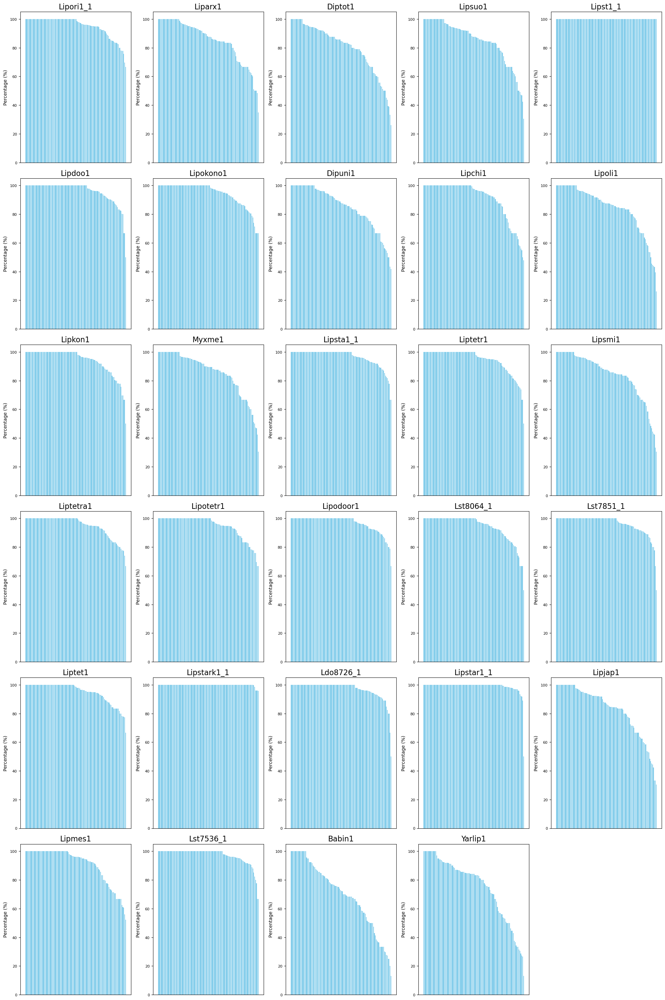

In [88]:
# Set up a 6x5 grid of subplots to accommodate 29 plots.
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 30))

# Flatten the axes for easier iteration.
flat_axes = axes.flatten()

axes_idx = 0  # Counter for the axes index.
for idx, (code, pathway_percentage) in enumerate(code_to_percentage.items()):
    
    if code != 'aah':
        # Sorting pathways for better visualization.
        sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)
        labels, values = zip(*sorted_items)


        flat_axes[axes_idx].bar(labels, values, color='skyblue')
        flat_axes[axes_idx].set_ylabel("Percentage (%)")
        flat_axes[axes_idx].set_title(f"{modified_phrases[code]}", fontsize=16)

        if code == 'aau':
            flat_axes[axes_idx].set_title(f"Ldo8726_1", fontsize=16)

        # Remove x-labels and ticks.
        flat_axes[axes_idx].set_xticks([])
        flat_axes[axes_idx].set_xticklabels([])
        flat_axes[axes_idx].tick_params(axis='y', labelsize=8)
        
        axes_idx += 1  # Increment the axes counter only if plotted

# turn off the last unused one.
flat_axes[-1].axis('off')

plt.tight_layout()
plt.savefig('visualizingPercent_all_pathways.png')
plt.show()


In [ ]:
# examine only certain pathways. 

# Set up a 6x5 grid of subplots to accommodate 29 plots
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 20))  

# Flatten the axes for easier iteration.
flat_axes = axes.flatten()


# Specify the highlight conditions.
highlight_values = ['Citrate cycle (TCA cycle)', 
                    'Glycolysis / Gluconeogenesis',
                    'Glyoxylate and dicarboxylate metabolism',
                    'Oxidative phosphorylation',
                    'Pentose and glucuronate interconversions',
                    'Pentose phosphate pathway',
                    'Pyruvate metabolism']

amino_acid_metabolism = ['Alanine and aspartate metabolism',
                         'Arginine and proline metabolism',
                         'Cysteine metabolism',
                         'D-Arginine and D-ornithine metabolism',
                         'Glycine, serine and threonine metabolism',
                         'Histidine metabolism',
                         'Lysine biosynthesis',
#                          'Lysine degradation',
                         'Methionine metabolism',
                         'Phenylalanine metabolism',
                         'Phenylalanine, tyrosine and tryptophan biosynthesis']

other_metabolism = ['Nitrogen metabolism',
                    'Purine metabolism',
                    'Pyrimidine metabolism']

# Define colors based on the category.
def get_color(pathway):
    if pathway in highlight_values:
        return 'skyblue'
    elif pathway in amino_acid_metabolism:
        return 'green'
    else:
        return 'red'
    
axes_idx = 0  # Counter for the axes index

# Loop through the items in code_to_percentage.
for idx, (code, pathway_percentage) in enumerate(code_to_percentage.items()):

    # ignore duplicated label. 
    if code != 'aah':
        # Filtering pathways based on highlight_values
        filtered_items = {pathway: pct for pathway, pct in pathway_percentage.items() 
                          if pathway in highlight_values or pathway in amino_acid_metabolism or pathway in other_metabolism}

        sorted_items = sorted(filtered_items.items(), key=lambda x: x[1], reverse=True)

        # Sorting the filtered items.    
        labels, values = zip(*sorted_items)

        colors = [get_color(pathway) for pathway in labels]

        flat_axes[axes_idx].bar(labels, values, color=colors)
        flat_axes[axes_idx].set_ylabel("Percentage (%)")
        flat_axes[axes_idx].set_title(f"{modified_phrases[code]}", fontsize=16)

        if code == 'aau':
            flat_axes[axes_idx].set_title(f"Ldo8726_1", fontsize=16)

    #     flat_axes[idx].tick_params(axis='x', rotation=90, labelsize=20)
    #     flat_axes[idx].tick_params(axis='y', labelsize=15)

        # Remove x-labels and ticks
        flat_axes[axes_idx].set_xticks([])
        flat_axes[axes_idx].set_xticklabels([])
        flat_axes[axes_idx].tick_params(axis='y', labelsize=8)

        axes_idx += 1  # Counter for the axes index
flat_axes[-1].axis('off')


plt.tight_layout()
plt.savefig('visualizingPercents_noAnnotation_axis.png')
plt.show()

visualize without annotation. 

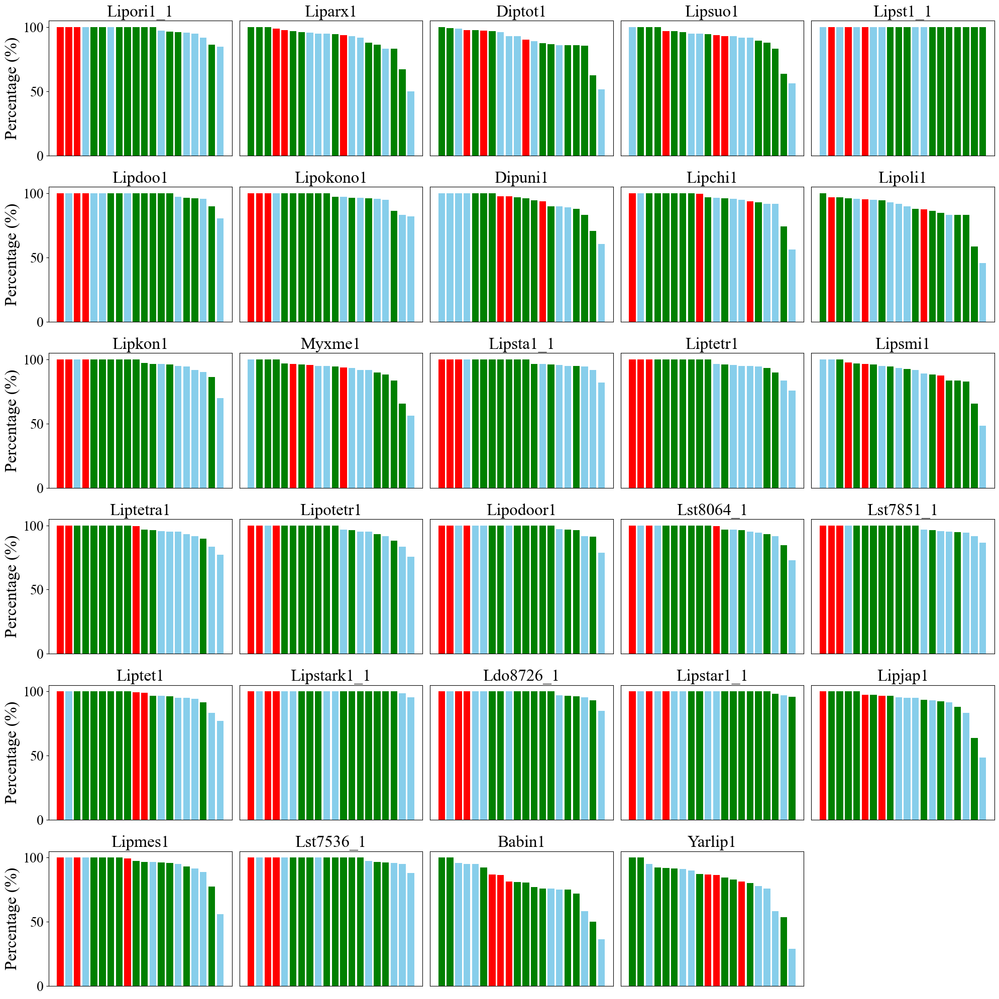

In [336]:


# Set up a 6x5 grid of subplots to accommodate 29 plots
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 20))  # Adjust the figsize as needed

# Flatten the axes for easier iteration
flat_axes = axes.flatten()

# Set the font family for all subplots to Times New Roman
plt.rcParams["font.family"] = "Times New Roman"

# Specify the highlight conditions
highlight_values = ['Citrate cycle (TCA cycle)', 
                    'Glycolysis / Gluconeogenesis',
                    'Glyoxylate and dicarboxylate metabolism',
                    'Oxidative phosphorylation',
                    'Pentose and glucuronate interconversions',
                    'Pentose phosphate pathway',
                    'Pyruvate metabolism']

amino_acid_metabolism = ['Alanine and aspartate metabolism',
                         'Arginine and proline metabolism',
                         'Cysteine metabolism',
                         'D-Arginine and D-ornithine metabolism',
                         'Glycine, serine and threonine metabolism',
                         'Histidine metabolism',
                         'Lysine biosynthesis',
                         'Methionine metabolism',
                         'Phenylalanine metabolism',
                         'Phenylalanine, tyrosine and tryptophan biosynthesis']

other_metabolism = ['Nitrogen metabolism',
                    'Purine metabolism',
                    'Pyrimidine metabolism']

# Define colors based on the category
def get_color(pathway):
    if pathway in highlight_values:
        return 'skyblue'
    elif pathway in amino_acid_metabolism:
        return 'green'
    else:
        return 'red'
    
axes_idx = 0  # Counter for the axes index

# Loop through the items in code_to_percentage
for idx, (code, pathway_percentage) in enumerate(code_to_percentage.items()):
    #
    if code != 'aah':
        # Filtering pathways based on highlight_values
        filtered_items = {pathway: pct for pathway, pct in pathway_percentage.items() 
                          if pathway in highlight_values or pathway in amino_acid_metabolism or pathway in other_metabolism}

        sorted_items = sorted(filtered_items.items(), key=lambda x: x[1], reverse=True)

        # Sorting the filtered items    
        labels, values = zip(*sorted_items)

        colors = [get_color(pathway) for pathway in labels]

        flat_axes[axes_idx].bar(labels, values, color=colors)
        flat_axes[axes_idx].set_title(f"{modified_phrases[code]}", fontsize=24)

        if code == 'aau':
            flat_axes[axes_idx].set_title(f"Ldo8726_1", fontsize=24)

        # Remove y-axis for all subplots except the first column (leftmost) of subplots
        if axes_idx % 5 != 0:
            flat_axes[axes_idx].set_yticks([])
            flat_axes[axes_idx].set_yticklabels([])
        else:
            # Include a ylabel and y-ticks on the leftmost subplots
            flat_axes[axes_idx].set_ylabel("Percentage (%)", fontsize=24)
        
        # Remove x-labels and ticks for all subplots
        flat_axes[axes_idx].set_xticks([])
        flat_axes[axes_idx].set_xticklabels([])
        
        flat_axes[axes_idx].tick_params(axis='y', labelsize=20)

        axes_idx += 1  # Counter for the axes index

# Remove the axis for the 30th subplot which is empty
flat_axes[-1].axis('off')

plt.tight_layout()
plt.savefig('visualizingPercents_noAnnotation_axis.png')
plt.show()



output files to excel. 

In [347]:


# Define a function to get the appropriate color based on the pathway.
def get_excel_fill_color(pathway):
    if pathway in highlight_values:
        return "FFFF00"  # Yellow
    elif pathway in amino_acid_metabolism:
        return "87CEFA"  # Blue
    elif pathway == "Other metabolism":
        return "00FF00"  # Green

# Create a DataFrame from sorted items.
dfs = []

for idx, (code, pathway_percentage) in enumerate(code_to_percentage.items()):

    # Filter and sort the pathways.
    filtered_items = {pathway: pct for pathway, pct in pathway_percentage.items() 
                      if pathway in highlight_values or pathway in amino_acid_metabolism or pathway in other_metabolism}
#     sorted_items = sorted(filtered_items.items(), key=lambda x: x[1], reverse=True)
    sorted_items = sorted(filtered_items.items(), key=lambda x: x[0], reverse=True)
    
    df = pd.DataFrame(sorted_items, columns=[f"{modified_phrases[code]}_Pathway", f"{modified_phrases[code]}_Percentage"])
    dfs.append(df)

# Concatenate dataframes side by side.
final_df = pd.concat(dfs, axis=1)

# Save the DataFrame to an Excel file.
excel_path = 'sorted_items_fill.xlsx'
final_df.to_excel(excel_path, index=False, engine='openpyxl')


# Load the workbook and select the default sheet.
book = load_workbook(excel_path)
sheet = book.active

# Iterate through the rows and apply the color.
for col_num in range(1, sheet.max_column + 1, 2):
    for cell in next(sheet.iter_cols(min_row=2, min_col=col_num, max_col=col_num, max_row=sheet.max_row)):
        fill_color = get_excel_fill_color(cell.value)
        if fill_color:
            cell.fill = PatternFill(start_color=fill_color, end_color=fill_color, fill_type='solid')

# Save the changes.
book.save(excel_path)


save the pathway count for NRRL Y-11557. 

In [102]:

# Define the filename.
filename = "Lipst1_1_pathway_count.csv"

# Write the dictionary to the CSV file
with open(filename, 'w') as csvfile:
    writer = csv.writer(csvfile)
    
    # Write the header
    writer.writerow(["Pathway", "Count"])
    
    # Write the data
    for pathway, count in aaz_pathway_count.items():
        writer.writerow([pathway, count])

print(f"{filename} has been saved.")

NameError: name 'aaz_pathway_count' is not defined

In [103]:
# Convert the dictionary to a DataFrame.
df = pd.DataFrame(code_to_percentage).T

In [104]:
code_to_percentage

{'aaw': {'Pentose and glucuronate interconversions': 84.84848484848484,
  'Galactose metabolism': 84.31372549019608,
  'Starch and sucrose metabolism': 96.03174603174604,
  'Purine metabolism': 100.0,
  'gamma-Hexachlorocyclohexane degradation': 85.18518518518519,
  'Riboflavin metabolism': 88.88888888888889,
  'Aminosugars metabolism': 100.0,
  'Glyoxylate and dicarboxylate metabolism': 91.66666666666666,
  'Nitrogen metabolism': 100.0,
  'Tryptophan metabolism': 98.50746268656717,
  'Cyanoamino acid metabolism': 100.0,
  'Flavonoids, stilbene and lignin biosynthesis': 88.23529411764706,
  'Fatty acid metabolism': 95.83333333333334,
  'Oxidative phosphorylation': 95.65217391304348,
  '\\N': 95.32163742690058,
  '  RNA polymerase': 100.0,
  'Pyrimidine metabolism': 100.0,
  'Folate biosynthesis': 100.0,
  'Glutamate metabolism': 96.42857142857143,
  'Reductive carboxylate cycle (CO2 fixation)': 100.0,
  'Citrate cycle (TCA cycle)': 100.0,
  'Phospholipid degradation': 92.3076923076923,

In [105]:
# Map the index to the modified_phrases
df.index = df.index.map(modified_phrases)

In [45]:
df.to_excel('percentages_in_Lipst1_1_groups.xlsx')


In [24]:
df

,Pentose and glucuronate interconversions,Galactose metabolism,Starch and sucrose metabolism,Purine metabolism,gamma-Hexachlorocyclohexane degradation,Riboflavin metabolism,Aminosugars metabolism,Glyoxylate and dicarboxylate metabolism,Nitrogen metabolism,Tryptophan metabolism,...,Ethylbenzene degradation,"Valine, leucine and isoleucine biosynthesis",Biotin metabolism,Protein export,Thiamine metabolism,Glycosylphosphatidylinositol(GPI)-anchor biosynthesis,Photosynthesis,"1,1,1-Trichloro-2,2-bis(4-chlorophenyl)ethane (DDT) degradation",Nitorobenzene degradation,Toluene and xylene degradation
17622865-Ldo8726_1,84.848485,94.117647,96.825397,100.000000,88.888889,94.444444,100.000000,100.000000,100.00,100.000000,...,100.000000,100.000000,100.0,100.0,100.000000,100.0,100.0,100.0,50.0,NaN
Lipstark1_1,98.484848,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00,100.000000,...,100.000000,100.000000,100.0,100.0,100.000000,100.0,100.0,100.0,100.0,100.0
Lst7536_1,87.878788,96.078431,96.825397,100.000000,85.185185,88.888889,100.000000,100.000000,100.00,97.014925,...,92.307692,100.000000,100.0,100.0,100.000000,100.0,100.0,100.0,100.0,100.0
Lipmes1,56.060606,72.549020,92.063492,99.408284,77.777778,88.888889,100.000000,91.666667,100.00,95.522388,...,92.307692,100.000000,100.0,100.0,100.000000,100.0,100.0,NaN,NaN,NaN
Liparx1,50.000000,50.980392,87.301587,98.816568,74.074074,83.333333,90.000000,83.333333,93.75,89.552239,...,76.923077,92.307692,70.0,100.0,100.000000,100.0,100.0,NaN,NaN,NaN
Lipotetr1,75.757576,78.431373,94.444444,100.000000,77.777778,83.333333,100.000000,83.333333,100.00,98.507463,...,100.000000,100.000000,100.0,100.0,100.000000,100.0,100.0,100.0,NaN,NaN
Lipodoor1,78.787879,92.156863,96.825397,100.000000,88.888889,94.444444,100.000000,91.666667,100.00,100.000000,...,92.307692,100.000000,100.0,100.0,100.000000,100.0,100.0,100.0,NaN,NaN
Lipokono1,81.818182,86.274510,96.031746,100.000000,96.296296,100.000000,100.000000,83.333333,100.00,98.507463,...,92.307692,100.000000,100.0,100.0,100.000000,100.0,100.0,100.0,100.0,100.0
Lipsmi1,48.484848,43.137255,85.714286,97.633136,74.074074,88.888889,83.333333,91.666667,87.50,85.074627,...,76.923077,92.307692,80.0,100.0,100.000000,100.0,100.0,NaN,50.0,100.0
Lipori1_1,84.848485,84.313725,96.031746,100.000000,85.185185,88.888889,100.000000,91.666667,100.00,98.507463,...,92.307692,100.000000,100.0,100.0,100.000000,100.0,100.0,100.0,NaN,NaN


## Task 2b. 
### Repeat the process, using consensus annotations for each proteinID

In [106]:
# this cell reads in the annotations for each species and protein ID. 
# this cell only grabs the KEGG pathway annotation field from a KEGG annotated file. 


# Directory with .gz files.
directory = 'kegg/'

# Dictionary to hold each code's protein IDs and their corresponding pathways.
code_pathways_dict = {}


errors = []
codes = []

# Load the data from each .gz file in the folder.
for filename in os.listdir(directory):
    if (filename.endswith('.gz')) and ('_eggnogec' not in filename):
        
        # Parse the code from the filename.
        code = re.split('_Gene|_Filtered',filename)[0]
        
        codes.append(code)
        
        # Dictionary to hold specific protein IDs and their corresponding pathways for the current file.
        protein_pathways = {}
        
        
        with gzip.open(os.path.join(directory, filename), 'rt') as file:
            data = pd.read_csv(file, sep='\t')

            for _, row in data.iterrows():
                
                try:
                    protein_id = row['proteinId']
                except:
                    protein_id = row['#proteinId']

                pathway = row['pathway']


                if protein_id not in protein_pathways:
                    protein_pathways[protein_id] = []
                protein_pathways[protein_id].append(pathway)

            code_pathways_dict[code] = protein_pathways



In [107]:
# this cell determines all the pathways that are possible annotations for a group based off a JGI 
# annotation file for the species. 

# Using defaultdict to easily append pathways to a list.
all_group_pathways = defaultdict(list)

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict.
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            # the JGI Kegg annotation file and the protein fasta files do not contain all of the same proteins.
            if protein_id in code_pathways_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id.
                all_group_pathways[group].extend(code_pathways_dict[species][protein_id])

# To remove any possible duplicates in the pathways list, convert to set and then back to list.
for group in all_group_pathways:
    all_group_pathways[group] = list(set(all_group_pathways[group]))

# # Print out the combined pathways for each group.
for group, pathways in all_group_pathways.items():
    if pathways:  # Only print if there are pathways
        print(f"{group}: {' | '.join([p for p in pathways if isinstance(p, str)])}")


OG0001:: Pentose and glucuronate interconversions
OG0002:: \N
OG0003:: \N | Purine metabolism
OG0005:: Alanine and aspartate metabolism | Purine metabolism
OG0006:: Starch and sucrose metabolism | Galactose metabolism
OG0008:: \N
OG0010:: Purine metabolism | Sulfur metabolism | Selenoamino acid metabolism
OG0011:: 
OG0012:: Pentose and glucuronate interconversions
OG0013:: Porphyrin and chlorophyll metabolism
OG0014:: gamma-Hexachlorocyclohexane degradation | Riboflavin metabolism
OG0018:: Aminosugars metabolism
OG0021:: Pentose and glucuronate interconversions
OG0022:: Pentose and glucuronate interconversions
OG0025:: Nitrogen metabolism | Tryptophan metabolism | Glyoxylate and dicarboxylate metabolism
OG0029:: Starch and sucrose metabolism | Cyanoamino acid metabolism | Flavonoids, stilbene and lignin biosynthesis
OG0030:: \N | Starch and sucrose metabolism
OG0031:: gamma-Hexachlorocyclohexane degradation | Tryptophan metabolism | Fatty acid metabolism
OG0033:: Starch and sucrose met

In [108]:
# this cell quantifies how many times a pathway comes up as annotated for a specific function. 

t = defaultdict(list)

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species.
            # the JGI Kegg annotation file and the protein fasta files do not contain all of the same proteins.
            if protein_id in code_pathways_dict[species]:
                
                pathways_for_protein = set(code_pathways_dict[species][protein_id])
                
                # Determine the pathways that are not in t[group].
                new_pathways = pathways_for_protein - set(t[group])
                
                if new_pathways and t[group]:  # Check if t[group] is not empty
                    print(f"New pathways for group {group}:", new_pathways, species, t[group])
                    
                
                # Extending the list to include only the new pathways
                t[group].extend(new_pathways)
#             else:
#                 if 'Myxme1' in species:
#                     print(f'{protein_id} {species}')

New pathways for group OG0002:: {'\\N'} Liptetr1 [nan]
New pathways for group OG0003:: {'\\N'} Lipdoo1 ['Purine metabolism']
New pathways for group OG0006:: {'Galactose metabolism'} Lst7851_1 ['Starch and sucrose metabolism']
New pathways for group OG0010:: {'Sulfur metabolism', 'Selenoamino acid metabolism'} Diptot1 [nan]
New pathways for group OG0010:: {'Purine metabolism'} Babin1 [nan, 'Sulfur metabolism', 'Selenoamino acid metabolism']
New pathways for group OG0030:: {'\\N'} Liptetr1 [nan]
New pathways for group OG0030:: {'Starch and sucrose metabolism'} Babin1 [nan, '\\N']
New pathways for group OG0033:: {'Galactose metabolism'} Liptetr1 ['Starch and sucrose metabolism', 'Fructose and mannose metabolism']
New pathways for group OG0033:: {nan} Diptot1 ['Starch and sucrose metabolism', 'Fructose and mannose metabolism', 'Galactose metabolism']
New pathways for group OG0034:: {'\\N'} Liptetr1 [nan]
New pathways for group OG0039:: {'Tryptophan metabolism', 'Fatty acid metabolism'} Lip

In [28]:
# this cell is a slight modification on the one above, in that it returns percents instead of counts. 
t = defaultdict(lambda: defaultdict(int))  # Initialize as dictionary of dictionaries

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            if protein_id in code_pathways_dict[species]:
                
                # Increment the count of each pathway for this group
                for pathway in code_pathways_dict[species][protein_id]:
                    t[group][pathway] += 1
                    
# Convert counts to percentages
for group in t:
    total = sum(t[group].values())
    for pathway in t[group]:
        t[group][pathway] = (t[group][pathway] / total) * 100

# Print out the percentage of pathways for each group
for group, pathway_percentages in t.items():
    print(f"Group: {group}")
    for pathway, percent in pathway_percentages.items():
        print(f"\t{pathway}: {percent:.2f}%")

# # Print out the count of pathways for each group
# for group, pathway_counts in t.items():
#     print(f"Group: {group}")
#     for pathway, count in pathway_counts.items():
#         print(f"\t{pathway}: {count}")


Group: OG0001:
	Pentose and glucuronate interconversions: 100.00%
Group: OG0002:
	nan: 47.56%
	\N: 52.44%
Group: OG0003:
	Purine metabolism: 99.17%
	\N: 0.83%
Group: OG0005:
	Purine metabolism: 50.00%
	Alanine and aspartate metabolism: 50.00%
Group: OG0006:
	Starch and sucrose metabolism: 63.98%
	Galactose metabolism: 36.02%
Group: OG0008:
	\N: 100.00%
Group: OG0010:
	nan: 87.67%
	Selenoamino acid metabolism: 1.37%
	Sulfur metabolism: 1.37%
	Purine metabolism: 9.59%
Group: OG0011:
	nan: 100.00%
Group: OG0012:
	Pentose and glucuronate interconversions: 100.00%
Group: OG0013:
	Porphyrin and chlorophyll metabolism: 100.00%
Group: OG0014:
	gamma-Hexachlorocyclohexane degradation: 50.00%
	Riboflavin metabolism: 50.00%
Group: OG0018:
	Aminosugars metabolism: 100.00%
Group: OG0021:
	Pentose and glucuronate interconversions: 100.00%
Group: OG0022:
	Pentose and glucuronate interconversions: 100.00%
Group: OG0025:
	Glyoxylate and dicarboxylate metabolism: 33.33%
	Nitrogen metabolism: 33.33%
	Try

Group: OG5435:
	Phenylalanine metabolism: 63.64%
	Benzoate degradation via CoA ligation: 3.03%
	Tyrosine metabolism: 3.03%
	Aminosugars metabolism: 3.03%
	Glycerolipid metabolism: 3.03%
	Valine, leucine and isoleucine degradation: 3.03%
	Ethylbenzene degradation: 3.03%
	Lipopolysaccharide biosynthesis: 3.03%
	Lysine biosynthesis: 3.03%
	Butanoate metabolism: 3.03%
	D-Arginine and D-ornithine metabolism: 3.03%
	Histidine metabolism: 3.03%
	Lysine degradation: 3.03%
Group: OG5436:
	Caprolactam degradation: 25.00%
	Glycerolipid metabolism: 25.00%
	Pentose and glucuronate interconversions: 25.00%
	Glycolysis / Gluconeogenesis: 25.00%
Group: OG5437:
	nan: 100.00%
Group: OG5447:
	Pentose and glucuronate interconversions: 100.00%
Group: OG5451:
	Tryptophan metabolism: 50.00%
	Ubiquinone biosynthesis: 50.00%
Group: OG5454:
	Galactose metabolism: 50.00%
	Starch and sucrose metabolism: 50.00%
Group: OG5456:
	Starch and sucrose metabolism: 50.00%
	\N: 45.45%
	Galactose metabolism: 4.55%
Group: OG

In [44]:
# output the data. 
# Writing to CSV.
with open('group_pathways_combined.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Group', 'Pathways'])  # header
    
    for group, pathways in all_group_pathways.items():
        if pathways:  # Only consider groups with pathways
            pathway_string = ' | '.join([p for p in pathways if isinstance(p, str)])
            writer.writerow([group, pathway_string])

In [43]:
# Create a list of data to store each row of the CSV
csv_data = []

# Loop through the defaultdict to reshape data
for group, pathway_percentages in t.items():
    # Start each row with the group name
    row_data = [group]
    for pathway, percentage in pathway_percentages.items():
        # Add each pathway and its percentage to the row data
        row_data.append(f"{pathway}: {percentage:.2f}%")
    csv_data.append(row_data)

# Determine the maximum number of columns needed
max_columns = max(len(row) for row in csv_data)

# Create column names based on the maximum number of columns
column_names = ["Group"] + [f"Pathway_{i}" for i in range(1, max_columns)]

# Convert the list of data to a pandas DataFrame
df = pd.DataFrame(csv_data, columns=column_names)

# Save the DataFrame to a CSV
df.to_csv('group_pathway_percentages.csv', index=False)


#### modified code to read multiple annotations at once. 

In [116]:
# Directory with .gz files.
directory = 'kegg/'

# Dictionary to hold each code's protein IDs and their corresponding pathways.
code_pathways_dict = {}
code_ecNum_dict = {}
code_def_dict = {}

errors = []
codes = []

# Load the data from each .gz file in the folder.
for filename in os.listdir(directory):
    if (filename.endswith('.gz')) and ('_eggnogec' not in filename):
        
        # Parse the code from the filename.
        code = re.split('_Gene|_Filtered',filename)[0]
        
        codes.append(code)
        
        # Dictionary to hold specific protein IDs and their corresponding pathways for the current file.
        protein_pathways = {}
        protein_ecNum = {}
        protein_definition = {}
        
        
        with gzip.open(os.path.join(directory, filename), 'rt') as file:
            data = pd.read_csv(file, sep='\t')

            for _, row in data.iterrows():
                
                try:
                    protein_id = row['proteinId']
                except:
                    protein_id = row['#proteinId']

                pathway = row['pathway']
                ecNum = row['ecNum']
                definition = row['definition']


                if protein_id not in protein_pathways:
                    protein_pathways[protein_id] = []
                if protein_id not in protein_ecNum:
                    protein_ecNum[protein_id] = []
                if protein_id not in protein_definition:
                    protein_definition[protein_id] = []
                    
                protein_pathways[protein_id].append(pathway)
                protein_ecNum[protein_id].append(ecNum)
                protein_definition[protein_id].append(definition)



            code_pathways_dict[code] = protein_pathways
            code_ecNum_dict[code] = protein_ecNum
            code_def_dict[code] = protein_definition



In [111]:
# this cell determines all the pathways that are possible annotations for a group based off a JGI 
# annotation file for the species. 

# Using defaultdict to easily append pathways to a list
all_group_pathways = defaultdict(list)
all_group_ecNum = defaultdict(list)
all_group_def = defaultdict(list)


for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict.
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            # the JGI Kegg annotation file and the protein fasta files do not contain all of the same proteins.
            if protein_id in code_pathways_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id.
                all_group_pathways[group].extend(code_pathways_dict[species][protein_id])
                
            if protein_id in code_ecNum_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id.
                all_group_ecNum[group].extend(code_ecNum_dict[species][protein_id])
                
            if protein_id in code_def_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id.
                all_group_def[group].extend(code_def_dict[species][protein_id])

# To remove any possible duplicates in the pathways list, convert to set and then back to list.
for group in all_group_pathways:
    all_group_pathways[group] = list(set(all_group_pathways[group]))
    
for group in all_group_ecNum:
    all_group_ecNum[group] = list(set(all_group_ecNum[group]))

for group in all_group_def:
    all_group_def[group] = list(set(all_group_def[group]))



# # Print out the combined pathways for each group
for group, pathways in all_group_ecNum.items():
    if pathways:  # Only print if there are pathways
        print(f"{group}: {' | '.join([p for p in pathways if isinstance(p, str)])}")


OG0001:: 5.3.1.4
OG0002:: 3.6.3.44
OG0003:: 3.6.1.3 | 3.6.3.44
OG0005:: 6.3.4.4
OG0006:: 3.2.1.10 | 3.2.1.20 | 3.2.1.93
OG0008:: 3.6.3.29 | 3.6.3.27 | 3.6.3.44
OG0010:: 3.6.1.3 | 1.8.1.2 | 3.6.4.13
OG0011:: 1.14.13.63 | 1.14.14.54
OG0012:: 5.3.1.4
OG0013:: 4.2.1.24
OG0014:: 3.1.3.2
OG0018:: 2.4.1.16
OG0021:: 5.3.1.4
OG0022:: 5.3.1.4
OG0025:: 3.5.1.49
OG0029:: 3.2.1.21
OG0030:: 3.2.1.6 | 3.2.1.3
OG0031:: 1.14.14.1
OG0033:: 3.2.1.7 | 3.2.1.80 | 3.2.1.65 | 3.2.1.26
OG0034:: 3.2.1.101
OG0035:: 3.6.3.44
OG0036:: 5.3.1.4
OG0037:: 3.6.3.6
OG0039:: 1.14.14.1 | 1.14.-.-
OG0040:: 3.6.3.8 | 3.6.1.3 | 3.6.3.1
OG0042:: 1.6.5.5
OG0044:: 5.3.1.4
OG0046:: 6.2.1.3
OG0048:: 3.4.11.-
OG0049:: 3.6.1.3
OG0051:: 3.6.3.8 | 3.6.3.7
OG0053:: 2.4.1.82
OG0054:: 3.6.5.5
OG0056:: 3.6.1.- | 3.6.1.3 | 3.6.4.- | 3.6.4.13
OG0059:: 2.7.7.6
OG0060:: 3.6.1.3 | 3.6.4.13
OG0061:: 3.6.1.- | 3.6.4.13
OG0063:: 6.3.5.5 | 2.1.3.2
OG0065:: 2.7.7.6
OG0066:: 4.2.1.- | 4.2.1.3
OG0068:: 2.4.1.16 | 2.4.1.212
OG0071:: 1.14.11.17 | 1.1

In [118]:
# this cell quantifies how many times a pathway comes up as annotated for a specific function. 

t = defaultdict(list)

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict.
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species.
            # the JGI Kegg annotation file and the protein fasta files do not contain all of the same proteins.
            if protein_id in code_pathways_dict[species]:
                
                pathways_for_protein = set(code_pathways_dict[species][protein_id])
                
                # Determine the pathways that are not in t[group].
                new_pathways = pathways_for_protein - set(t[group])
                
                if new_pathways and t[group]:  # Check if t[group] is not empty
                    print(f"New pathways for group {group}:", new_pathways, species, t[group])
                    
                
                # Extending the list to include only the new pathways
                t[group].extend(new_pathways)
#             else:
#                 if 'Myxme1' in species:
#                     print(f'{protein_id} {species}')

New pathways for group OG0002:: {'\\N'} Liptetr1 [nan]
New pathways for group OG0003:: {'\\N'} Lipdoo1 ['Purine metabolism']
New pathways for group OG0006:: {'Galactose metabolism'} Lst7851_1 ['Starch and sucrose metabolism']
New pathways for group OG0010:: {'Sulfur metabolism', 'Selenoamino acid metabolism'} Diptot1 [nan]
New pathways for group OG0010:: {'Purine metabolism'} Babin1 [nan, 'Sulfur metabolism', 'Selenoamino acid metabolism']
New pathways for group OG0030:: {'\\N'} Liptetr1 [nan]
New pathways for group OG0030:: {'Starch and sucrose metabolism'} Babin1 [nan, '\\N']
New pathways for group OG0033:: {'Galactose metabolism'} Liptetr1 ['Starch and sucrose metabolism', 'Fructose and mannose metabolism']
New pathways for group OG0033:: {nan} Diptot1 ['Starch and sucrose metabolism', 'Fructose and mannose metabolism', 'Galactose metabolism']
New pathways for group OG0034:: {'\\N'} Liptetr1 [nan]
New pathways for group OG0039:: {'Tryptophan metabolism', 'Fatty acid metabolism'} Lip

In [119]:
# Writing to CSV. 
# uses the pathway data created above. 
with open('group_pathway__combined.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Group', 'Pathways'])  # header
    
    for group, pathways in all_group_def.items():
        if pathways:  # Only consider groups with pathways
            pathway_string = ' | '.join([p for p in pathways if isinstance(p, str)])
            writer.writerow([group, pathway_string])

In [40]:
# this cell is a slight modification on the one above, in that it returns percents instead of counts. 
# this cell only creates the pathway outputs. 

t = defaultdict(lambda: defaultdict(int))  # Initialize as dictionary of dictionaries

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            if protein_id in code_pathways_dict[species]:
                
                # Increment the count of each pathway for this group
                for pathway in code_pathways_dict[species][protein_id]:
                    t[group][pathway] += 1
                    
# Convert counts to percentages
for group in t:
    total = sum(t[group].values())
    for pathway in t[group]:
        t[group][pathway] = (t[group][pathway] / total) * 100

# Print out the percentage of pathways for each group
for group, pathway_percentages in t.items():
    print(f"Group: {group}")
    for pathway, percent in pathway_percentages.items():
        print(f"\t{pathway}: {percent:.2f}%")

# # Print out the count of pathways for each group
# for group, pathway_counts in t.items():
#     print(f"Group: {group}")
#     for pathway, count in pathway_counts.items():
#         print(f"\t{pathway}: {count}")


Group: OG0001:
	Pentose and glucuronate interconversions: 100.00%
Group: OG0002:
	nan: 47.56%
	\N: 52.44%
Group: OG0003:
	Purine metabolism: 99.17%
	\N: 0.83%
Group: OG0005:
	Purine metabolism: 50.00%
	Alanine and aspartate metabolism: 50.00%
Group: OG0006:
	Starch and sucrose metabolism: 63.98%
	Galactose metabolism: 36.02%
Group: OG0008:
	\N: 100.00%
Group: OG0010:
	nan: 87.67%
	Selenoamino acid metabolism: 1.37%
	Sulfur metabolism: 1.37%
	Purine metabolism: 9.59%
Group: OG0011:
	nan: 100.00%
Group: OG0012:
	Pentose and glucuronate interconversions: 100.00%
Group: OG0013:
	Porphyrin and chlorophyll metabolism: 100.00%
Group: OG0014:
	gamma-Hexachlorocyclohexane degradation: 50.00%
	Riboflavin metabolism: 50.00%
Group: OG0018:
	Aminosugars metabolism: 100.00%
Group: OG0021:
	Pentose and glucuronate interconversions: 100.00%
Group: OG0022:
	Pentose and glucuronate interconversions: 100.00%
Group: OG0025:
	Glyoxylate and dicarboxylate metabolism: 33.33%
	Nitrogen metabolism: 33.33%
	Try

In [114]:

# Create a list of data to store each row of the CSV.
# this one saves the pathway perecents. 

csv_data = []

# Loop through the defaultdict to reshape data
for group, pathway_percentages in t.items():
    # Start each row with the group name
    row_data = [group]
    for pathway, percentage in pathway_percentages.items():
        # Add each pathway and its percentage to the row data
        row_data.append(f"{pathway}: {percentage:.2f}%")
    csv_data.append(row_data)

# Determine the maximum number of columns needed
max_columns = max(len(row) for row in csv_data)

# Create column names based on the maximum number of columns
column_names = ["Group"] + [f"Pathway_{i}" for i in range(1, max_columns)]

# Convert the list of data to a pandas DataFrame
df = pd.DataFrame(csv_data, columns=column_names)

# Save the DataFrame to a CSV
df.to_csv('group_pathway_perentages.csv', index=False)


In [115]:
df

,Group,Pathway_1,Pathway_2,Pathway_3,Pathway_4,Pathway_5,Pathway_6
0,OG0001:,L-arabinose isomerase.: 100.00%,None,None,None,None,None
1,OG0002:,Xenobiotic-transporting ATPase.: 100.00%,None,None,None,None,None
2,OG0003:,Adenosinetriphosphatase.: 99.17%,Xenobiotic-transporting ATPase.: 0.83%,None,None,None,None
3,OG0005:,Adenylosuccinate synthase.: 100.00%,None,None,None,None,None
4,OG0006:,"Oligosaccharide alpha-1,6-glucosidase.: 24.22%",Alpha-glucosidase.: 72.05%,"Alpha,alpha-phosphotrehalase.: 3.73%",None,None,None
...,...,...,...,...,...,...,...
3261,OG11522:,Adenosylmethionine--8-amino-7-oxononanoate ami...,None,None,None,None,None
3262,OG11559:,Cerevisin.: 100.00%,None,None,None,None,None
3263,OG11560:,Lysophospholipase.: 100.00%,None,None,None,None,None
3264,OG11595:,Kievitone hydratase.: 100.00%,None,None,None,None,None


In [113]:
# this cell is a slight modification on the one above, in that it returns percents instead of counts.
# 

t = defaultdict(lambda: defaultdict(int))  # Initialize as dictionary of dictionaries

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            if protein_id in code_def_dict[species]:
                
                # Increment the count of each pathway for this group
                for pathway in code_def_dict[species][protein_id]:
                    t[group][pathway] += 1
                    
# Convert counts to percentages
for group in t:
    total = sum(t[group].values())
    for pathway in t[group]:
        t[group][pathway] = (t[group][pathway] / total) * 100

# Print out the percentage of pathways for each group
for group, pathway_percentages in t.items():
    print(f"Group: {group}")
    for pathway, percent in pathway_percentages.items():
        print(f"\t{pathway}: {percent:.2f}%")


Group: OG0001:
	L-arabinose isomerase.: 100.00%
Group: OG0002:
	Xenobiotic-transporting ATPase.: 100.00%
Group: OG0003:
	Adenosinetriphosphatase.: 99.17%
	Xenobiotic-transporting ATPase.: 0.83%
Group: OG0005:
	Adenylosuccinate synthase.: 100.00%
Group: OG0006:
	Oligosaccharide alpha-1,6-glucosidase.: 24.22%
	Alpha-glucosidase.: 72.05%
	Alpha,alpha-phosphotrehalase.: 3.73%
Group: OG0008:
	Xenobiotic-transporting ATPase.: 85.00%
	Phosphate-transporting ATPase.: 8.33%
	Molybdate-transporting ATPase.: 6.67%
Group: OG0010:
	nan: 87.67%
	Sulfite reductase (NADPH).: 2.74%
	Adenosinetriphosphatase.: 9.59%
Group: OG0011:
	3-hydroxyphenylacetate 6-hydroxylase.: 50.00%
	nan: 50.00%
Group: OG0012:
	L-arabinose isomerase.: 100.00%
Group: OG0013:
	Porphobilinogen synthase.: 100.00%
Group: OG0014:
	Acid phosphatase.: 100.00%
Group: OG0018:
	Chitin synthase.: 100.00%
Group: OG0021:
	L-arabinose isomerase.: 100.00%
Group: OG0022:
	L-arabinose isomerase.: 100.00%
Group: OG0025:
	Formamidase.: 100.00%
Gr

In [ ]:
# Create a list of data to store each row of the CSV.
# this one saves the code def from KEGG.

csv_data = []

# Loop through the defaultdict to reshape data
for group, pathway_percentages in t.items():
    # Start each row with the group name
    row_data = [group]
    for pathway, percentage in pathway_percentages.items():
        # Add each pathway and its percentage to the row data
        row_data.append(f"{pathway}: {percentage:.2f}%")
    csv_data.append(row_data)

# Determine the maximum number of columns needed
max_columns = max(len(row) for row in csv_data)

# Create column names based on the maximum number of columns
column_names = ["Group"] + [f"Pathway_{i}" for i in range(1, max_columns)]

# Convert the list of data to a pandas DataFrame
df = pd.DataFrame(csv_data, columns=column_names)

# Save the DataFrame to a CSV
df.to_csv('group_def_percentages.csv', index=False)


In [62]:
# this cell is a slight modification on the one above, in that it returns percents instead of counts. 
t = defaultdict(lambda: defaultdict(int))  # Initialize as dictionary of dictionaries

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_ecNum_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            if protein_id in code_ecNum_dict[species]:
                
                # Increment the count of each pathway for this group
                for pathway in code_ecNum_dict[species][protein_id]:
                    t[group][pathway] += 1
                    
# Convert counts to percentages
for group in t:
    total = sum(t[group].values())
    for pathway in t[group]:
        t[group][pathway] = (t[group][pathway] / total) * 100

# Print out the percentage of pathways for each group
for group, pathway_percentages in t.items():
    print(f"Group: {group}")
    for pathway, percent in pathway_percentages.items():
        print(f"\t{pathway}: {percent:.2f}%")


Group: OG0001:
	5.3.1.4: 100.00%
Group: OG0002:
	3.6.3.44: 100.00%
Group: OG0003:
	3.6.1.3: 99.17%
	3.6.3.44: 0.83%
Group: OG0005:
	6.3.4.4: 100.00%
Group: OG0006:
	3.2.1.10: 24.22%
	3.2.1.20: 72.05%
	3.2.1.93: 3.73%
Group: OG0008:
	3.6.3.44: 85.00%
	3.6.3.27: 8.33%
	3.6.3.29: 6.67%
Group: OG0010:
	3.6.4.13: 87.67%
	1.8.1.2: 2.74%
	3.6.1.3: 9.59%
Group: OG0011:
	1.14.13.63: 50.00%
	1.14.14.54: 50.00%
Group: OG0012:
	5.3.1.4: 100.00%
Group: OG0013:
	4.2.1.24: 100.00%
Group: OG0014:
	3.1.3.2: 100.00%
Group: OG0018:
	2.4.1.16: 100.00%
Group: OG0021:
	5.3.1.4: 100.00%
Group: OG0022:
	5.3.1.4: 100.00%
Group: OG0025:
	3.5.1.49: 100.00%
Group: OG0029:
	3.2.1.21: 100.00%
Group: OG0030:
	3.2.1.6: 98.55%
	3.2.1.3: 1.45%
Group: OG0031:
	1.14.14.1: 100.00%
Group: OG0033:
	3.2.1.65: 20.54%
	3.2.1.80: 50.00%
	3.2.1.26: 26.79%
	3.2.1.7: 2.68%
Group: OG0034:
	3.2.1.101: 100.00%
Group: OG0035:
	3.6.3.44: 100.00%
Group: OG0036:
	5.3.1.4: 100.00%
Group: OG0037:
	3.6.3.6: 100.00%
Group: OG0039:
	1.14.-.-:

In [ ]:
# Create a list of data to store each row of the CSV.
# this one saves the code EcNumb

csv_data = []

# Loop through the defaultdict to reshape data
for group, pathway_percentages in t.items():
    # Start each row with the group name
    row_data = [group]
    for pathway, percentage in pathway_percentages.items():
        # Add each pathway and its percentage to the row data
        row_data.append(f"{pathway}: {percentage:.2f}%")
    csv_data.append(row_data)

# Determine the maximum number of columns needed
max_columns = max(len(row) for row in csv_data)

# Create column names based on the maximum number of columns
column_names = ["Group"] + [f"Pathway_{i}" for i in range(1, max_columns)]

# Convert the list of data to a pandas DataFrame
df = pd.DataFrame(csv_data, columns=column_names)

# Save the DataFrame to a CSV
df.to_csv('group_ecNum_percentages.csv', index=False)


In [60]:

# # Writing to CSV
# with open('group_ecNum_combined.csv', 'w', newline='') as file:
#     writer = csv.writer(file)
#     writer.writerow(['Group', 'Pathways'])  # header
    
#     for group, pathways in all_group_ecNum.items():
#         if pathways:  # Only consider groups with pathways
#             pathway_string = ' | '.join([p for p in pathways if isinstance(p, str)])
#             writer.writerow([group, pathway_string])

In [61]:

# # Writing to CSV
# with open('group_definition_combined.csv', 'w', newline='') as file:
#     writer = csv.writer(file)
#     writer.writerow(['Group', 'Pathways'])  # header
    
#     for group, pathways in all_group_def.items():
#         if pathways:  # Only consider groups with pathways
#             pathway_string = ' | '.join([p for p in pathways if isinstance(p, str)])
#             writer.writerow([group, pathway_string])

## Task 2d. 
### Repeat the process, using consensus KOG annotations for each proteinID or reverting 
### description or EC numbers. 

#### the cells below handle multiple annotations simultaneously. 

In [38]:
# Directory with .gz files.
directory = 'KOG/'

# Dictionary to hold each code's protein IDs and their corresponding pathways.
code_pathways_dict = {}
code_ecNum_dict = {}
code_def_dict = {}

errors = []
codes = []

# Load the data from each .gz file in the folder.
for filename in os.listdir(directory):
    if (filename.endswith('.tab')) and ('_eggnogec' not in filename):
        
        # Parse the code from the filename.
        code = re.split('_Gene|_Filtered',filename)[0]
        code = code.replace('_koginfo','')
        
        codes.append(code)
        
        # Dictionary to hold specific protein IDs and their corresponding pathways for the current file.
        protein_pathways = {}
        protein_ecNum = {}
        protein_definition = {}
        
        
        with open(os.path.join(directory, filename), 'rt') as file:
            data = pd.read_csv(file, sep='\t')

            for _, row in data.iterrows():
                
                try:
                    protein_id = row['proteinId']
                except:
                    protein_id = row['#proteinId']

                pathway = row['kogClass']
                ecNum = row['kogid']
                definition = row['kogdefline']


                if protein_id not in protein_pathways:
                    protein_pathways[protein_id] = []
                if protein_id not in protein_ecNum:
                    protein_ecNum[protein_id] = []
                if protein_id not in protein_definition:
                    protein_definition[protein_id] = []
                    
                protein_pathways[protein_id].append(pathway)
                protein_ecNum[protein_id].append(ecNum)
                protein_definition[protein_id].append(definition)



            code_pathways_dict[code] = protein_pathways
            code_ecNum_dict[code] = protein_ecNum
            code_def_dict[code] = protein_definition



In [41]:
# this cell determines all the pathways that are possible annotations for a group based off a JGI 
# annotation file for the species. 

# Using defaultdict to easily append pathways to a list.
all_group_pathways = defaultdict(list)
all_group_ecNum = defaultdict(list)
all_group_def = defaultdict(list)


for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict.
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            # the JGI Kegg annotation file and the protein fasta files do not contain all of the same proteins.
            if protein_id in code_pathways_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id.
                all_group_pathways[group].extend(code_pathways_dict[species][protein_id])
                
            if protein_id in code_ecNum_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id.
                all_group_ecNum[group].extend(code_ecNum_dict[species][protein_id])
                
            if protein_id in code_def_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id.
                all_group_def[group].extend(code_def_dict[species][protein_id])

# To remove any possible duplicates in the pathways list, convert to set and then back to list.
for group in all_group_pathways:
    all_group_pathways[group] = list(set(all_group_pathways[group]))
    
for group in all_group_ecNum:
    all_group_ecNum[group] = list(set(all_group_ecNum[group]))

for group in all_group_def:
    all_group_def[group] = list(set(all_group_def[group]))

# # # Print out the combined pathways for each group
# for group, pathways in all_group_pathways.items():
#     if pathways:  # Only print if there are pathways
#         print(f"{group}: {' | '.join([p for p in pathways if isinstance(p, str)])}")

# # Print out the combined pathways for each group
for group, pathways in all_group_ecNum.items():
    if pathways:  # Only print if there are pathways
        print(f"{group}: {' | '.join([p for p in pathways if isinstance(p, str)])}")


OG0000:: KOG2262
OG0001:: KOG0254
OG0002:: KOG0055
OG0003:: KOG0054
OG0004:: KOG2466
OG0005:: KOG2533
OG0006:: KOG0471
OG0007:: KOG0254
OG0008:: KOG0065
OG0009:: KOG0040
OG0010:: KOG0923 | KOG0925 | KOG0560 | KOG0922 | KOG0924
OG0011:: KOG2533
OG0012:: KOG0254
OG0013:: KOG0100 | KOG0102 | KOG0101
OG0014:: KOG1378
OG0015:: KOG2262
OG0016:: KOG2246 | KOG3386
OG0017:: KOG2533
OG0018:: KOG2571
OG0019:: KOG0039
OG0020:: KOG3803
OG0021:: KOG0254
OG0022:: KOG0254
OG0023:: KOG0039
OG0024:: KOG1286
OG0026:: KOG0255
OG0030:: KOG2254
OG0031:: KOG0157
OG0032:: KOG0255
OG0033:: KOG0228
OG0034:: KOG2992
OG0035:: KOG0059
OG0036:: KOG0254
OG0037:: KOG0205
OG0038:: KOG1878 | KOG2992
OG0039:: KOG0157
OG0040:: KOG0206
OG0042:: KOG1198
OG0043:: KOG0254
OG0044:: KOG0254
OG0046:: KOG1256
OG0048:: KOG1046
OG0049:: KOG1051
OG0050:: KOG1721
OG0051:: KOG0202
OG0052:: KOG2533
OG0054:: KOG0446
OG0055:: KOG0469 | KOG0468
OG0056:: KOG0948 | KOG0947
OG0057:: KOG0682
OG0058:: KOG2533
OG0059:: KOG0261 | KOG0260
OG0060

In [42]:
# this cell is a slight modification on the one above, in that it returns percents instead of counts. 
# this looks at KOG class. 
t = defaultdict(lambda: defaultdict(int))  # Initialize as dictionary of dictionaries

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            if protein_id in code_pathways_dict[species]:
                
                # Increment the count of each pathway for this group
                for pathway in code_pathways_dict[species][protein_id]:
                    t[group][pathway] += 1
                    
# Convert counts to percentages
for group in t:
    total = sum(t[group].values())
    for pathway in t[group]:
        t[group][pathway] = (t[group][pathway] / total) * 100

# # Print out the percentage of pathways for each group
# for group, pathway_percentages in t.items():
#     print(f"Group: {group}")
#     for pathway, percent in pathway_percentages.items():
#         print(f"\t{pathway}: {percent:.2f}%")

# # Print out the count of pathways for each group
for group, pathway_counts in t.items():
    print(f"Group: {group}")
    for pathway, count in pathway_counts.items():
        print(f"\t{pathway}: {count}")


Group: OG0000:
	Signal transduction mechanisms : 100.0
Group: OG0001:
	General function prediction only : 100.0
Group: OG0002:
	Secondary metabolites biosynthesis, transport and catabolism : 100.0
Group: OG0003:
	Secondary metabolites biosynthesis, transport and catabolism : 100.0
Group: OG0004:
	Nucleotide transport and metabolism : 50.0
	Coenzyme transport and metabolism : 50.0
Group: OG0005:
	Carbohydrate transport and metabolism : 100.0
Group: OG0006:
	Carbohydrate transport and metabolism : 100.0
Group: OG0007:
	General function prediction only : 100.0
Group: OG0008:
	Secondary metabolites biosynthesis, transport and catabolism : 100.0
Group: OG0009:
	Cytoskeleton : 100.0
Group: OG0010:
	RNA processing and modification  : 98.56115107913669
	Inorganic ion transport and metabolism : 1.4388489208633095
Group: OG0011:
	Carbohydrate transport and metabolism : 100.0
Group: OG0012:
	General function prediction only : 100.0
Group: OG0013:
	Posttranslational modification, protein turnover,

In [ ]:
# Create a list of data to store each row of the CSV
csv_data = []

# Loop through the defaultdict to reshape data
for group, pathway_percentages in t.items():
    # Start each row with the group name
    row_data = [group]
    for pathway, percentage in pathway_percentages.items():
        # Add each pathway and its percentage to the row data
        row_data.append(f"{pathway}: {percentage:.2f}%")
    csv_data.append(row_data)

# Determine the maximum number of columns needed
max_columns = max(len(row) for row in csv_data)

# Create column names based on the maximum number of columns
column_names = ["Group"] + [f"Pathway_{i}" for i in range(1, max_columns)]

# Convert the list of data to a pandas DataFrame
df = pd.DataFrame(csv_data, columns=column_names)

# Save the DataFrame to a CSV
df.to_csv('group_KogClass_percentages.csv', index=False)


In [43]:
# this cell quantifies how many times a pathway comes up as annotated for a specific function. 

t = defaultdict(list)

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species.
            # the JGI Kegg annotation file and the protein fasta files do not contain all of the same proteins.
            if protein_id in code_pathway_dict[species]:
                
                pathways_for_protein = set(code_pathways_dict[species][protein_id])
                
                # Determine the pathways that are not in t[group].
                new_pathways = pathways_for_protein - set(t[group])
                
                if new_pathways and t[group]:  # Check if t[group] is not empty
                    print(f"New pathways for group {group}:", new_pathways, species, t[group])
                    
                
                # Extending the list to include only the new pathways
                t[group].extend(new_pathways)
#             else:
#                 if 'Myxme1' in species:
#                     print(f'{protein_id} {species}')

New pathways for group OG0010:: {'Inorganic ion transport and metabolism '} Diptot1 ['RNA processing and modification  ']
New pathways for group OG0016:: {'Inorganic ion transport and metabolism '} Lipdoo1 ['Carbohydrate transport and metabolism ']
New pathways for group OG0038:: {'Transcription '} Lipst1_1 ['Nuclear structure ']
New pathways for group OG0072:: {'Translation, ribosomal structure and biogenesis '} Lst7851_1 ['Amino acid transport and metabolism ', 'Lipid transport and metabolism ']
New pathways for group OG0074:: {'Secondary metabolites biosynthesis, transport and catabolism '} Yarlip1 ['Intracellular trafficking, secretion, and vesicular transport ']
New pathways for group OG0076:: {'Inorganic ion transport and metabolism '} Lipotetr1 ['General function prediction only ']
New pathways for group OG0085:: {'Inorganic ion transport and metabolism ', 'Signal transduction mechanisms '} Yarlip1 ['General function prediction only ']
New pathways for group OG0085:: {'Chromatin

In [46]:
# this cell is a slight modification on the one above, in that it returns percents instead of counts. 

## this cell looks at the KOG definitions. 
t = defaultdict(lambda: defaultdict(int))  # Initialize as dictionary of dictionaries

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_def_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            if protein_id in code_def_dict[species]:
                
                # Increment the count of each pathway for this group
                for pathway in code_pathways_dict[species][protein_id]:
                    t[group][pathway] += 1
#         else:
#             print(species)
# Convert counts to percentages
for group in t:
    total = sum(t[group].values())
    for pathway in t[group]:
        t[group][pathway] = (t[group][pathway] / total) * 100

# # Print out the percentage of pathways for each group
for group, pathway_percentages in t.items():
    print(f"Group: {group}")
    for pathway, percent in pathway_percentages.items():
        print(f"\t{pathway}: {percent:.2f}%")


Group: OG0000:
	Signal transduction mechanisms : 100.00%
Group: OG0001:
	General function prediction only : 100.00%
Group: OG0002:
	Secondary metabolites biosynthesis, transport and catabolism : 100.00%
Group: OG0003:
	Secondary metabolites biosynthesis, transport and catabolism : 100.00%
Group: OG0004:
	Nucleotide transport and metabolism : 50.00%
	Coenzyme transport and metabolism : 50.00%
Group: OG0005:
	Carbohydrate transport and metabolism : 100.00%
Group: OG0006:
	Carbohydrate transport and metabolism : 100.00%
Group: OG0007:
	General function prediction only : 100.00%
Group: OG0008:
	Secondary metabolites biosynthesis, transport and catabolism : 100.00%
Group: OG0009:
	Cytoskeleton : 100.00%
Group: OG0010:
	RNA processing and modification  : 98.56%
	Inorganic ion transport and metabolism : 1.44%
Group: OG0011:
	Carbohydrate transport and metabolism : 100.00%
Group: OG0012:
	General function prediction only : 100.00%
Group: OG0013:
	Posttranslational modification, protein turnove

In [ ]:
# Create a list of data to store each row of the CSV
csv_data = []

# Loop through the defaultdict to reshape data
for group, pathway_percentages in t.items():
    # Start each row with the group name
    row_data = [group]
    for pathway, percentage in pathway_percentages.items():
        # Add each pathway and its percentage to the row data
        row_data.append(f"{pathway}: {percentage:.2f}%")
    csv_data.append(row_data)

# Determine the maximum number of columns needed
max_columns = max(len(row) for row in csv_data)

# Create column names based on the maximum number of columns
column_names = ["Group"] + [f"Pathway_{i}" for i in range(1, max_columns)]

# Convert the list of data to a pandas DataFrame
df = pd.DataFrame(csv_data, columns=column_names)

# Save the DataFrame to a CSV
df.to_csv('group_KogDef_percentages.csv', index=False)


In [110]:
code_pathways_dict.keys()

dict_keys(['Ldo8726_1', 'Lipmes1', 'Liptetra1', 'Lipsmi1', 'Lipchi1', 'Liparx1', 'Lipori1_1', 'Lipstark1_1', 'Dipuni1', 'Liptetr1', 'Diptot1', 'Lst7536_1', 'Lipstar1_1', 'Lipoli1', 'Liptet1', 'Babin1', 'Lipdoo1', 'Myxme1', 'Lipsuo1', 'Lipkon1', 'Lipokono1', 'Lst8064_1', 'Lipst1_1', 'Lipotetr1', 'Yarlip1', 'Lipjap1', 'Lipsta1_1', 'Lst7851_1', 'Lipodoor1'])

In [112]:
all_group_pathways

defaultdict(list,
            {'OG0000:': ['Signal transduction mechanisms '],
             'OG0001:': ['General function prediction only '],
             'OG0002:': ['Secondary metabolites biosynthesis, transport and catabolism '],
             'OG0003:': ['Secondary metabolites biosynthesis, transport and catabolism '],
             'OG0004:': ['Nucleotide transport and metabolism ',
              'Coenzyme transport and metabolism '],
             'OG0005:': ['Carbohydrate transport and metabolism '],
             'OG0006:': ['Carbohydrate transport and metabolism '],
             'OG0007:': ['General function prediction only '],
             'OG0008:': ['Secondary metabolites biosynthesis, transport and catabolism '],
             'OG0009:': ['Cytoskeleton '],
             'OG0010:': ['RNA processing and modification  ',
              'Inorganic ion transport and metabolism '],
             'OG0011:': ['Carbohydrate transport and metabolism '],
             'OG0012:': ['General fun

In [113]:

# Writing to CSV
with open('group_KogClass_combined.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Group', 'Pathways'])  # header
    
    for group, pathways in all_group_pathways.items():
        if pathways:  # Only consider groups with pathways
            pathway_string = ' | '.join([p for p in pathways if isinstance(p, str)])
            writer.writerow([group, pathway_string])

In [114]:

# Writing to CSV
with open('group_KOGdefinition_combined.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Group', 'Pathways'])  # header
    
    for group, pathways in all_group_def.items():
        if pathways:  # Only consider groups with pathways
            pathway_string = ' | '.join([p for p in pathways if isinstance(p, str)])
            writer.writerow([group, pathway_string])

In [159]:
# # Convert the defaultdict to a pandas DataFrame
# df = pd.DataFrame.from_dict(t, orient='index').transpose()

# # Fill NaN values with 0 (since we're dealing with percentages and a missing pathway means 0%)
# df.fillna(0, inplace=True)

# # Save the DataFrame to a CSV
# df.T.to_csv('group_pathway_percentages.csv')

In [47]:
t

defaultdict(<function __main__.<lambda>()>,
            {'OG0000:': defaultdict(int,
                         {'Signal transduction mechanisms ': 100.0}),
             'OG0001:': defaultdict(int,
                         {'General function prediction only ': 100.0}),
             'OG0002:': defaultdict(int,
                         {'Secondary metabolites biosynthesis, transport and catabolism ': 100.0}),
             'OG0003:': defaultdict(int,
                         {'Secondary metabolites biosynthesis, transport and catabolism ': 100.0}),
             'OG0004:': defaultdict(int,
                         {'Nucleotide transport and metabolism ': 50.0,
                          'Coenzyme transport and metabolism ': 50.0}),
             'OG0005:': defaultdict(int,
                         {'Carbohydrate transport and metabolism ': 100.0}),
             'OG0006:': defaultdict(int,
                         {'Carbohydrate transport and metabolism ': 100.0}),
             'OG0007:': defau

# Task 3. 

## Determine pathways not in Lipst1_1 groups (i.e., any metabolic attributes that may be missed)

In [195]:
# Directory with .gz files.
directory = 'kegg/'

# Dictionary to hold each code's protein IDs and their corresponding pathways.
code_pathways_dict = {}
code_ecNum_dict = {}
code_def_dict = {}

errors = []
codes = []

# Load the data from each .gz file in the folder.
for filename in os.listdir(directory):
    if (filename.endswith('.gz')) and ('_eggnogec' not in filename):
        
        # Parse the code from the filename.
        code = re.split('_Gene|_Filtered',filename)[0]
        
        codes.append(code)
        
        # Dictionary to hold specific protein IDs and their corresponding pathways for the current file.
        protein_pathways = {}
        protein_ecNum = {}
        protein_definition = {}
        
        
        with gzip.open(os.path.join(directory, filename), 'rt') as file:
            data = pd.read_csv(file, sep='\t')

            for _, row in data.iterrows():
                
                try:
                    protein_id = row['proteinId']
                except:
                    protein_id = row['#proteinId']

                pathway = row['pathway']
                ecNum = row['ecNum']
                definition = row['definition']


                if protein_id not in protein_pathways:
                    protein_pathways[protein_id] = []
                if protein_id not in protein_ecNum:
                    protein_ecNum[protein_id] = []
                if protein_id not in protein_definition:
                    protein_definition[protein_id] = []
                    
                protein_pathways[protein_id].append(pathway)
                protein_ecNum[protein_id].append(ecNum)
                protein_definition[protein_id].append(definition)



            code_pathways_dict[code] = protein_pathways
            code_ecNum_dict[code] = protein_ecNum
            code_def_dict[code] = protein_definition



In [178]:
# this cell determines all the pathways that are possible annotations for a group based off a JGI 
# annotation file for the species. 

# Using defaultdict to easily append pathways to a list
all_group_pathways = defaultdict(list)
all_group_ecNum = defaultdict(list)
all_group_def = defaultdict(list)


for group, entries in groups_without_aaz.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            # the JGI Kegg annotation file and the protein fasta files do not contain all of the same proteins.
            if protein_id in code_pathways_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id
                all_group_pathways[group].extend(code_pathways_dict[species][protein_id])
                
            if protein_id in code_ecNum_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id
                all_group_ecNum[group].extend(code_ecNum_dict[species][protein_id])
                
            if protein_id in code_def_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id
                all_group_def[group].extend(code_def_dict[species][protein_id])

# To remove any possible duplicates in the pathways list, convert to set and then back to list
for group in all_group_pathways:
    all_group_pathways[group] = list(set(all_group_pathways[group]))
    
for group in all_group_ecNum:
    all_group_ecNum[group] = list(set(all_group_ecNum[group]))

for group in all_group_def:
    all_group_def[group] = list(set(all_group_def[group]))

# # # Print out the combined pathways for each group
# for group, pathways in all_group_pathways.items():
#     if pathways:  # Only print if there are pathways
#         print(f"{group}: {' | '.join([p for p in pathways if isinstance(p, str)])}")

# # Print out the combined pathways for each group
for group, pathways in all_group_ecNum.items():
    if pathways:  # Only print if there are pathways
        print(f"{group}: {' | '.join([p for p in pathways if isinstance(p, str)])}")


OG0198:: 5.3.1.4
OG0228:: 4.6.1.1
OG0405:: 3.6.4.12
OG0583:: 1.3.1.105 | 1.6.5.5
OG0667:: 3.4.24.13
OG3597:: 3.4.24.-
OG3624:: 2.7.7.6
OG3825:: 5.3.3.- | 3.7.1.5
OG3829:: 3.1.3.48
OG3839:: 3.1.3.16
OG3897:: 1.10.2.2
OG3931:: 2.7.7.6
OG3958:: 3.6.1.1
OG3960:: 2.1.1.244
OG4101:: 3.1.13.-
OG4125:: 2.3.2.27 | 6.3.2.19 | 3.6.4.1
OG4246:: 3.6.4.1
OG4327:: 1.9.3.1
OG4423:: 3.5.4.5
OG4427:: 3.1.3.16
OG4519:: 3.1.4.46
OG4572:: 2.7.11.17
OG4670:: 5.4.99.28
OG4726:: 2.3.1.179
OG4739:: 6.3.2.19
OG4935:: 2.1.1.168
OG4967:: 3.6.3.14
OG5023:: 1.1.1.- | 1.1.1.156
OG5100:: 3.2.1.1
OG5245:: 2.3.1.79 | 2.3.1.30
OG5325:: 1.2.1.8 | 1.2.1.5 | 1.2.1.24 | 1.2.1.28
OG5355:: 3.5.1.4
OG5356:: 6.2.1.- | 6.2.1.12
OG5387:: 3.2.1.39
OG5565:: 3.2.1.26
OG5585:: 6.2.1.- | 6.2.1.12
OG5703:: 1.1.1.252 | 1.1.1.100
OG5747:: 1.1.1.67
OG5749:: 1.97.1.4
OG5751:: 1.1.1.125 | 1.1.1.127
OG5753:: 1.3.1.45
OG5760:: 2.1.1.95 | 2.1.1.41
OG5821:: 3.1.26.4
OG5830:: 2.8.3.5
OG5847:: 3.1.3.2
OG5851:: 4.4.1.5
OG5856:: 1.4.1.13 | 1.4.1.14

In [196]:
# this cell quantifies how many times a pathway comes up as annotated for a specific function. 

t = defaultdict(list)

for group, entries in groups_without_aaz.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species.
            # the JGI Kegg annotation file and the protein fasta files do not contain all of the same proteins.
            if protein_id in code_pathways_dict[species]:
                
                pathways_for_protein = set(code_pathways_dict[species][protein_id])
                
                # Determine the pathways that are not in t[group].
                new_pathways = pathways_for_protein - set(t[group])
                
                if new_pathways and t[group]:  # Check if t[group] is not empty
                    print(f"New pathways for group {group}:", new_pathways, species, t[group])
                    
                
                # Extending the list to include only the new pathways
                t[group].extend(new_pathways)
#             else:
#                 if 'Myxme1' in species:
#                     print(f'{protein_id} {species}')

New pathways for group OG0583:: {'\\N'} Babin1 [nan]
New pathways for group OG3825:: {'Benzoate degradation via hydroxylation', 'Fluorene degradation'} Babin1 ['Tyrosine metabolism']
New pathways for group OG3829:: {'\\N'} Liptetr1 [nan]
New pathways for group OG4125:: {'\\N'} Liptetr1 [nan]
New pathways for group OG4125:: {'Purine metabolism'} Babin1 [nan, '\\N']
New pathways for group OG5023:: {'Ascorbate and aldarate metabolism', 'Bile acid biosynthesis', 'Lysine degradation', 'Butanoate metabolism', 'Galactose metabolism', 'Tetrachloroethene degradation', 'Fructose and mannose metabolism', 'Nucleotide sugars metabolism', 'Glycine, serine and threonine metabolism', 'Vitamin B6 metabolism', 'Benzoate degradation via CoA ligation'} Babin1 ['Glycerolipid metabolism']
New pathways for group OG5245:: {'\\N'} Babin1 ['Cysteine metabolism', 'Sulfur metabolism']
New pathways for group OG5325:: {'Glutamate metabolism', 'Butanoate metabolism'} Lipsuo1 ['Glycolysis / Gluconeogenesis', 'Phenyla

In [123]:
t

defaultdict(list,
            {'OG0198:': ['Pentose and glucuronate interconversions'],
             'OG0228:': ['Purine metabolism'],
             'OG0405:': [nan],
             'OG0583:': [nan, '\\N'],
             'OG0667:': ['\\N'],
             'OG3597:': ['\\N'],
             'OG3624:': ['Purine metabolism',
              'Pyrimidine metabolism',
              '  RNA polymerase'],
             'OG3825:': ['Tyrosine metabolism',
              'Benzoate degradation via hydroxylation',
              'Fluorene degradation'],
             'OG3829:': [nan, '\\N'],
             'OG3839:': ['\\N'],
             'OG3897:': ['Oxidative phosphorylation'],
             'OG3931:': ['Purine metabolism',
              'Pyrimidine metabolism',
              '  RNA polymerase'],
             'OG3958:': ['Oxidative phosphorylation'],
             'OG3960:': [nan],
             'OG4101:': ['\\N'],
             'OG4125:': [nan, '\\N', 'Purine metabolism'],
             'OG4246:': ['Purine metabolism

In [124]:
# this cell is a slight modification on the one above, in that it returns percents instead of counts. 
t = defaultdict(lambda: defaultdict(int))  # Initialize as dictionary of dictionaries

for group, entries in groups_without_aaz.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
#         species.replace('_koginfo','')
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_def_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            if protein_id in code_def_dict[species]:
                
                # Increment the count of each pathway for this group
                for pathway in code_def_dict[species][protein_id]:
                    t[group][pathway] += 1
#         else:
#             print(species)
# Convert counts to percentages
for group in t:
    total = sum(t[group].values())
    for pathway in t[group]:
        t[group][pathway] = (t[group][pathway] / total) * 100

# Print out the percentage of pathways for each group
for group, pathway_percentages in t.items():
    print(f"Group: {group}")
    for pathway, percent in pathway_percentages.items():
        print(f"\t{pathway}: {percent:.2f}%")


Group: OG0198:
	L-arabinose isomerase.: 100.00%
Group: OG0228:
	Adenylate cyclase.: 100.00%
Group: OG0405:
	nan: 100.00%
Group: OG0583:
	nan: 57.14%
	NADPH:quinone reductase.: 42.86%
Group: OG0667:
	IgA-specific metalloendopeptidase.: 100.00%
Group: OG3597:
	Metalloendopeptidases.: 100.00%
Group: OG3624:
	DNA-directed RNA polymerase.: 100.00%
Group: OG3825:
	Acylpyruvate hydrolase.: 93.10%
	Transposing C==C bonds.: 6.90%
Group: OG3829:
	Protein-tyrosine-phosphatase.: 100.00%
Group: OG3839:
	Serine/threonine specific protein phosphatase.: 100.00%
Group: OG3897:
	Ubiquinol--cytochrome c reductase.: 100.00%
Group: OG3931:
	DNA-directed RNA polymerase.: 100.00%
Group: OG3958:
	Inorganic pyrophosphatase.: 100.00%
Group: OG3960:
	nan: 100.00%
Group: OG4101:
	Exoribonucleases producing 5'-phosphomonoesters.: 100.00%
Group: OG4125:
	nan: 50.00%
	Ubiquitin--protein ligase.: 46.15%
	Myosin ATPase.: 3.85%
Group: OG4246:
	Myosin ATPase.: 100.00%
Group: OG4327:
	Cytochrome-c oxidase.: 100.00%
Group

In [197]:
# this cell is a slight modification on the one above, in that it returns percents instead of counts. 
# this cell only creates the pathway outputs. 

t = defaultdict(lambda: defaultdict(int))  # Initialize as dictionary of dictionaries

for group, entries in groups_without_aaz.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            if protein_id in code_pathways_dict[species]:
                
                # Increment the count of each pathway for this group
                for pathway in code_pathways_dict[species][protein_id]:
                    t[group][pathway] += 1
                    
# Convert counts to percentages
for group in t:
    total = sum(t[group].values())
    for pathway in t[group]:
        t[group][pathway] = (t[group][pathway] / total) * 100

# Print out the percentage of pathways for each group
for group, pathway_percentages in t.items():
    print(f"Group: {group}")
    for pathway, percent in pathway_percentages.items():
        print(f"\t{pathway}: {percent:.2f}%")

# # Print out the count of pathways for each group
# for group, pathway_counts in t.items():
#     print(f"Group: {group}")
#     for pathway, count in pathway_counts.items():
#         print(f"\t{pathway}: {count}")


Group: OG0198:
	Pentose and glucuronate interconversions: 100.00%
Group: OG0228:
	Purine metabolism: 100.00%
Group: OG0405:
	nan: 100.00%
Group: OG0583:
	nan: 57.14%
	\N: 42.86%
Group: OG0667:
	\N: 100.00%
Group: OG3597:
	\N: 100.00%
Group: OG3624:
	  RNA polymerase: 33.33%
	Purine metabolism: 33.33%
	Pyrimidine metabolism: 33.33%
Group: OG3825:
	Tyrosine metabolism: 93.10%
	Fluorene degradation: 3.45%
	Benzoate degradation via hydroxylation: 3.45%
Group: OG3829:
	nan: 48.15%
	\N: 51.85%
Group: OG3839:
	\N: 100.00%
Group: OG3897:
	Oxidative phosphorylation: 100.00%
Group: OG3931:
	  RNA polymerase: 33.33%
	Purine metabolism: 33.33%
	Pyrimidine metabolism: 33.33%
Group: OG3958:
	Oxidative phosphorylation: 100.00%
Group: OG3960:
	nan: 100.00%
Group: OG4101:
	\N: 100.00%
Group: OG4125:
	nan: 50.00%
	\N: 46.15%
	Purine metabolism: 3.85%
Group: OG4246:
	Purine metabolism: 100.00%
Group: OG4327:
	Oxidative phosphorylation: 100.00%
Group: OG4423:
	Pyrimidine metabolism: 100.00%
Group: OG4427:

In [198]:
data_list = []

# Loop through the items in code_to_percentage
# for code, pathway_percentage in non_aaz_code_to_percentage.items():
for code, pathway_percentage in non_aaz_code_to_unique_pathways.items():

    
    if '\\N' in pathway_percentage:
        del pathway_percentage['\\N']    
    # Sorting pathways for better visualization and only keep the top 15
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)

    sorted_items = [(label, value) for label, value in sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True) if int(value) > 2]
    if sorted_items:
        labels, values = zip(*sorted_items)

        # Create entries for each of the pathways for this species
        for label, value in zip(labels, values):
            data_list.append({
                'Species': modified_phrases[code],
                'Pathway': label,
                'Percentage': value
            })


# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(data_list)

# Save the dataframe to CSV
# df.to_csv('pathwayKEGG_ordered_counts.csv', index=False)

# Display the first few rows of the dataframe for a quick look
print(df.head())
# Create a pivot table
pivot_df = df.pivot_table(index='Species', columns='Pathway', values='Percentage', aggfunc='first', fill_value=0)

print(pivot_df)
pivot_df.to_csv('greater_than_2_KeggPathway.csv')

     Species                                            Pathway  Percentage
0  Lipori1_1  Predicted transporter (major facilitator super...          18
1  Lipori1_1  Reductases with broad range of substrate speci...          13
2  Lipori1_1                  Uncharacterized conserved protein          12
3  Lipori1_1  Dehydrogenases with different specificities (r...           9
4  Lipori1_1           Predicted short chain-type dehydrogenase           8
Pathway             1,4-benzoquinone reductase-like; Trp repressor binding protein-like/protoplast-secreted protein  \
Species                                                                                                               
17622865-Ldo8726_1                                                  3                                                 
17655849-Ldo8726_1                                                  3                                                 
Babin1                                                              

In [125]:

# Create a list of data to store each row of the CSV.
# this one saves the pathway perecents. 

csv_data = []

for group, pathway_percentages in t.items():
    # Start each row with the group name
    row_data = [group]
    
    # Sort the pathway_percentages dictionary by the percentage value (highest to lowest)
    sorted_pathways = sorted(pathway_percentages.items(), key=lambda x: x[1], reverse=True)
    
    formatted_pathways = " | ".join([f"{pathway}: {percentage:.2f}%" for pathway, percentage in sorted_pathways])
    
    row_data.append(formatted_pathways)
    csv_data.append(row_data)
# Column names for the CSV
column_names = ["Group", "Pathways"]

# Convert the list of data to a pandas DataFrame
df = pd.DataFrame(csv_data, columns=column_names)

# Save the DataFrame to a CSV
df.to_csv('non_aaz_pathway_counts_.csv', index=False)


In [128]:
t.items()

dict_items([('OG0198:', defaultdict(<class 'int'>, {'L-arabinose isomerase.': 100.0})), ('OG0228:', defaultdict(<class 'int'>, {'Adenylate cyclase.': 100.0})), ('OG0405:', defaultdict(<class 'int'>, {nan: 100.0})), ('OG0583:', defaultdict(<class 'int'>, {nan: 57.14285714285714, 'NADPH:quinone reductase.': 42.857142857142854})), ('OG0667:', defaultdict(<class 'int'>, {'IgA-specific metalloendopeptidase.': 100.0})), ('OG3597:', defaultdict(<class 'int'>, {'Metalloendopeptidases.': 100.0})), ('OG3624:', defaultdict(<class 'int'>, {'DNA-directed RNA polymerase.': 100.0})), ('OG3825:', defaultdict(<class 'int'>, {'Acylpyruvate hydrolase.': 93.10344827586206, 'Transposing C==C bonds.': 6.896551724137931})), ('OG3829:', defaultdict(<class 'int'>, {'Protein-tyrosine-phosphatase.': 100.0})), ('OG3839:', defaultdict(<class 'int'>, {'Serine/threonine specific protein phosphatase.': 100.0})), ('OG3897:', defaultdict(<class 'int'>, {'Ubiquinol--cytochrome c reductase.': 100.0})), ('OG3931:', defaul

In [200]:


# Count of each unique pathway for 'aaz'
non_aaz_unique_pathway_count = defaultdict(int)
for group, pathways in t.items():
    unique_pathways_out_group = set(pathways)
    for pathway in unique_pathways_out_group:
        non_aaz_unique_pathway_count[pathway] += 1

# For each code, count the unique pathways
non_aaz_code_to_unique_pathways = defaultdict(lambda: defaultdict(int))
for group, entries in groups_without_aaz.items():
    
    unique_codes_out_group = set(entry.split('|')[0] for entry in entries)
    for code in unique_codes_out_group:
        for pathway in t.get(group, []):
            if not pd.isna(pathway):
                pathway = pathway.split('\':')[0]
                print(pathway)
                non_aaz_code_to_unique_pathways[code][pathway] += 1

# Calculate percentages for each code based on 'aaz' unique pathway count
non_aaz_code_to_percentage = {}
for code, pathways in non_aaz_code_to_unique_pathways.items():
    non_aaz_code_to_percentage[code] = {pathway: (count / non_aaz_unique_pathway_count[pathway]) * 100 for pathway, count in pathways.items() if pathway in non_aaz_unique_pathway_count}

# Plot the results
# for code, pathway_percentage in code_to_percentage.items():
#     plt.figure(figsize=(15, 7))
    
#     # Sorting pathways for better visualization
#     sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)
#     labels, values = zip(*sorted_items)
    
#     plt.bar(labels, values, color='skyblue')
#     plt.ylabel("Percentage (%)")
#     plt.title(f"Percentage distribution for {code} based on 'aaz' unique pathway count")
#     plt.xticks(rotation=45, ha='right', fontsize=10)
#     plt.tight_layout()
#     plt.show()


Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Pentose and glucuronate interconversions
Purine metabolism
\N
\N
\N
\N
\N
\N
\N
\N
\N
\N
\N
\N
\N


In [201]:
data_list = []

# Loop through the items in code_to_percentage
# for code, pathway_percentage in non_aaz_code_to_percentage.items():
for code, pathway_percentage in non_aaz_code_to_unique_pathways.items():

    
    if '\\N' in pathway_percentage:
        del pathway_percentage['\\N']    
    # Sorting pathways for better visualization and only keep the top 15
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)

    sorted_items = [(label, value) for label, value in sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True) if int(value) > 2]
    if sorted_items:
        labels, values = zip(*sorted_items)

        # Create entries for each of the pathways for this species
        for label, value in zip(labels, values):
            data_list.append({
                'Species': modified_phrases[code],
                'Pathway': label,
                'Percentage': value
            })


# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(data_list)

# Save the dataframe to CSV
# df.to_csv('pathwayKEGG_ordered_counts.csv', index=False)

# Display the first few rows of the dataframe for a quick look
print(df.head())
# Create a pivot table
pivot_df = df.pivot_table(index='Species', columns='Pathway', values='Percentage', aggfunc='first', fill_value=0)

print(pivot_df)
pivot_df.to_csv('greater_than_2_KeggPathway.csv')

     Species                                   Pathway  Percentage
0  Lipori1_1                   Glycerolipid metabolism          15
1  Lipori1_1  Pentose and glucuronate interconversions          13
2  Lipori1_1     Benzoate degradation via CoA ligation          13
3  Lipori1_1                      Butanoate metabolism          12
4  Lipori1_1  Glycine, serine and threonine metabolism          11
Pathway               Aminoacyl-tRNA biosynthesis  \
Species                                             
17622865-Ldo8726_1                              4   
17655849-Ldo8726_1                              4   
Babin1                                          0   
Diptot1                                         0   
Dipuni1                                         0   
Liparx1                                         0   
Lipchi1                                         0   
Lipdoo1                                         0   
Lipjap1                                         0   
Lipkon1        

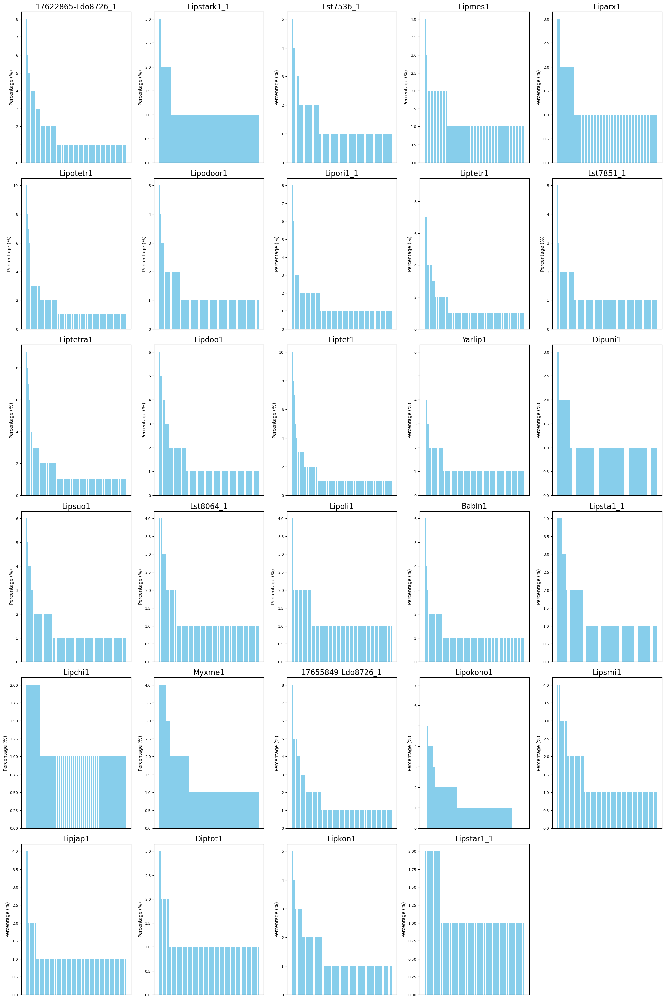

In [147]:
# Set up a 6x5 grid of subplots to accommodate 29 plots
# You'll have one empty plot in the grid
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 30))  # Adjust the figsize as needed

# Flatten the axes for easier iteration
flat_axes = axes.flatten()

# Loop through the items in code_to_percentage (up to 29)
# for idx, (code, pathway_percentage) in enumerate(non_aaz_code_to_percentage.items()):
for idx, (code, pathway_percentage) in enumerate(non_aaz_code_to_unique_pathways.items()):
 
    # If you've already plotted all 29, break out of the loop
    if idx == 29:
        break

    # Sorting pathways for better visualization
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)
    labels, values = zip(*sorted_items)
    
    flat_axes[idx].bar(labels, values, color='skyblue')
    flat_axes[idx].set_ylabel("Percentage (%)")
    flat_axes[idx].set_title(f"{modified_phrases[code]}", fontsize=16)
    
    # Remove x-labels and ticks
    flat_axes[idx].set_xticks([])
    flat_axes[idx].set_xticklabels([])
    flat_axes[idx].tick_params(axis='y', labelsize=8)

# Remove the axis for the 30th subplot which is empty
flat_axes[29].axis('off')

plt.tight_layout()
plt.savefig('visualizingNonLipst1_1Percents.png')
plt.show()



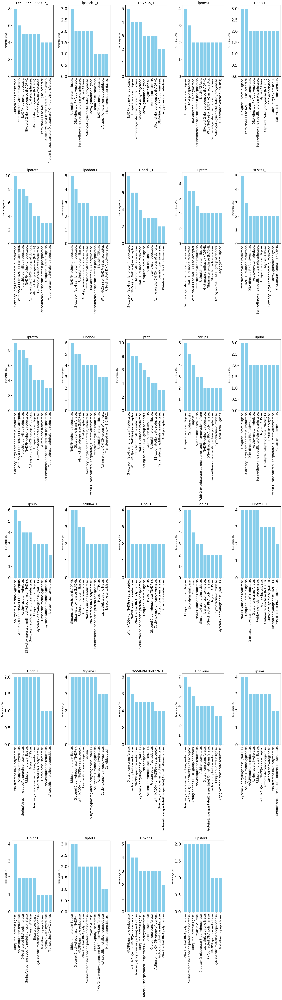

In [168]:
# Set up a 6x5 grid of subplots to accommodate 29 plots
# You'll have one empty plot in the grid
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 70))  # Adjust the figsize as needed

# Flatten the axes for easier iteration
flat_axes = axes.flatten()

# Loop through the items in code_to_percentage (up to 29)
# for idx, (code, pathway_percentage) in enumerate(non_aaz_code_to_percentage.items()):
for idx, (code, pathway_percentage) in enumerate(non_aaz_code_to_unique_pathways.items()):

    # If you've already plotted all 29, break out of the loop
    if idx == 29:
        break

    if '\\N' in pathway_percentage:
        del pathway_percentage['\\N']
    # Sorting pathways for better visualization
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)[:10]
    labels, values = zip(*sorted_items)
    
    flat_axes[idx].bar(labels, values, color='skyblue')
    flat_axes[idx].set_ylabel("Percentage (%)")
    flat_axes[idx].set_title(f"{modified_phrases[code]}", fontsize=16)
    
#     # Remove x-labels and ticks
#     flat_axes[idx].set_xticks([])
#     flat_axes[idx].set_xticklabels([])
#     flat_axes[idx].tick_params(axis='y', labelsize=8)
    # Rotate x-ticks for better visibility
    flat_axes[idx].tick_params(axis='x', rotation=90, labelsize=15)
    flat_axes[idx].tick_params(axis='y', labelsize=20)
    
    
# Remove the axis for the 30th subplot which is empty
flat_axes[29].axis('off')

plt.tight_layout()
plt.savefig('visualizingNonLipst1_1_KEGGdef_counts.png')
plt.show()



In [138]:
data_list = []

# Loop through the items in code_to_percentage
# for code, pathway_percentage in non_aaz_code_to_percentage.items():
for code, pathway_percentage in non_aaz_code_to_unique_pathways.items():

    
    if '\\N' in pathway_percentage:
        del pathway_percentage['\\N']    
    # Sorting pathways for better visualization and only keep the top 15
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)
    labels, values = zip(*sorted_items)
    
    # Create entries for each of the top 15 pathways for this species
    for label, value in zip(labels, values):
        data_list.append({
            'Species': modified_phrases[code],
            'Pathway': label,
            'Percentage': value
        })

# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(data_list)

# Save the dataframe to CSV
# df.to_csv('pathwayKEGG_ordered_counts.csv', index=False)

# Display the first few rows of the dataframe for a quick look
print(df.head())

     Species                                      Pathway  Percentage
0  Lipori1_1  3-oxoacyl-[acyl-carrier protein] reductase.           8
1  Lipori1_1          With NAD(+) or NADP(+) as acceptor.           6
2  Lipori1_1               Protochlorophyllide reductase.           6
3  Lipori1_1                     NADPH:quinone reductase.           4
4  Lipori1_1                   Ubiquitin--protein ligase.           3


In [134]:
non_aaz_code_to_unique_pathways

defaultdict(<function __main__.<lambda>()>,
            {'aaw': defaultdict(int,
                         {'L-arabinose isomerase.': 2,
                          'NADPH:quinone reductase.': 4,
                          'IgA-specific metalloendopeptidase.': 1,
                          'Metalloendopeptidases.': 1,
                          'DNA-directed RNA polymerase.': 2,
                          'Acylpyruvate hydrolase.': 1,
                          'Transposing C==C bonds.': 1,
                          'Protein-tyrosine-phosphatase.': 1,
                          'Serine/threonine specific protein phosphatase.': 2,
                          'Ubiquinol--cytochrome c reductase.': 1,
                          'Inorganic pyrophosphatase.': 1,
                          "Exoribonucleases producing 5'-phosphomonoesters.": 1,
                          'Ubiquitin--protein ligase.': 3,
                          'Myosin ATPase.': 2,
                          'Cytochrome-c oxidase.': 1,
    

In [180]:
data_list = []

# Loop through the items in code_to_percentage
# for code, pathway_percentage in non_aaz_code_to_percentage.items():
for code, pathway_percentage in non_aaz_code_to_unique_pathways.items():

    
    if '\\N' in pathway_percentage:
        del pathway_percentage['\\N']    
    # Sorting pathways for better visualization and only keep the top 15
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)

    sorted_items = [(label, value) for label, value in sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True) if int(value) > 2]
    if sorted_items:
        labels, values = zip(*sorted_items)

        # Create entries for each of the pathways for this species
        for label, value in zip(labels, values):
            data_list.append({
                'Species': modified_phrases[code],
                'Pathway': label,
                'Percentage': value
            })


# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(data_list)

# Save the dataframe to CSV
# df.to_csv('pathwayKEGG_ordered_counts.csv', index=False)

# Display the first few rows of the dataframe for a quick look
print(df.head())

     Species                                      Pathway  Percentage
0  Lipori1_1  3-oxoacyl-[acyl-carrier protein] reductase.           8
1  Lipori1_1          With NAD(+) or NADP(+) as acceptor.           6
2  Lipori1_1               Protochlorophyllide reductase.           6
3  Lipori1_1                     NADPH:quinone reductase.           4
4  Lipori1_1                   Ubiquitin--protein ligase.           3


In [182]:

# Create a pivot table
pivot_df = df.pivot_table(index='Species', columns='Pathway', values='Percentage', aggfunc='first', fill_value=0)

print(pivot_df)
pivot_df.to_csv('greater_than_2.csv')

Pathway             12-oxophytodienoate reductase.  \
Species                                              
17622865-Ldo8726_1                               0   
17655849-Ldo8726_1                               0   
Babin1                                           0   
Diptot1                                          0   
Dipuni1                                          0   
Liparx1                                          0   
Lipdoo1                                          0   
Lipjap1                                          0   
Lipkon1                                          0   
Lipmes1                                          0   
Lipodoor1                                        0   
Lipokono1                                        0   
Lipoli1                                          0   
Lipori1_1                                        0   
Lipotetr1                                        4   
Lipsmi1                                          0   
Lipsta1_1                   

In [176]:
df_pivot.to_csv('pathways_greater_than_three.csv')

In [174]:
pathways_by_species

{'17622865-Ldo8726_1': {'3-oxoacyl-[acyl-carrier protein] reductase.',
  'Acid phosphatase.',
  'Alcohol dehydrogenase (NADP+).',
  'Beta-glucosidase.',
  'Fructan beta-fructosidase.',
  'Glutathione transferase.',
  'Glycerol 2-dehydrogenase (NADP+).',
  'NADPH:quinone reductase.',
  'Protein-L-isoaspartate(D-aspartate) O-methyltransferase.',
  'Protochlorophyllide reductase.',
  'Threonine--tRNA ligase.',
  'Transferred entry: 1.6.99.2.',
  'With NAD(+) or NADP(+) as acceptor.'},
 '17655849-Ldo8726_1': {'3-oxoacyl-[acyl-carrier protein] reductase.',
  'Acid phosphatase.',
  'Alcohol dehydrogenase (NADP+).',
  'Beta-glucosidase.',
  'Fructan beta-fructosidase.',
  'Glutathione transferase.',
  'Glycerol 2-dehydrogenase (NADP+).',
  'NADPH:quinone reductase.',
  'Protein-L-isoaspartate(D-aspartate) O-methyltransferase.',
  'Protochlorophyllide reductase.',
  'Threonine--tRNA ligase.',
  'Transferred entry: 1.6.99.2.',
  'With NAD(+) or NADP(+) as acceptor.'},
 'Babin1': {'Chitinase.',


#### Repeat process for KOG terms. 

In [183]:
# Directory with .gz files.
directory = 'KOG/'

# Dictionary to hold each code's protein IDs and their corresponding pathways.
code_pathways_dict = {}
code_ecNum_dict = {}
code_def_dict = {}

errors = []
codes = []

# Load the data from each .gz file in the folder.
for filename in os.listdir(directory):
    if (filename.endswith('.tab')) and ('_eggnogec' not in filename):
        
        # Parse the code from the filename.
        code = re.split('_Gene|_Filtered',filename)[0]
        code = code.replace('_koginfo','')
        
        codes.append(code)
        
        # Dictionary to hold specific protein IDs and their corresponding pathways for the current file.
        protein_pathways = {}
        protein_ecNum = {}
        protein_definition = {}
        
        
        with open(os.path.join(directory, filename), 'rt') as file:
            data = pd.read_csv(file, sep='\t')

            for _, row in data.iterrows():
                
                try:
                    protein_id = row['proteinId']
                except:
                    protein_id = row['#proteinId']

                pathway = row['kogClass']
                ecNum = row['kogid']
                definition = row['kogdefline']


                if protein_id not in protein_pathways:
                    protein_pathways[protein_id] = []
                if protein_id not in protein_ecNum:
                    protein_ecNum[protein_id] = []
                if protein_id not in protein_definition:
                    protein_definition[protein_id] = []
                    
                protein_pathways[protein_id].append(pathway)
                protein_ecNum[protein_id].append(ecNum)
                protein_definition[protein_id].append(definition)



            code_pathways_dict[code] = protein_pathways
            code_ecNum_dict[code] = protein_ecNum
            code_def_dict[code] = protein_definition



In [123]:
# this cell determines all the pathways that are possible annotations for a group based off a JGI 
# annotation file for the species. 

# Using defaultdict to easily append pathways to a list
all_group_pathways = defaultdict(list)
all_group_ecNum = defaultdict(list)
all_group_def = defaultdict(list)


for group, entries in groups_without_aaz.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            # the JGI Kegg annotation file and the protein fasta files do not contain all of the same proteins.
            if protein_id in code_pathways_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id
                all_group_pathways[group].extend(code_pathways_dict[species][protein_id])
                
            if protein_id in code_ecNum_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id
                all_group_ecNum[group].extend(code_ecNum_dict[species][protein_id])
                
            if protein_id in code_def_dict[species]:
                
                # Extending the list to include all pathways associated with this protein_id
                all_group_def[group].extend(code_def_dict[species][protein_id])

# To remove any possible duplicates in the pathways list, convert to set and then back to list
for group in all_group_pathways:
    all_group_pathways[group] = list(set(all_group_pathways[group]))
    
for group in all_group_ecNum:
    all_group_ecNum[group] = list(set(all_group_ecNum[group]))

for group in all_group_def:
    all_group_def[group] = list(set(all_group_def[group]))

# # # Print out the combined pathways for each group
# for group, pathways in all_group_pathways.items():
#     if pathways:  # Only print if there are pathways
#         print(f"{group}: {' | '.join([p for p in pathways if isinstance(p, str)])}")

# # Print out the combined pathways for each group
for group, pathways in all_group_ecNum.items():
    if pathways:  # Only print if there are pathways
        print(f"{group}: {' | '.join([p for p in pathways if isinstance(p, str)])}")


OG0198:: KOG0254
OG0228:: KOG4641 | KOG0472 | KOG0531
OG0255:: KOG0012
OG0269:: KOG0688
OG0305:: KOG1453 | KOG1704
OG0405:: KOG0351
OG0583:: KOG1198
OG0667:: KOG0771
OG3532:: KOG4186
OG3597:: KOG3314
OG3600:: KOG3914
OG3624:: KOG2907
OG3697:: KOG4551
OG3702:: KOG1569
OG3713:: KOG1963
OG3725:: KOG0900
OG3755:: KOG1762
OG3766:: KOG0012
OG3773:: KOG1816
OG3781:: KOG1943
OG3796:: KOG0864 | KOG0866
OG3797:: KOG3808
OG3815:: KOG3311
OG3818:: KOG2969
OG3825:: KOG1535
OG3829:: KOG1572
OG3839:: KOG0548
OG3844:: KOG4840
OG3858:: KOG4148
OG3868:: KOG3422
OG3897:: KOG3494
OG3924:: KOG3385
OG3931:: KOG3497
OG3957:: KOG1913
OG3958:: KOG0766
OG3960:: KOG3178
OG4004:: KOG3419
OG4074:: KOG3188
OG4101:: KOG2044
OG4125:: KOG0978
OG4209:: KOG4708
OG4236:: KOG4756
OG4246:: KOG0516 | KOG1836 | KOG0161
OG4284:: KOG0621
OG4367:: KOG2294 | KOG3562
OG4416:: KOG2306
OG4423:: KOG0833
OG4427:: KOG0548
OG4511:: KOG0119
OG4519:: KOG2421
OG4561:: KOG4765
OG4572:: KOG0032
OG4576:: KOG1564
OG4595:: KOG2676
OG4605:: KOG

In [187]:
# this cell is a slight modification on the one above, in that it returns percents instead of counts. 
# this cell only creates the pathway outputs. 

t = defaultdict(lambda: defaultdict(int))  # Initialize as dictionary of dictionaries

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            if protein_id in code_pathways_dict[species]:
                
                # Increment the count of each pathway for this group
                for pathway in code_pathways_dict[species][protein_id]:
                    t[group][pathway] += 1
                    
# Convert counts to percentages
for group in t:
    total = sum(t[group].values())
    for pathway in t[group]:
        t[group][pathway] = (t[group][pathway] / total) * 100

# Print out the percentage of pathways for each group
for group, pathway_percentages in t.items():
    print(f"Group: {group}")
    for pathway, percent in pathway_percentages.items():
        print(f"\t{pathway}: {percent:.2f}%")

# # Print out the count of pathways for each group
# for group, pathway_counts in t.items():
#     print(f"Group: {group}")
#     for pathway, count in pathway_counts.items():
#         print(f"\t{pathway}: {count}")


Group: OG0000:
	Signal transduction mechanisms : 100.00%
Group: OG0001:
	General function prediction only : 100.00%
Group: OG0002:
	Secondary metabolites biosynthesis, transport and catabolism : 100.00%
Group: OG0003:
	Secondary metabolites biosynthesis, transport and catabolism : 100.00%
Group: OG0004:
	Nucleotide transport and metabolism : 50.00%
	Coenzyme transport and metabolism : 50.00%
Group: OG0005:
	Carbohydrate transport and metabolism : 100.00%
Group: OG0006:
	Carbohydrate transport and metabolism : 100.00%
Group: OG0007:
	General function prediction only : 100.00%
Group: OG0008:
	Secondary metabolites biosynthesis, transport and catabolism : 100.00%
Group: OG0009:
	Cytoskeleton : 100.00%
Group: OG0010:
	RNA processing and modification  : 98.56%
	Inorganic ion transport and metabolism : 1.44%
Group: OG0011:
	Carbohydrate transport and metabolism : 100.00%
Group: OG0012:
	General function prediction only : 100.00%
Group: OG0013:
	Posttranslational modification, protein turnove

In [193]:


# Count of each unique pathway for 'aaz'
non_aaz_unique_pathway_count = defaultdict(int)
for group, pathways in t.items():
    unique_pathways_out_group = set(pathways)
    for pathway in unique_pathways_out_group:
        non_aaz_unique_pathway_count[pathway] += 1

# For each code, count the unique pathways
non_aaz_code_to_unique_pathways = defaultdict(lambda: defaultdict(int))
for group, entries in groups_without_aaz.items():
    
    unique_codes_out_group = set(entry.split('|')[0] for entry in entries)
    for code in unique_codes_out_group:
        for pathway in t.get(group, []):
            if not pd.isna(pathway):
                pathway = pathway.split('\':')[0]
                print(pathway)
                non_aaz_code_to_unique_pathways[code][pathway] += 1

# Calculate percentages for each code based on 'aaz' unique pathway count
non_aaz_code_to_percentage_KOGDef = {}
for code, pathways in non_aaz_code_to_unique_pathways.items():
    non_aaz_code_to_percentage_KOGDef[code] = {pathway: (count / non_aaz_unique_pathway_count[pathway]) * 100 for pathway, count in pathways.items() if pathway in non_aaz_unique_pathway_count}

# Plot the results
# for code, pathway_percentage in code_to_percentage.items():
#     plt.figure(figsize=(15, 7))
    
#     # Sorting pathways for better visualization
#     sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)
#     labels, values = zip(*sorted_items)
    
#     plt.bar(labels, values, color='skyblue')
#     plt.ylabel("Percentage (%)")
#     plt.title(f"Percentage distribution for {code} based on 'aaz' unique pathway count")
#     plt.xticks(rotation=45, ha='right', fontsize=10)
#     plt.tight_layout()
#     plt.show()


Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major

In [189]:
non_aaz_unique_pathway_count

defaultdict(int,
            {'Signal transduction mechanisms ': 496,
             'General function prediction only ': 1294,
             'Secondary metabolites biosynthesis, transport and catabolism ': 289,
             'Nucleotide transport and metabolism ': 97,
             'Coenzyme transport and metabolism ': 107,
             'Carbohydrate transport and metabolism ': 399,
             'Cytoskeleton ': 153,
             'RNA processing and modification  ': 305,
             'Inorganic ion transport and metabolism ': 194,
             'Posttranslational modification, protein turnover, chaperones ': 588,
             'Cell wall/membrane/envelope biogenesis ': 111,
             'Transcription ': 375,
             'Amino acid transport and metabolism ': 251,
             'Lipid transport and metabolism ': 307,
             'Nuclear structure ': 124,
             'Energy production and conversion ': 375,
             'Intracellular trafficking, secretion, and vesicular transport ': 34

In [194]:
data_list = []

# Loop through the items in code_to_percentage
# for code, pathway_percentage in non_aaz_code_to_percentage.items():
for code, pathway_percentage in non_aaz_code_to_unique_pathways.items():

    
    if '\\N' in pathway_percentage:
        del pathway_percentage['\\N']    
    # Sorting pathways for better visualization and only keep the top 15
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)

    sorted_items = [(label, value) for label, value in sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True) if int(value) > 2]
    if sorted_items:
        labels, values = zip(*sorted_items)

        # Create entries for each of the pathways for this species
        for label, value in zip(labels, values):
            data_list.append({
                'Species': modified_phrases[code],
                'Pathway': label,
                'Percentage': value
            })


# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(data_list)

# Save the dataframe to CSV
# df.to_csv('pathwayKEGG_ordered_counts.csv', index=False)

# Display the first few rows of the dataframe for a quick look
print(df.head())
# Create a pivot table
pivot_df = df.pivot_table(index='Species', columns='Pathway', values='Percentage', aggfunc='first', fill_value=0)

print(pivot_df)
pivot_df.to_csv('greater_than_2_KOG.csv')

     Species                                            Pathway  Percentage
0  Lipori1_1  Predicted transporter (major facilitator super...          18
1  Lipori1_1  Reductases with broad range of substrate speci...          13
2  Lipori1_1                  Uncharacterized conserved protein          12
3  Lipori1_1  Dehydrogenases with different specificities (r...           9
4  Lipori1_1           Predicted short chain-type dehydrogenase           8
Pathway             1,4-benzoquinone reductase-like; Trp repressor binding protein-like/protoplast-secreted protein  \
Species                                                                                                               
17622865-Ldo8726_1                                                  3                                                 
17655849-Ldo8726_1                                                  3                                                 
Babin1                                                              

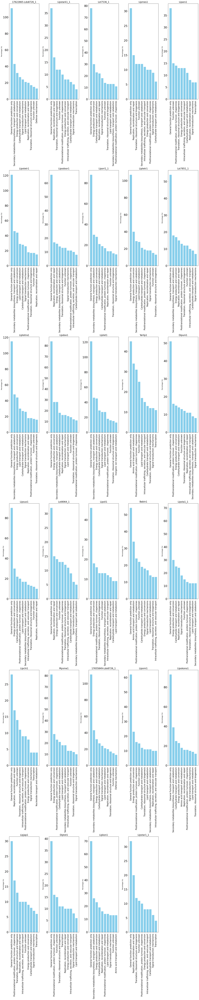

In [141]:
# Set up a 6x5 grid of subplots to accommodate 29 plots
# You'll have one empty plot in the grid
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 100))  # Adjust the figsize as needed

# Flatten the axes for easier iteration
flat_axes = axes.flatten()

# Loop through the items in code_to_percentage (up to 29)
for idx, (code, pathway_percentage) in enumerate(non_aaz_code_to_unique_pathways.items()):
    
    # If you've already plotted all 29, break out of the loop
    if idx == 29:
        break

    # Sorting pathways for better visualization
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)[:10]
    labels, values = zip(*sorted_items)
    
    flat_axes[idx].bar(labels, values, color='skyblue')
    flat_axes[idx].set_ylabel("Percentage (%)")
    flat_axes[idx].set_title(f"{modified_phrases[code]}", fontsize=16)
    
#     # Remove x-labels and ticks
#     flat_axes[idx].set_xticks([])
#     flat_axes[idx].set_xticklabels([])
#     flat_axes[idx].tick_params(axis='y', labelsize=8)
    # Rotate x-ticks for better visibility
    flat_axes[idx].tick_params(axis='x', rotation=90, labelsize=15)
    flat_axes[idx].tick_params(axis='y', labelsize=20)
    
    
# Remove the axis for the 30th subplot which is empty
flat_axes[29].axis('off')

plt.tight_layout()
plt.savefig('visualizingNonLipst1_1Percents_KOGclass_counts.png')
plt.show()



In [176]:
data_list = []

# Loop through the items in code_to_percentage
# for code, pathway_percentage in non_aaz_code_to_percentage_KOGDef.items():
for code, pathway_percentage in non_aaz_code_to_unique_pathways.items():
    
    # Sorting pathways for better visualization and only keep the top 15
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)[:15]
    labels, values = zip(*sorted_items)
    
    # Create entries for each of the top 15 pathways for this species
    for label, value in zip(labels, values):
        data_list.append({
            'Species': modified_phrases[code],
            'Pathway': label,
            'Percentage': value
        })

# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(data_list)

# Save the dataframe to CSV
df.to_csv('top_15_pathways_KOG_class_ordered_count.csv', index=False)

# Display the first few rows of the dataframe for a quick look
print(df.head())

              Species                                            Pathway  \
0  17622865-Ldo8726_1                  General function prediction only    
1  17622865-Ldo8726_1  Secondary metabolites biosynthesis, transport ...   
2  17622865-Ldo8726_1                  Energy production and conversion    
3  17622865-Ldo8726_1             Carbohydrate transport and metabolism    
4  17622865-Ldo8726_1                    Signal transduction mechanisms    

   Percentage  
0         111  
1          43  
2          32  
3          27  
4          24  


### counts for code def

In [191]:
# this cell is a slight modification on the one above, in that it returns percents instead of counts. 
# this cell only creates the pathway outputs. 

t = defaultdict(lambda: defaultdict(int))  # Initialize as dictionary of dictionaries

for group, entries in group_data.items():
    for entry in entries:
        entry_code = entry.split('|')[0]
        species = modified_phrases[entry_code]
        
        
        # two files with different names were included in the orthoMCL database for Ldo8726_1.
        # we will skip the loop for one of the species to not bias the percent counts. 
        if species == '17622865-Ldo8726_1':
            species = 'Ldo8726_1'
        elif species == '17655849-Ldo8726_1':
            pass
        
        # Check if this species (from modified_phrases) is a key in code_pathways_dict
        if species in code_pathways_dict:
            protein_id = int(entry.split('|')[1])
            
            # Check if this protein_id is a key in the dictionary for this species
            if protein_id in code_def_dict[species]:
                
                # Increment the count of each pathway for this group
                for pathway in code_def_dict[species][protein_id]:
                    t[group][pathway] += 1
                    
# Convert counts to percentages
for group in t:
    total = sum(t[group].values())
    for pathway in t[group]:
        t[group][pathway] = (t[group][pathway] / total) * 100

# Print out the percentage of pathways for each group
for group, pathway_percentages in t.items():
    print(f"Group: {group}")
    for pathway, percent in pathway_percentages.items():
        print(f"\t{pathway}: {percent:.2f}%")

# # Print out the count of pathways for each group
# for group, pathway_counts in t.items():
#     print(f"Group: {group}")
#     for pathway, count in pathway_counts.items():
#         print(f"\t{pathway}: {count}")


Group: OG0000:
	Sexual differentiation process protein ISP4: 100.00%
Group: OG0001:
	Predicted transporter (major facilitator superfamily): 100.00%
Group: OG0002:
	Multidrug/pheromone exporter, ABC superfamily: 100.00%
Group: OG0003:
	Multidrug resistance-associated protein/mitoxantrone resistance protein, ABC superfamily: 100.00%
Group: OG0004:
	Uridine permease/thiamine transporter/allantoin transport: 100.00%
Group: OG0005:
	Permease of the major facilitator superfamily: 100.00%
Group: OG0006:
	Alpha-amylase: 100.00%
Group: OG0007:
	Predicted transporter (major facilitator superfamily): 100.00%
Group: OG0008:
	Pleiotropic drug resistance proteins (PDR1-15), ABC superfamily: 100.00%
Group: OG0009:
	Ca2+-binding actin-bundling protein (spectrin), alpha chain (EF-Hand protein superfamily): 100.00%
Group: OG0010:
	mRNA splicing factor ATP-dependent RNA helicase: 59.71%
	DEAH-box RNA helicase: 38.85%
	Sulfite reductase (ferredoxin): 1.44%
Group: OG0011:
	Permease of the major facilitator

In [131]:


# Count of each unique pathway for 'aaz'
non_aaz_unique_pathway_count = defaultdict(int)
for group, pathways in t.items():
    unique_pathways_out_group = set(pathways)
    for pathway in unique_pathways_out_group:
        non_aaz_unique_pathway_count[pathway] += 1

# For each code, count the unique pathways
non_aaz_code_to_unique_pathways = defaultdict(lambda: defaultdict(int))
for group, entries in groups_without_aaz.items():
    
    unique_codes_out_group = set(entry.split('|')[0] for entry in entries)
    for code in unique_codes_out_group:
        for pathway in t.get(group, []):
            if not pd.isna(pathway):
                pathway = pathway.split('\':')[0]
                print(pathway)
                non_aaz_code_to_unique_pathways[code][pathway] += 1

# Calculate percentages for each code based on 'aaz' unique pathway count
non_aaz_code_to_percentage_KOGDef = {}
for code, pathways in non_aaz_code_to_unique_pathways.items():
    non_aaz_code_to_percentage_KOGDef[code] = {pathway: (count / non_aaz_unique_pathway_count[pathway]) * 100 for pathway, count in pathways.items() if pathway in non_aaz_unique_pathway_count}

# Plot the results
# for code, pathway_percentage in code_to_percentage.items():
#     plt.figure(figsize=(15, 7))
    
#     # Sorting pathways for better visualization
#     sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)
#     labels, values = zip(*sorted_items)
    
#     plt.bar(labels, values, color='skyblue')
#     plt.ylabel("Percentage (%)")
#     plt.title(f"Percentage distribution for {code} based on 'aaz' unique pathway count")
#     plt.xticks(rotation=45, ha='right', fontsize=10)
#     plt.tight_layout()
#     plt.show()


Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major facilitator superfamily)
Predicted transporter (major

In [192]:
data_list = []

# Loop through the items in code_to_percentage
# for code, pathway_percentage in non_aaz_code_to_percentage.items():
for code, pathway_percentage in non_aaz_code_to_unique_pathways.items():

    
    if '\\N' in pathway_percentage:
        del pathway_percentage['\\N']    
    # Sorting pathways for better visualization and only keep the top 15
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)

    sorted_items = [(label, value) for label, value in sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True) if int(value) > 2]
    if sorted_items:
        labels, values = zip(*sorted_items)

        # Create entries for each of the pathways for this species
        for label, value in zip(labels, values):
            data_list.append({
                'Species': modified_phrases[code],
                'Pathway': label,
                'Percentage': value
            })


# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(data_list)

# Save the dataframe to CSV
# df.to_csv('pathwayKEGG_ordered_counts.csv', index=False)

# Display the first few rows of the dataframe for a quick look
print(df.head())
# Create a pivot table
pivot_df = df.pivot_table(index='Species', columns='Pathway', values='Percentage', aggfunc='first', fill_value=0)

print(pivot_df)
pivot_df.to_csv('greater_than_2_KOG_def.csv')

     Species                                            Pathway  Percentage
0  Lipori1_1                  General function prediction only           88
1  Lipori1_1  Secondary metabolites biosynthesis, transport ...          30
2  Lipori1_1                  Energy production and conversion           28
3  Lipori1_1                    Lipid transport and metabolism           21
4  Lipori1_1             Carbohydrate transport and metabolism           19
Pathway             Amino acid transport and metabolism   \
Species                                                    
17622865-Ldo8726_1                                    13   
17655849-Ldo8726_1                                    13   
Babin1                                                34   
Diptot1                                                5   
Dipuni1                                                5   
Liparx1                                                3   
Lipchi1                                                0   
Lipd

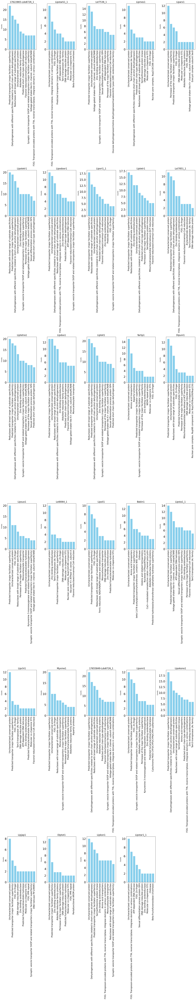

In [136]:
# Set up a 6x5 grid of subplots to accommodate 29 plots
# You'll have one empty plot in the grid
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 100))  # Adjust the figsize as needed

# Flatten the axes for easier iteration
flat_axes = axes.flatten()

# Loop through the items in code_to_percentage (up to 29)
for idx, (code, pathway_percentage) in enumerate(non_aaz_code_to_unique_pathways.items()):
    
    # If you've already plotted all 29, break out of the loop
    if idx == 29:
        break

    # Sorting pathways for better visualization
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)[:10]
    labels, values = zip(*sorted_items)
    
    flat_axes[idx].bar(labels, values, color='skyblue')
    flat_axes[idx].set_ylabel("Counts")
    flat_axes[idx].set_title(f"{modified_phrases[code]}", fontsize=16)
    
#     # Remove x-labels and ticks
#     flat_axes[idx].set_xticks([])
#     flat_axes[idx].set_xticklabels([])
#     flat_axes[idx].tick_params(axis='y', labelsize=8)
    # Rotate x-ticks for better visibility
    flat_axes[idx].tick_params(axis='x', rotation=90, labelsize=15)
    flat_axes[idx].tick_params(axis='y', labelsize=20)
    
    
# Remove the axis for the 30th subplot which is empty
flat_axes[29].axis('off')

plt.tight_layout()
plt.savefig('visualizingNonLipst1_1Counts_KOGdef.png')
plt.show()



In [137]:
data_list = []

# Loop through the items in code_to_percentage
for code, pathway_percentage in non_aaz_code_to_unique_pathways.items():
    # Sorting pathways for better visualization and only keep the top 15
    sorted_items = sorted(pathway_percentage.items(), key=lambda x: x[1], reverse=True)[:15]
    labels, values = zip(*sorted_items)
    
    # Create entries for each of the top 15 pathways for this species
    for label, value in zip(labels, values):
        data_list.append({
            'Species': modified_phrases[code],
            'Pathway': label,
            'Percentage': value
        })

# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(data_list)

# Save the dataframe to CSV
df.to_csv('top_15_pathways_KOG_Def_counts_ordered.csv', index=False)

# Display the first few rows of the dataframe for a quick look
print(df.head())

              Species                                            Pathway  \
0  17622865-Ldo8726_1  Predicted transporter (major facilitator super...   
1  17622865-Ldo8726_1  Dehydrogenases with different specificities (r...   
2  17622865-Ldo8726_1  Reductases with broad range of substrate speci...   
3  17622865-Ldo8726_1                  Uncharacterized conserved protein   
4  17622865-Ldo8726_1                Aldo/keto reductase family proteins   

   Percentage  
0          22  
1          17  
2          15  
3          13  
4           9  
